# Warning : 
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [ ]:
!wget http://webia.lip6.fr/~dancette/deep-learning/assets/TP3-4/TP3-4.zip
!unzip -j TP3-4.zip

--2021-10-20 16:44:59--  http://webia.lip6.fr/~dancette/deep-learning/assets/TP3-4/TP3-4.zip
Resolving webia.lip6.fr (webia.lip6.fr)... 132.227.201.33
Connecting to webia.lip6.fr (webia.lip6.fr)|132.227.201.33|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13421167 (13M) [application/zip]
Saving to: ‘TP3-4.zip.2’

TP3-4.zip.2         100%[===================>]  12.80M  8.26MB/s    in 1.5s    

2021-10-20 16:45:01 (8.26 MB/s) - ‘TP3-4.zip.2’ saved [13421167/13421167]

Archive:  TP3-4.zip
replace tme5.py? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: tme5.py                 
  inflating: mnist.mat               
  inflating: circles.py              
  inflating: circles.mat             


In [ ]:
import math
import torch
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%run 'tme5.py'

# Part 1 : Forward and backward passes "by hands"

In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}
    
    #####################
    ## Your code here  ##
    #####################
    # fill values for Wh, Wy, bh, by
    
    params["Wh"] = torch.randn((nh,nx))*0.3
    params["Wy"] = torch.randn((ny,nh))*0.3
    params["bh"] = torch.zeros(nh)
    params["by"] = torch.zeros(ny)
    
    ####################
    ##      END        #
    ####################
    return params

In [ ]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    bsize = X.size(0)
    nh = params['Wh'].size(0)
    ny = params['Wy'].size(0)
    outputs = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for X, htilde, h, ytilde, yhat
    
    outputs["X"] = X
    outputs["htilde"] = outputs["X"].mm(params['Wh'].t())+params['bh'].t()
    outputs["h"] = torch.tanh(outputs["htilde"])
    outputs["ytilde"] = outputs["h"].mm(params['Wy'].t())+params['by'].t()
    outputs["yhat"] = torch.exp(outputs["ytilde"])/torch.sum(torch.exp(outputs["ytilde"]),1)[:,None]
    
    ####################
    ##      END        #
    ####################

    return outputs['yhat'], outputs

In [ ]:
a = torch.tensor([[1, 1, 1],
                  [ 2, 2, 2],
                  [ 3, 3, 3],])
#torch.sum(a,1)
torch.div(a,torch.sum(a,1)[:,None])
#torch.sum(a)[:,None]

tensor([[0.3333, 0.3333, 0.3333],
        [0.3333, 0.3333, 0.3333],
        [0.3333, 0.3333, 0.3333]])

In [ ]:
def loss_accuracy(Yhat, Y):

    #####################
    ## Your code here  ##
    #####################

    L = -torch.mean(torch.sum(Y*torch.log(Yhat),1),0)
    acc= (torch.argmax(Yhat,1) == torch.argmax(Y,1)).sum().item()/Y.size(0)
  
    ####################
    ##      END        #
    ####################

    return L, acc

In [ ]:
a = torch.tensor([[0.3, 0.3, 0.4],
                  [ 0.1, 0.1, 0.8],
                  [ 0.1, 0.6, 0.3],])
b = torch.tensor([[0, 0, 1],
                  [ 0, 0, 1],
                  [ 0, 1, 0],])

loss_accuracy(a, b)

(tensor(0.5501), 1.0)

In [ ]:
def backward(params, outputs, Y):
    bsize = Y.shape[0]
    grads = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for Wy, Wh, by, bh
    ##print(Y)
    grad_yHat=outputs["yhat"] - Y
    grads["Wy"] = (grad_yHat.t()).mm(outputs["h"])
    grad_h_hat= (grad_yHat.mm(params['Wy']))*(1-outputs["h"]**2)
    grads["Wh"] = (grad_h_hat.t()).mm(outputs["X"])
    grads["by"] = torch.sum(grad_yHat,0).t()/bsize
    grads["bh"] = torch.sum(grad_h_hat,0).t()/bsize
    
    ####################
    ##      END        #
    ####################
    return grads

In [ ]:
def sgd(params, grads, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the params values

    params["Wh"] -= eta * grads["Wh"]
    params["Wy"] -= eta * grads["Wy"]
    params["bh"] -= eta * grads["bh"]
    params["by"] -= eta * grads["by"]    

    ####################
    ##      END        #
    ####################
    return params

## Global learning procedure "by hands"

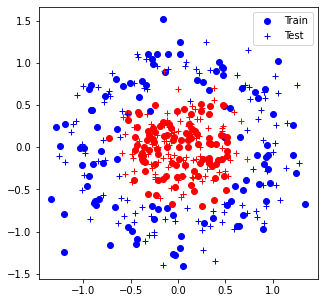

Iter 0: Acc train 53.0% (0.69), acc test 51.0% (0.70)


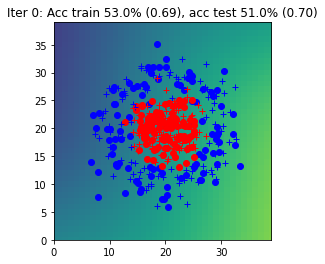

Iter 1: Acc train 48.0% (0.69), acc test 52.0% (0.69)


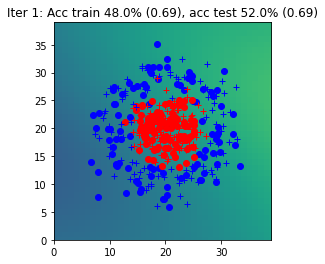

Iter 2: Acc train 54.0% (0.69), acc test 57.0% (0.69)


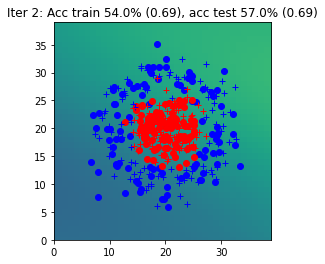

Iter 3: Acc train 52.0% (0.69), acc test 53.5% (0.69)


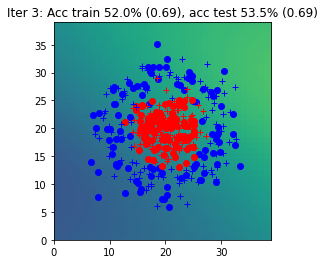

Iter 4: Acc train 49.0% (0.69), acc test 52.5% (0.69)


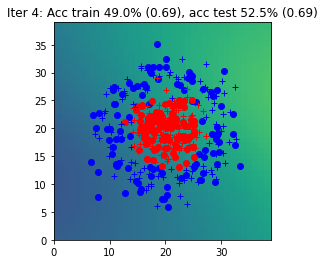

Iter 5: Acc train 57.5% (0.69), acc test 59.5% (0.69)


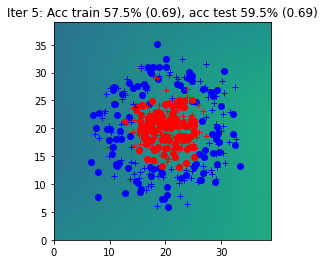

Iter 6: Acc train 57.5% (0.69), acc test 60.5% (0.69)


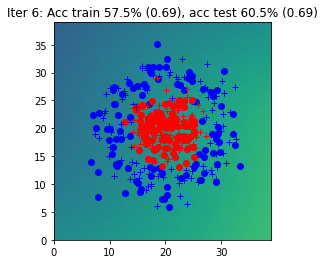

Iter 7: Acc train 58.5% (0.69), acc test 60.0% (0.69)


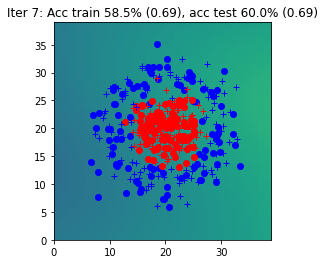

Iter 8: Acc train 62.0% (0.69), acc test 61.0% (0.69)


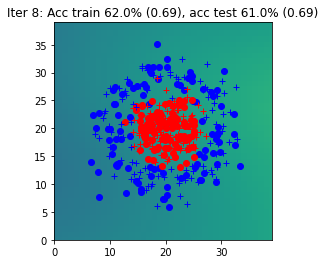

Iter 9: Acc train 55.0% (0.69), acc test 58.0% (0.69)


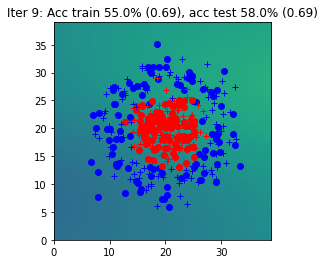

Iter 10: Acc train 57.5% (0.69), acc test 59.0% (0.69)


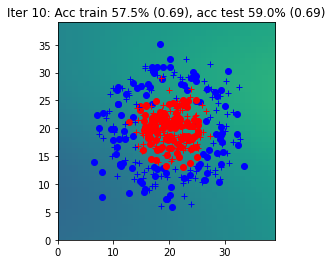

Iter 11: Acc train 60.0% (0.69), acc test 60.5% (0.69)


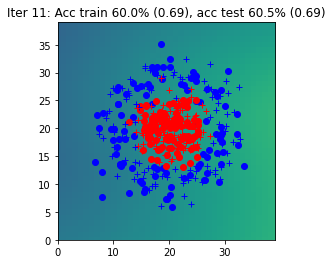

Iter 12: Acc train 62.5% (0.69), acc test 64.5% (0.69)


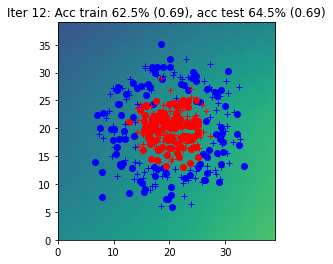

Iter 13: Acc train 62.0% (0.69), acc test 61.5% (0.69)


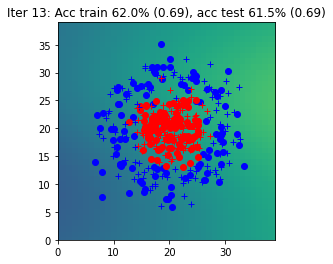

Iter 14: Acc train 70.0% (0.69), acc test 67.5% (0.69)


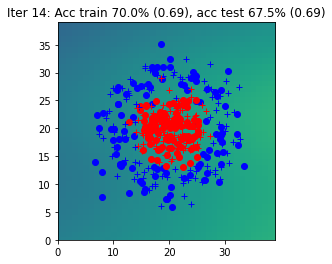

Iter 15: Acc train 61.5% (0.69), acc test 59.0% (0.69)


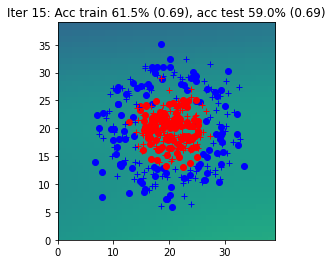

Iter 16: Acc train 61.5% (0.69), acc test 60.5% (0.69)


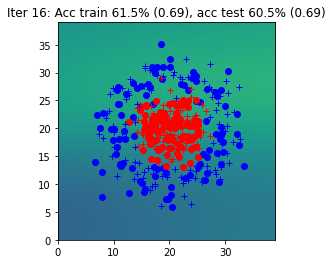

Iter 17: Acc train 63.0% (0.68), acc test 65.5% (0.68)


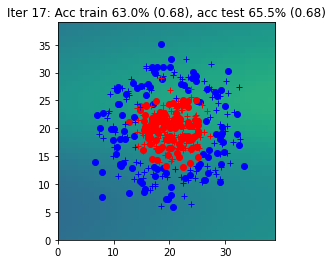

Iter 18: Acc train 65.5% (0.68), acc test 61.5% (0.68)


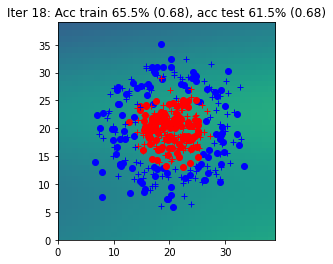

Iter 19: Acc train 63.5% (0.68), acc test 64.5% (0.68)


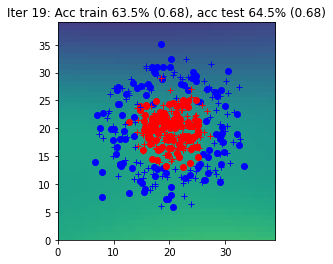

Iter 20: Acc train 73.5% (0.67), acc test 72.0% (0.68)


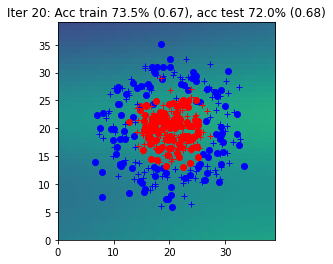

Iter 21: Acc train 62.0% (0.67), acc test 61.0% (0.67)


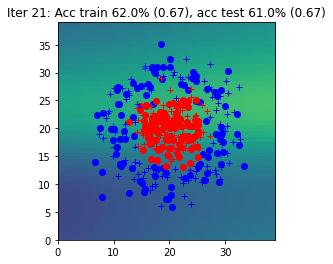

Iter 22: Acc train 74.0% (0.66), acc test 68.5% (0.66)


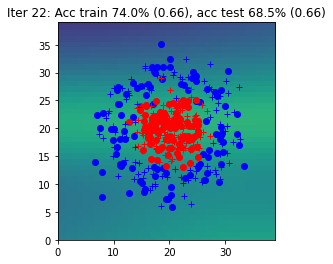

Iter 23: Acc train 69.0% (0.65), acc test 70.0% (0.65)


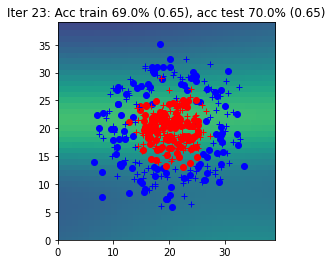

Iter 24: Acc train 72.0% (0.64), acc test 72.0% (0.64)


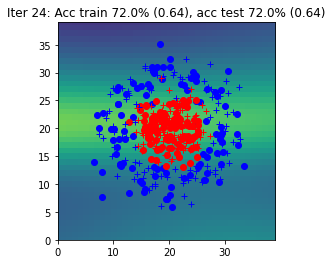

Iter 25: Acc train 72.0% (0.63), acc test 72.0% (0.63)


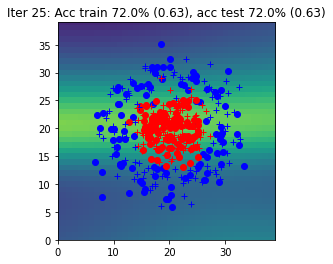

Iter 26: Acc train 76.5% (0.62), acc test 76.0% (0.62)


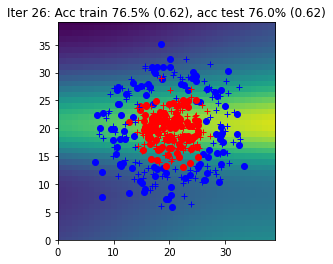

Iter 27: Acc train 77.0% (0.60), acc test 77.0% (0.60)


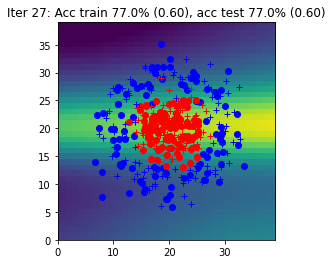

Iter 28: Acc train 79.0% (0.59), acc test 81.5% (0.59)


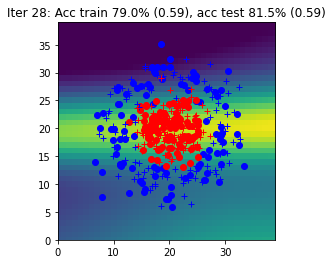

Iter 29: Acc train 79.5% (0.58), acc test 80.5% (0.58)


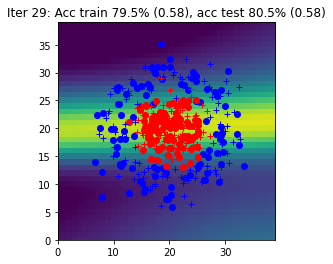

Iter 30: Acc train 78.0% (0.56), acc test 79.0% (0.56)


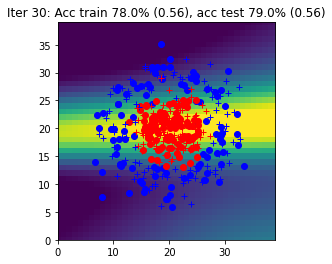

Iter 31: Acc train 78.5% (0.55), acc test 81.0% (0.55)


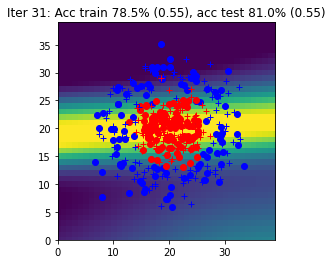

Iter 32: Acc train 77.0% (0.55), acc test 81.5% (0.55)


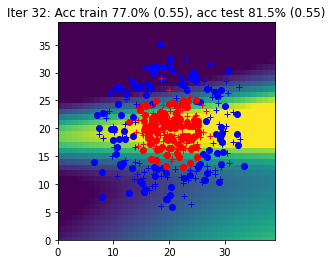

Iter 33: Acc train 80.0% (0.53), acc test 78.0% (0.54)


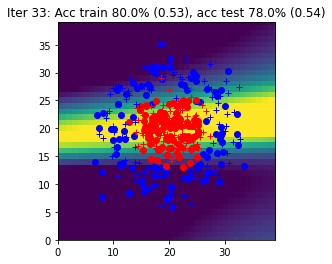

Iter 34: Acc train 79.5% (0.53), acc test 81.5% (0.53)


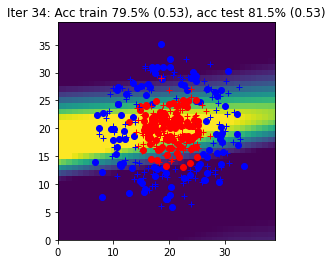

Iter 35: Acc train 79.5% (0.52), acc test 80.0% (0.52)


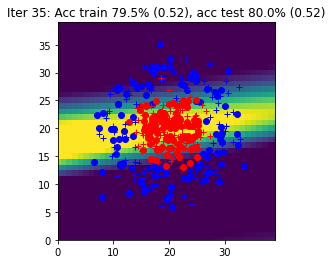

Iter 36: Acc train 79.5% (0.51), acc test 79.0% (0.52)


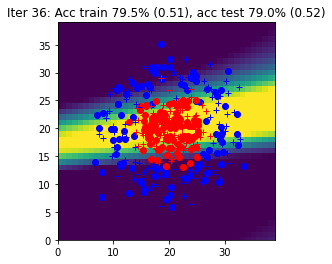

Iter 37: Acc train 79.5% (0.50), acc test 80.5% (0.51)


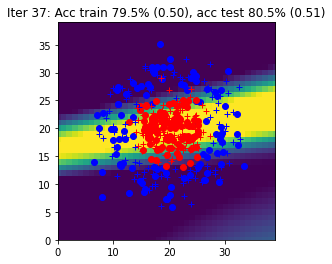

Iter 38: Acc train 78.5% (0.50), acc test 79.5% (0.50)


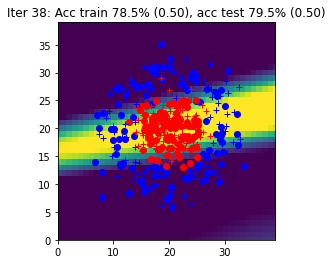

Iter 39: Acc train 77.5% (0.49), acc test 79.5% (0.50)


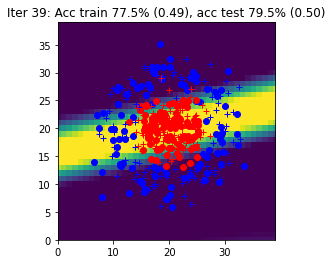

Iter 40: Acc train 77.0% (0.49), acc test 80.0% (0.49)


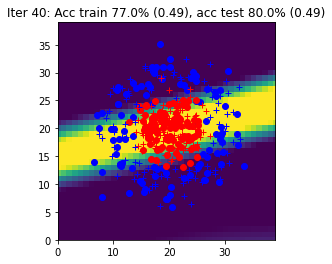

Iter 41: Acc train 77.0% (0.49), acc test 78.5% (0.49)


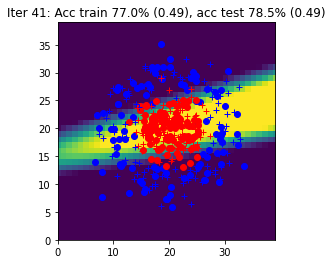

Iter 42: Acc train 78.0% (0.49), acc test 75.5% (0.50)


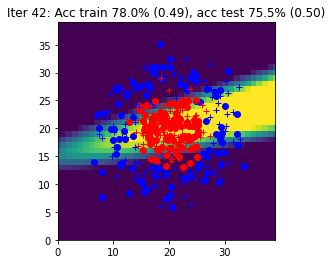

Iter 43: Acc train 79.0% (0.49), acc test 80.5% (0.50)


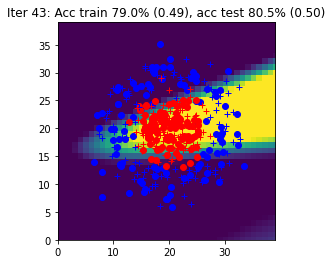

Iter 44: Acc train 79.0% (0.48), acc test 78.5% (0.48)


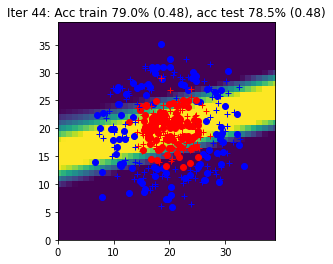

Iter 45: Acc train 78.5% (0.48), acc test 78.5% (0.48)


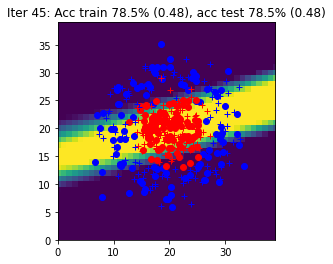

Iter 46: Acc train 78.5% (0.48), acc test 79.0% (0.48)


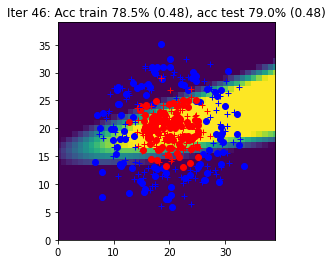

Iter 47: Acc train 81.0% (0.48), acc test 79.5% (0.49)


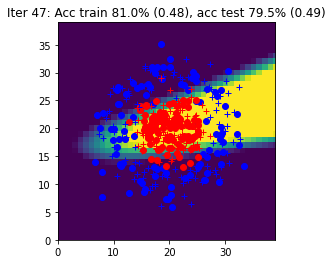

Iter 48: Acc train 80.0% (0.47), acc test 79.5% (0.49)


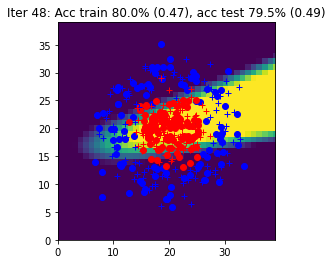

Iter 49: Acc train 80.5% (0.47), acc test 79.0% (0.48)


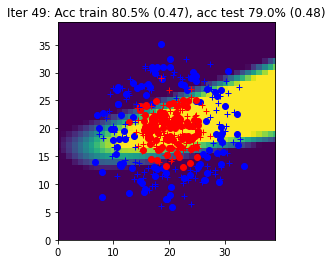

Iter 50: Acc train 79.0% (0.47), acc test 79.5% (0.48)


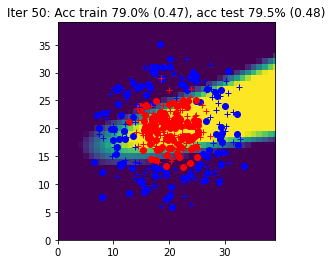

Iter 51: Acc train 80.0% (0.46), acc test 79.5% (0.47)


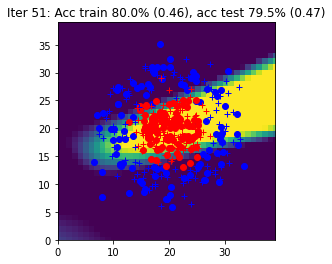

Iter 52: Acc train 80.5% (0.46), acc test 80.0% (0.48)


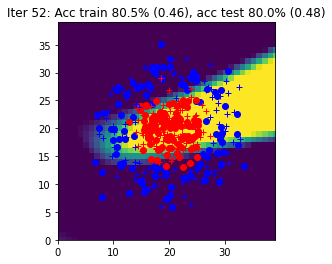

Iter 53: Acc train 81.0% (0.45), acc test 79.5% (0.46)


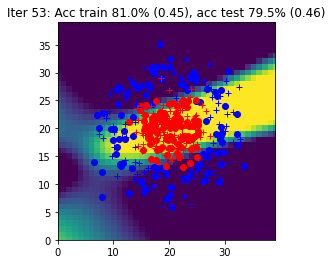

Iter 54: Acc train 79.0% (0.45), acc test 79.0% (0.45)


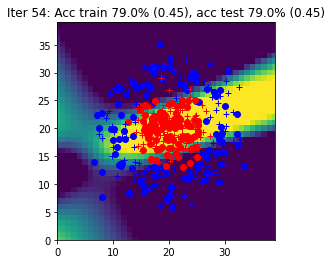

Iter 55: Acc train 84.0% (0.44), acc test 81.5% (0.46)


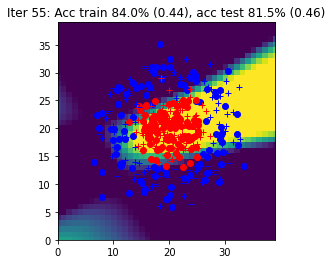

Iter 56: Acc train 83.5% (0.42), acc test 82.5% (0.43)


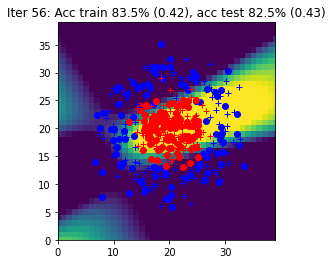

Iter 57: Acc train 84.0% (0.41), acc test 84.0% (0.42)


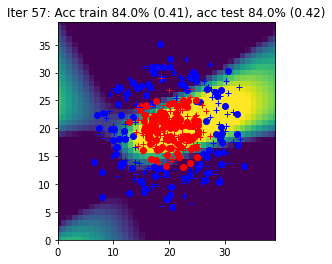

Iter 58: Acc train 84.0% (0.39), acc test 84.0% (0.40)


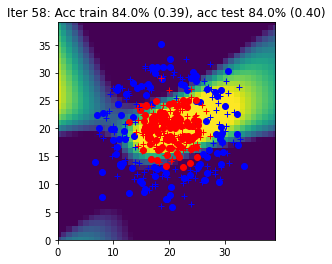

Iter 59: Acc train 86.0% (0.37), acc test 86.0% (0.38)


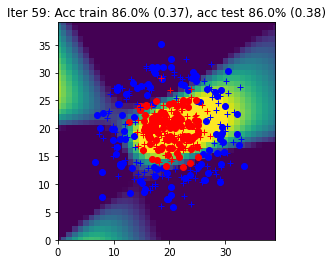

Iter 60: Acc train 85.5% (0.36), acc test 88.5% (0.36)


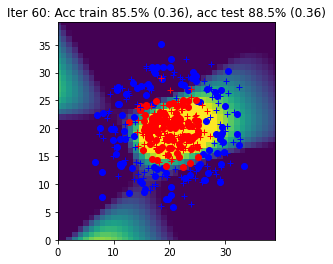

Iter 61: Acc train 90.5% (0.33), acc test 90.5% (0.33)


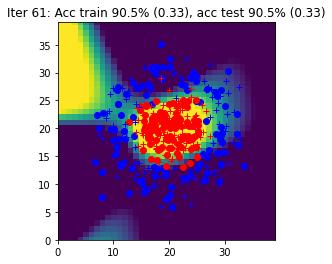

Iter 62: Acc train 91.5% (0.31), acc test 93.0% (0.33)


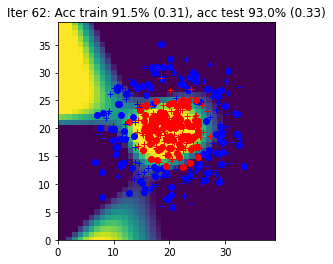

Iter 63: Acc train 93.0% (0.29), acc test 95.0% (0.29)


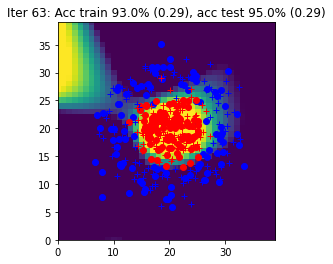

Iter 64: Acc train 94.5% (0.27), acc test 94.0% (0.28)


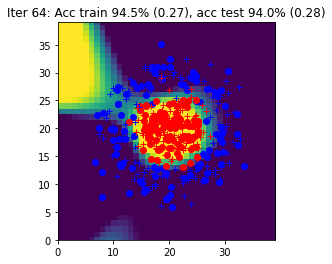

Iter 65: Acc train 95.5% (0.26), acc test 94.0% (0.27)


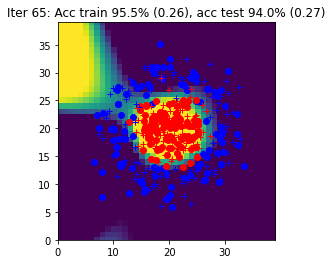

Iter 66: Acc train 95.0% (0.24), acc test 96.0% (0.26)


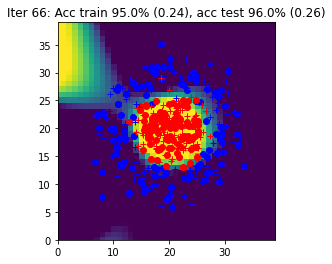

Iter 67: Acc train 92.5% (0.25), acc test 91.5% (0.29)


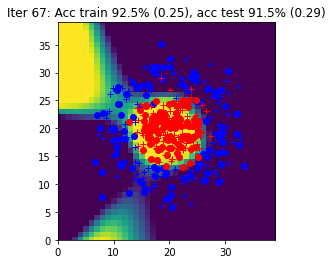

Iter 68: Acc train 95.5% (0.22), acc test 95.0% (0.25)


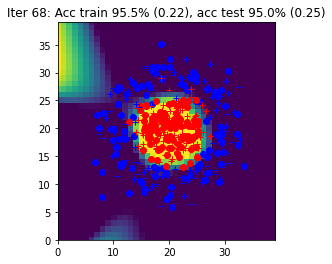

Iter 69: Acc train 96.5% (0.22), acc test 95.0% (0.24)


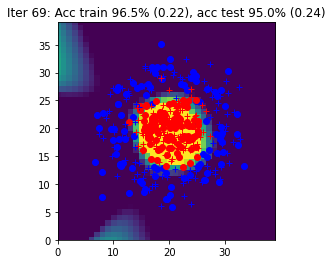

Iter 70: Acc train 95.0% (0.21), acc test 93.5% (0.22)


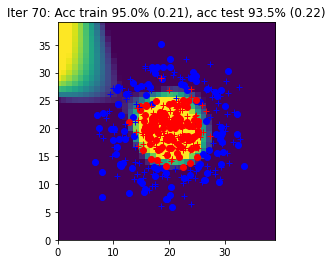

Iter 71: Acc train 94.5% (0.21), acc test 93.0% (0.23)


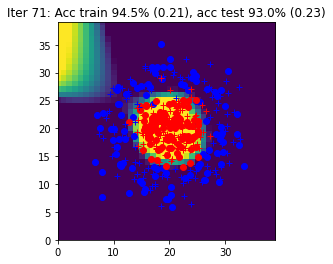

Iter 72: Acc train 97.0% (0.19), acc test 95.0% (0.22)


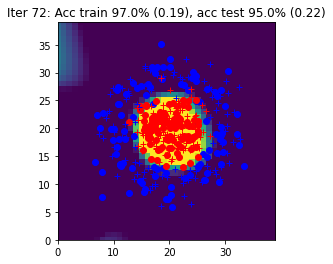

Iter 73: Acc train 96.5% (0.19), acc test 93.5% (0.23)


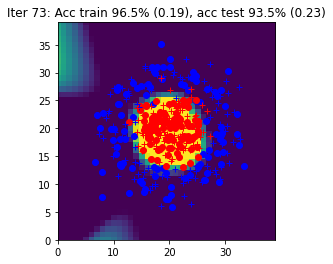

Iter 74: Acc train 96.0% (0.19), acc test 93.5% (0.21)


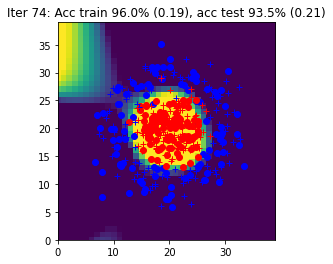

Iter 75: Acc train 96.5% (0.18), acc test 95.0% (0.19)


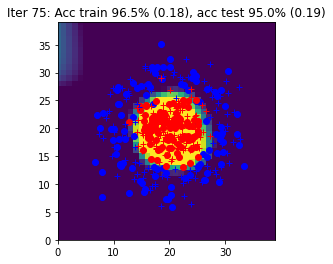

Iter 76: Acc train 94.0% (0.18), acc test 93.5% (0.21)


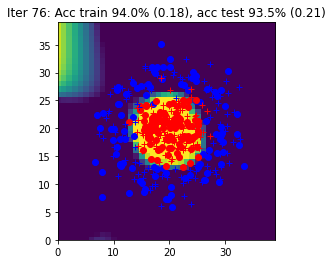

Iter 77: Acc train 94.0% (0.17), acc test 94.0% (0.20)


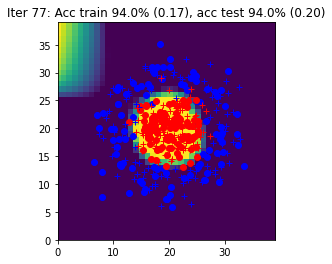

Iter 78: Acc train 96.5% (0.16), acc test 95.0% (0.18)


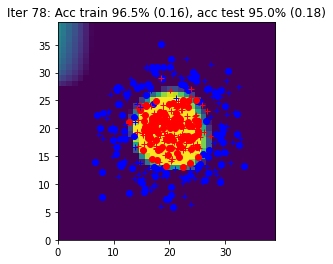

Iter 79: Acc train 96.0% (0.16), acc test 94.5% (0.18)


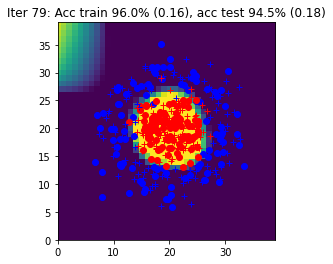

Iter 80: Acc train 96.5% (0.16), acc test 95.5% (0.18)


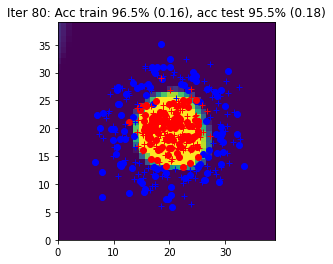

Iter 81: Acc train 96.5% (0.16), acc test 94.0% (0.18)


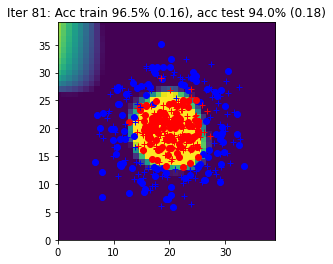

Iter 82: Acc train 97.0% (0.15), acc test 94.5% (0.18)


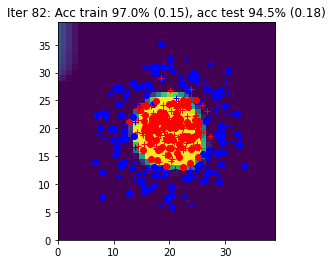

Iter 83: Acc train 96.5% (0.15), acc test 95.5% (0.17)


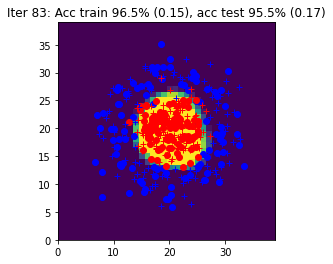

Iter 84: Acc train 96.5% (0.15), acc test 95.0% (0.16)


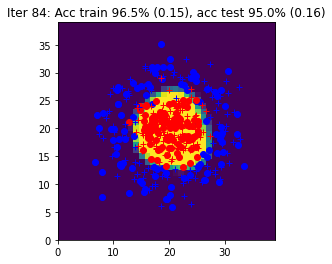

Iter 85: Acc train 96.5% (0.15), acc test 94.0% (0.17)


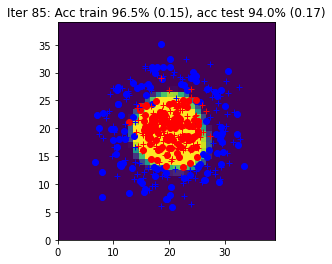

Iter 86: Acc train 96.0% (0.14), acc test 95.5% (0.16)


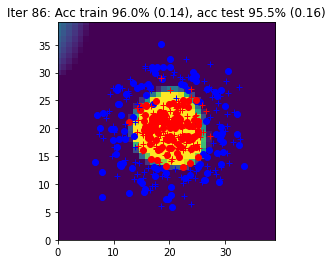

Iter 87: Acc train 96.0% (0.14), acc test 95.5% (0.16)


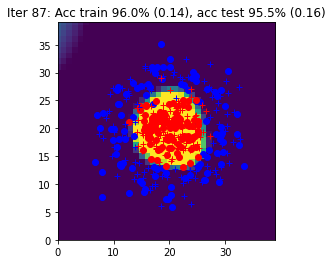

Iter 88: Acc train 95.5% (0.15), acc test 93.0% (0.18)


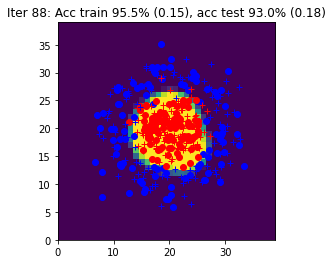

Iter 89: Acc train 95.0% (0.14), acc test 94.0% (0.17)


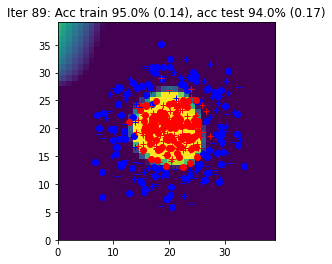

Iter 90: Acc train 96.5% (0.14), acc test 94.0% (0.18)


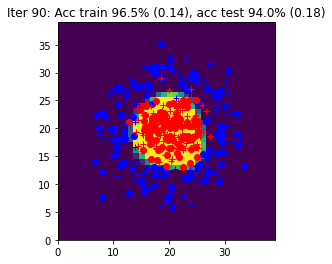

Iter 91: Acc train 95.5% (0.14), acc test 95.0% (0.16)


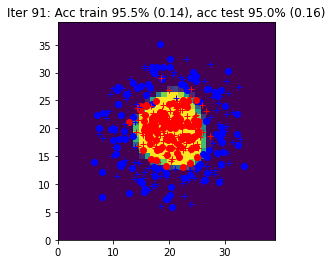

Iter 92: Acc train 96.5% (0.14), acc test 94.5% (0.15)


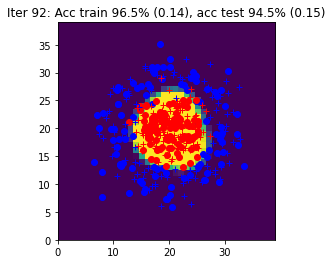

Iter 93: Acc train 95.0% (0.14), acc test 95.5% (0.16)


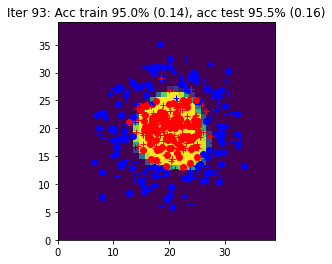

Iter 94: Acc train 94.5% (0.14), acc test 94.5% (0.15)


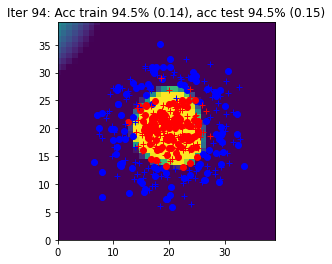

Iter 95: Acc train 96.0% (0.13), acc test 94.5% (0.16)


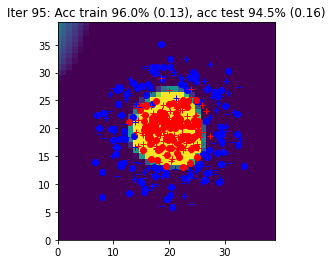

Iter 96: Acc train 97.0% (0.13), acc test 95.5% (0.14)


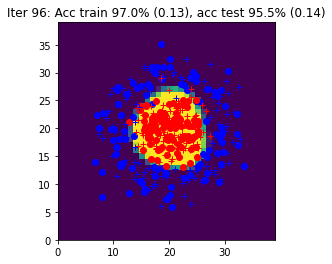

Iter 97: Acc train 97.0% (0.13), acc test 95.0% (0.15)


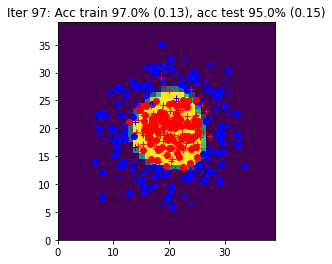

Iter 98: Acc train 96.5% (0.13), acc test 94.0% (0.16)


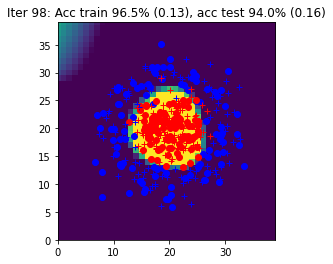

Iter 99: Acc train 94.0% (0.14), acc test 93.0% (0.17)


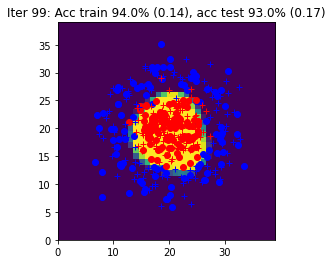

Iter 100: Acc train 96.0% (0.12), acc test 95.0% (0.15)


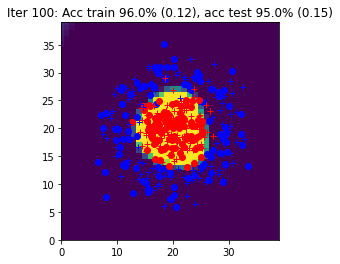

Iter 101: Acc train 97.0% (0.13), acc test 94.5% (0.17)


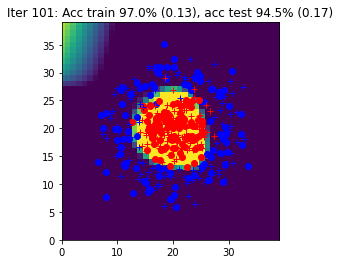

Iter 102: Acc train 94.5% (0.14), acc test 94.0% (0.16)


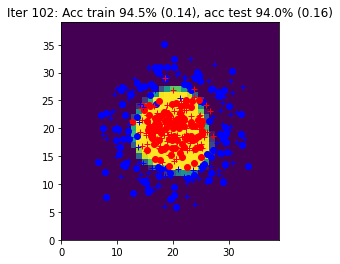

Iter 103: Acc train 96.5% (0.13), acc test 95.5% (0.14)


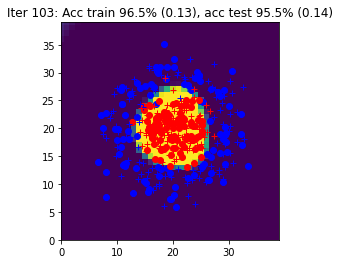

Iter 104: Acc train 94.5% (0.13), acc test 94.5% (0.16)


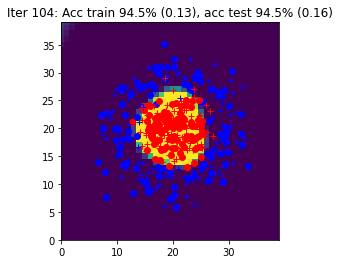

Iter 105: Acc train 96.5% (0.13), acc test 96.0% (0.14)


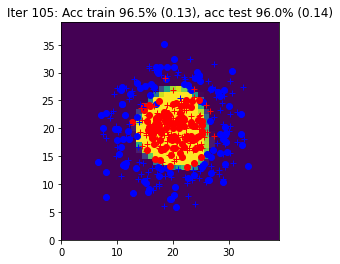

Iter 106: Acc train 95.5% (0.13), acc test 96.0% (0.14)


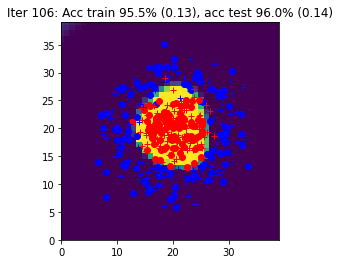

Iter 107: Acc train 95.0% (0.13), acc test 93.5% (0.16)


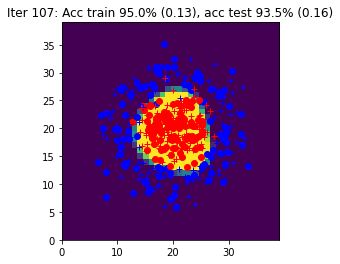

Iter 108: Acc train 94.5% (0.13), acc test 93.5% (0.17)


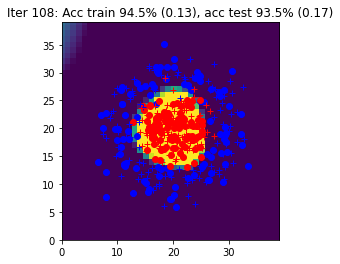

Iter 109: Acc train 96.0% (0.12), acc test 94.0% (0.15)


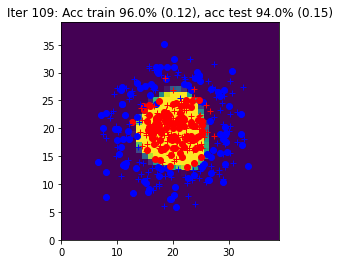

Iter 110: Acc train 95.5% (0.12), acc test 93.0% (0.16)


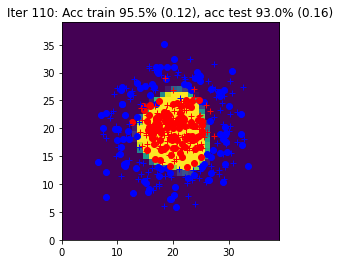

Iter 111: Acc train 96.0% (0.12), acc test 94.5% (0.17)


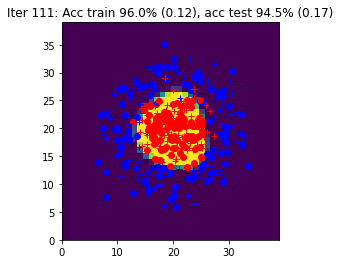

Iter 112: Acc train 95.5% (0.12), acc test 94.5% (0.17)


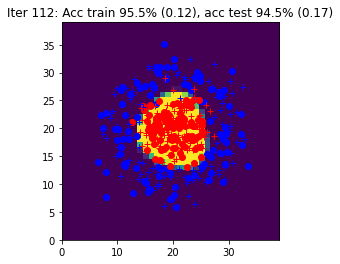

Iter 113: Acc train 96.0% (0.12), acc test 94.5% (0.15)


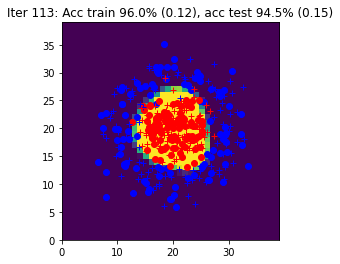

Iter 114: Acc train 95.0% (0.13), acc test 94.5% (0.14)


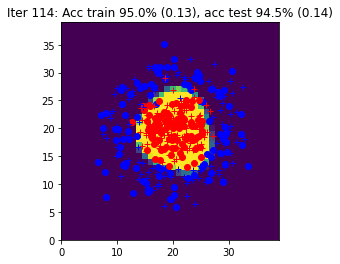

Iter 115: Acc train 94.5% (0.12), acc test 95.0% (0.17)


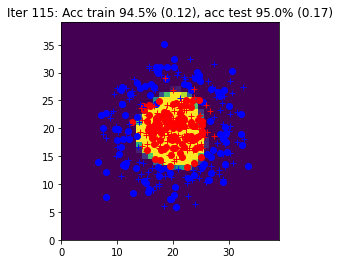

Iter 116: Acc train 95.5% (0.13), acc test 94.0% (0.17)


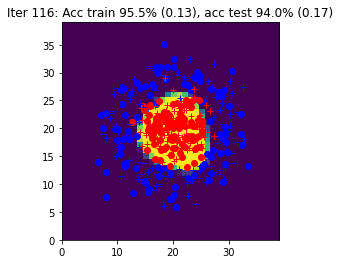

Iter 117: Acc train 97.5% (0.12), acc test 94.5% (0.17)


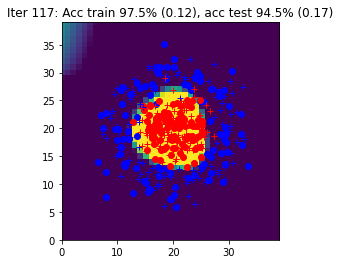

Iter 118: Acc train 96.5% (0.11), acc test 94.0% (0.16)


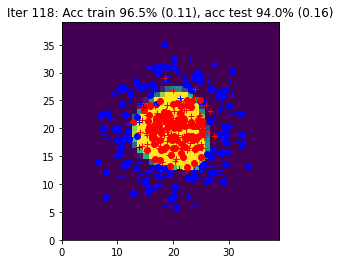

Iter 119: Acc train 96.5% (0.11), acc test 94.0% (0.16)


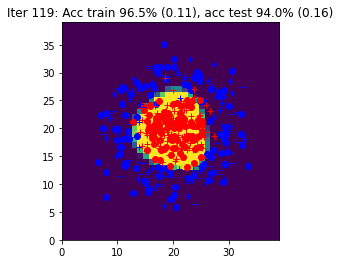

Iter 120: Acc train 96.5% (0.11), acc test 94.0% (0.15)


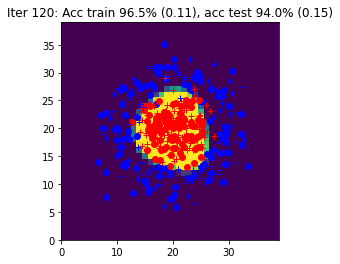

Iter 121: Acc train 94.0% (0.13), acc test 94.0% (0.14)


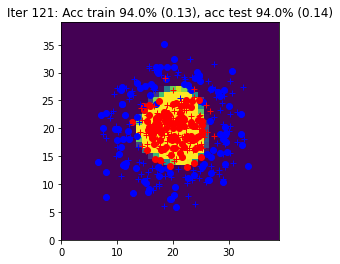

Iter 122: Acc train 95.5% (0.12), acc test 94.0% (0.15)


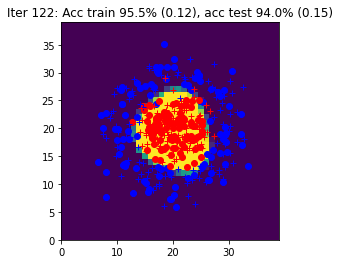

Iter 123: Acc train 95.0% (0.12), acc test 96.0% (0.14)


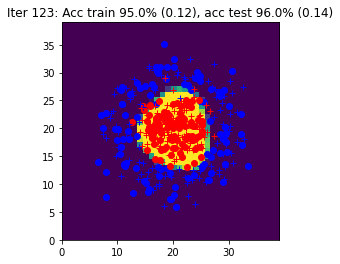

Iter 124: Acc train 93.5% (0.13), acc test 92.5% (0.18)


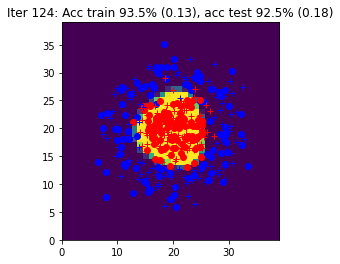

Iter 125: Acc train 97.0% (0.12), acc test 94.0% (0.18)


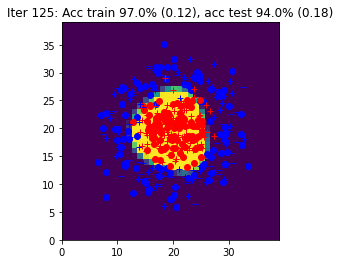

Iter 126: Acc train 97.0% (0.11), acc test 95.5% (0.14)


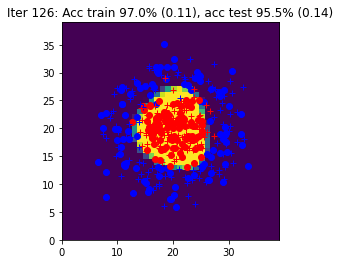

Iter 127: Acc train 97.0% (0.11), acc test 94.0% (0.15)


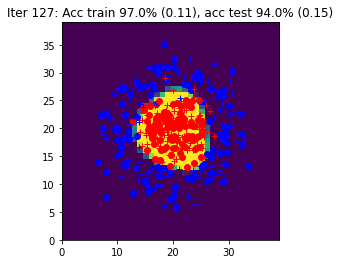

Iter 128: Acc train 94.5% (0.12), acc test 94.0% (0.19)


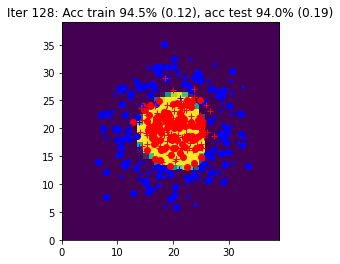

Iter 129: Acc train 95.5% (0.11), acc test 94.0% (0.16)


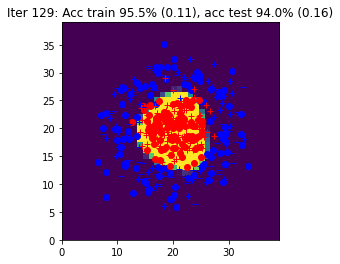

Iter 130: Acc train 96.0% (0.12), acc test 93.5% (0.15)


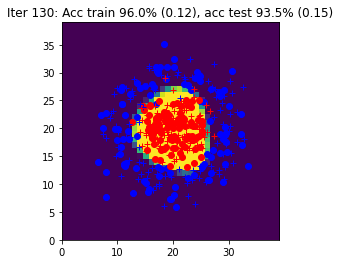

Iter 131: Acc train 96.0% (0.11), acc test 95.0% (0.14)


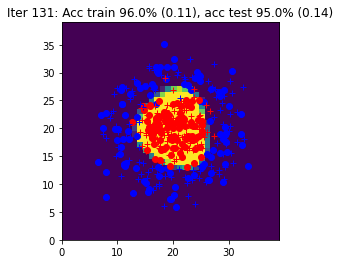

Iter 132: Acc train 96.5% (0.11), acc test 93.5% (0.16)


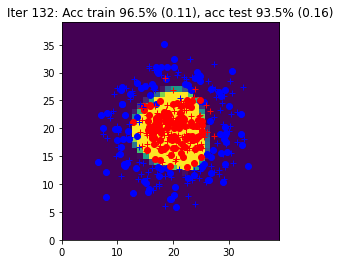

Iter 133: Acc train 95.5% (0.11), acc test 94.5% (0.15)


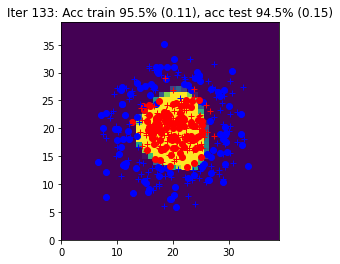

Iter 134: Acc train 96.0% (0.11), acc test 95.0% (0.14)


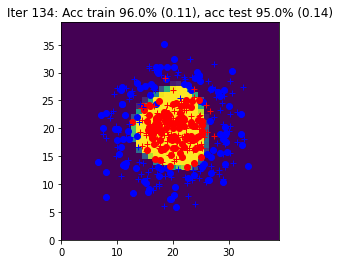

Iter 135: Acc train 96.5% (0.11), acc test 94.5% (0.15)


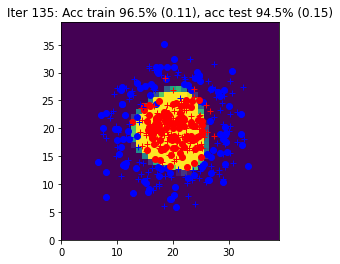

Iter 136: Acc train 97.0% (0.11), acc test 93.0% (0.16)


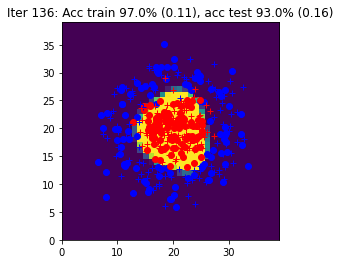

Iter 137: Acc train 96.5% (0.11), acc test 93.5% (0.17)


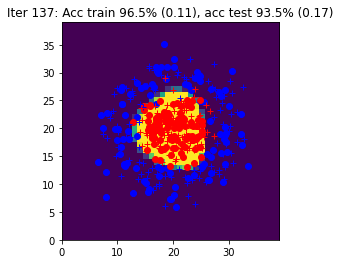

Iter 138: Acc train 97.5% (0.11), acc test 94.0% (0.17)


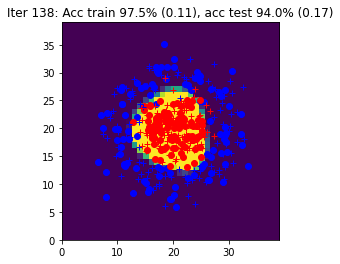

Iter 139: Acc train 97.5% (0.11), acc test 94.5% (0.16)


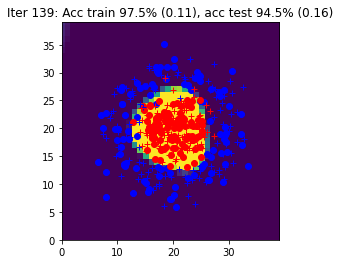

Iter 140: Acc train 97.5% (0.11), acc test 94.0% (0.17)


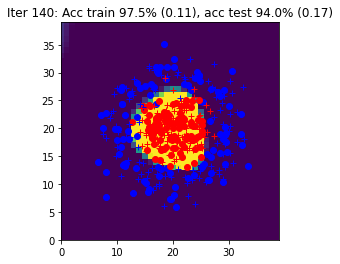

Iter 141: Acc train 97.0% (0.10), acc test 94.0% (0.16)


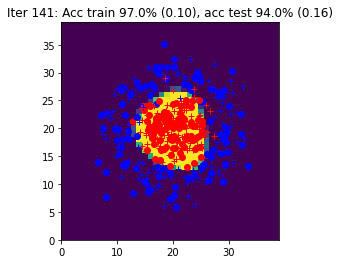

Iter 142: Acc train 95.5% (0.11), acc test 93.5% (0.17)


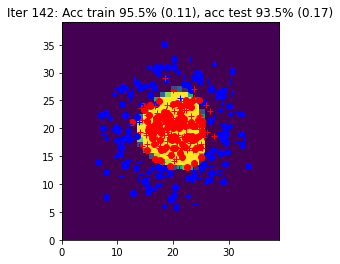

Iter 143: Acc train 96.0% (0.11), acc test 93.0% (0.16)


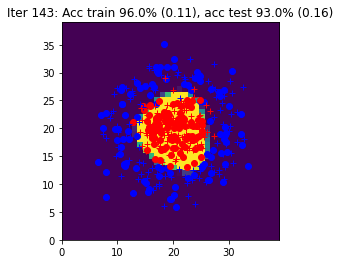

Iter 144: Acc train 96.5% (0.10), acc test 95.5% (0.15)


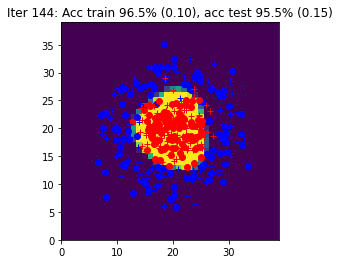

Iter 145: Acc train 95.0% (0.11), acc test 94.5% (0.15)


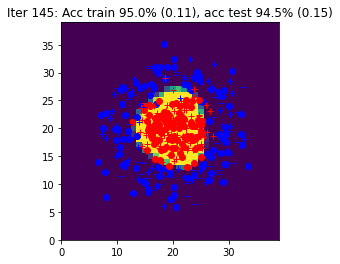

Iter 146: Acc train 97.5% (0.11), acc test 95.0% (0.15)


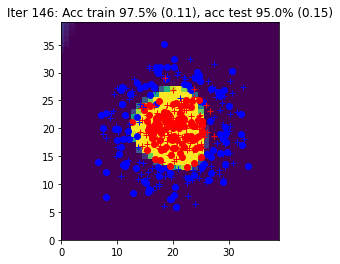

Iter 147: Acc train 95.0% (0.11), acc test 94.0% (0.17)


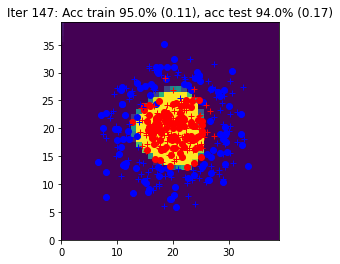

Iter 148: Acc train 96.0% (0.11), acc test 94.0% (0.17)


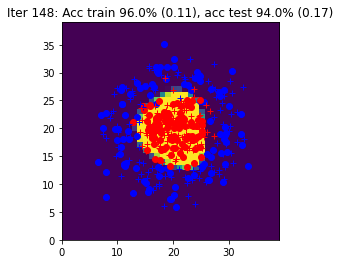

Iter 149: Acc train 95.5% (0.11), acc test 93.0% (0.15)


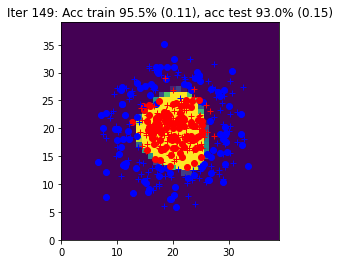

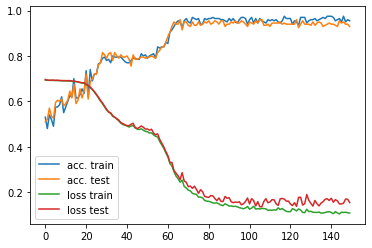

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    tloss=0
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        yhat,outputs=forward(params,X)

        params=sgd(params,backward(params, outputs, Y),eta)

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, backward, sgd


    ####################
    ##      END        #
    ####################


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain*100, Ltrain.item(), acctest*100, Ltest.item())
    print(title)
    data.plot_data_with_grid(Ygrid, title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 2 : Simplification of the backward pass with `torch.autograd`



In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}
    
    #####################
    ## Your code here  ##
    #####################
    # fill values for Wh, Wy, bh, by
    # activaye autograd on the network weights
    
    params["Wh"] = torch.randn((nh,nx),requires_grad=True)
    params["Wy"] = torch.randn((ny,nh),requires_grad=True)
    params["bh"] = torch.zeros((nh),requires_grad=True)
    params["by"] = torch.zeros((ny),requires_grad=True)
    
    ####################
    ##      END        #
    ####################
    return params

The function `forward` remains unchanged from previous part. 

The function `backward` is no longer used because of "autograd". 

In [ ]:
def sgd(params, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators
    with torch.no_grad() :
      
      params["Wh"] -= eta * params["Wh"].grad
      params["Wy"] -= eta * params["Wy"].grad
      params["bh"] -= eta * params["bh"].grad
      params["by"] -= eta * params["by"].grad   
      params["Wh"].grad.zero_()
      params["Wy"].grad.zero_()
      params["bh"].grad.zero_()
      params["by"].grad.zero_()
    ####################
    ##      END        #
    ####################
    return params

## Global learning procedure with autograd

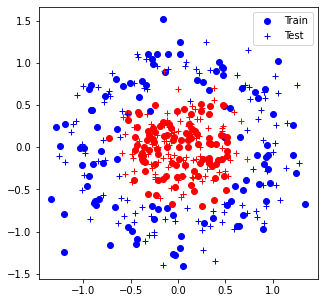

Iter 0: Acc train 56.5% (0.79), acc test 53.5% (0.82)


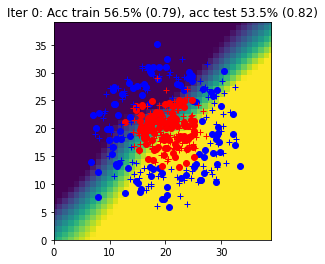

Iter 1: Acc train 64.0% (0.69), acc test 58.5% (0.72)


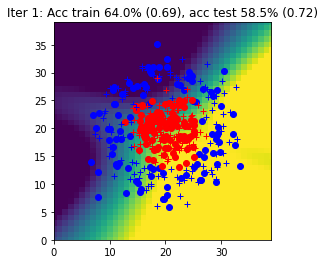

Iter 2: Acc train 70.0% (0.64), acc test 66.0% (0.67)


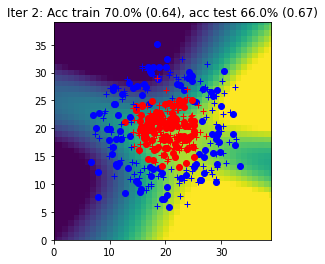

Iter 3: Acc train 70.5% (0.62), acc test 67.5% (0.64)


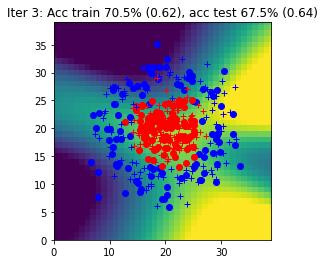

Iter 4: Acc train 71.0% (0.60), acc test 68.5% (0.62)


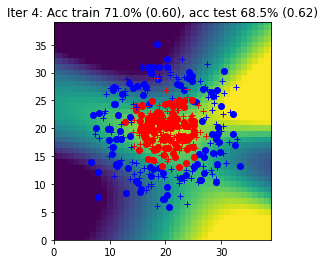

Iter 5: Acc train 75.0% (0.59), acc test 70.0% (0.61)


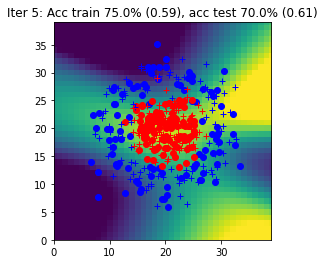

Iter 6: Acc train 79.5% (0.57), acc test 79.0% (0.59)


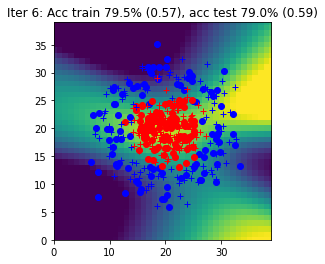

Iter 7: Acc train 79.0% (0.56), acc test 79.0% (0.58)


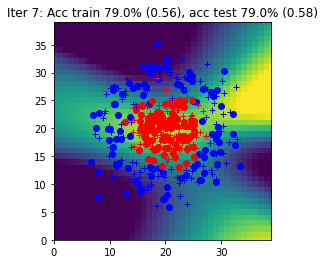

Iter 8: Acc train 80.0% (0.55), acc test 79.0% (0.57)


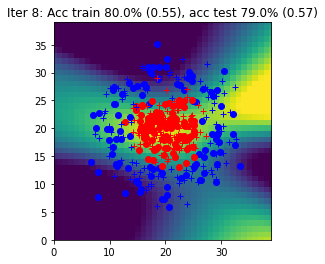

Iter 9: Acc train 80.5% (0.54), acc test 80.0% (0.56)


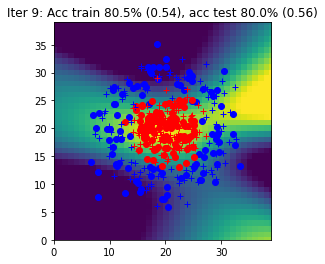

Iter 10: Acc train 79.0% (0.53), acc test 80.5% (0.55)


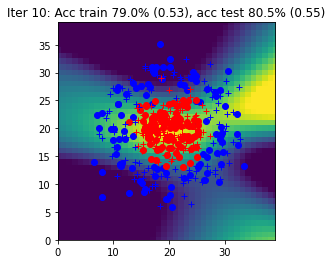

Iter 11: Acc train 78.5% (0.52), acc test 81.0% (0.54)


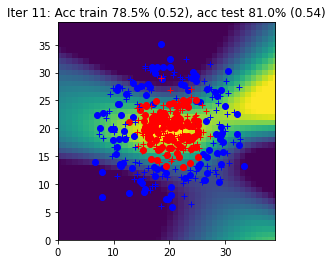

Iter 12: Acc train 79.5% (0.52), acc test 79.5% (0.53)


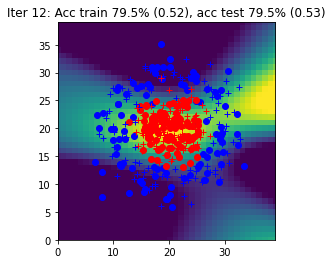

Iter 13: Acc train 79.5% (0.51), acc test 80.5% (0.53)


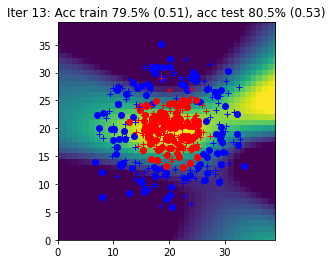

Iter 14: Acc train 80.5% (0.50), acc test 80.5% (0.52)


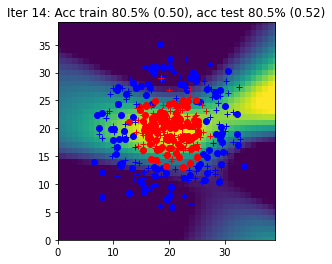

Iter 15: Acc train 80.5% (0.49), acc test 81.0% (0.51)


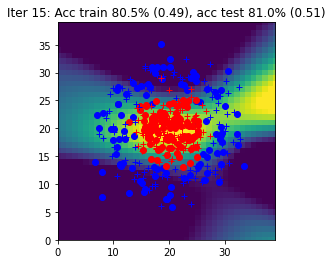

Iter 16: Acc train 80.0% (0.49), acc test 82.0% (0.50)


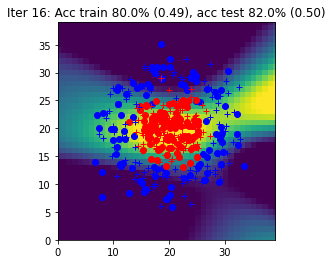

Iter 17: Acc train 80.0% (0.48), acc test 82.5% (0.50)


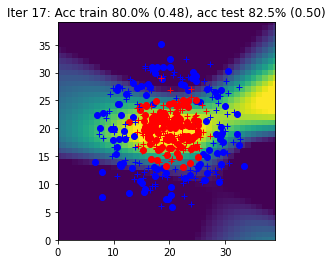

Iter 18: Acc train 81.5% (0.47), acc test 81.0% (0.49)


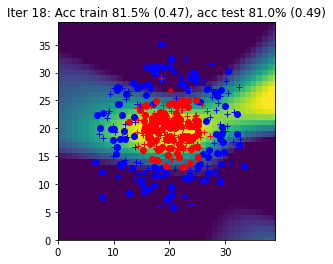

Iter 19: Acc train 80.5% (0.47), acc test 82.0% (0.48)


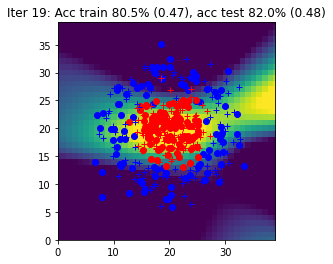

Iter 20: Acc train 81.0% (0.46), acc test 82.0% (0.48)


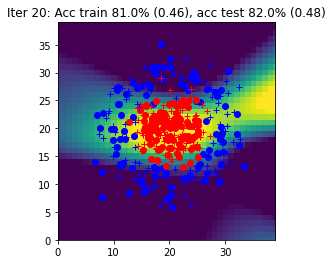

Iter 21: Acc train 83.5% (0.46), acc test 82.0% (0.47)


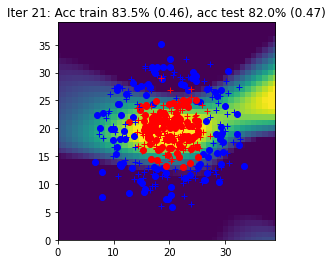

Iter 22: Acc train 82.5% (0.45), acc test 83.0% (0.47)


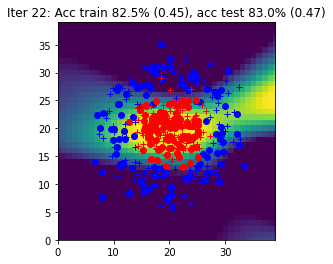

Iter 23: Acc train 84.0% (0.44), acc test 82.0% (0.46)


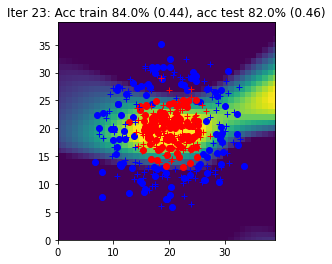

Iter 24: Acc train 84.0% (0.44), acc test 82.5% (0.46)


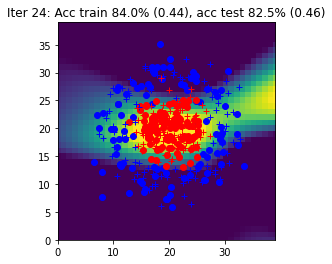

Iter 25: Acc train 83.5% (0.43), acc test 83.0% (0.45)


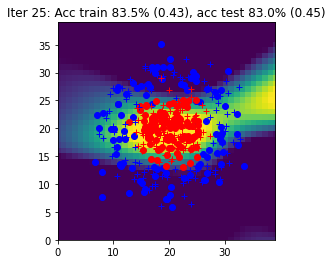

Iter 26: Acc train 84.0% (0.43), acc test 84.0% (0.45)


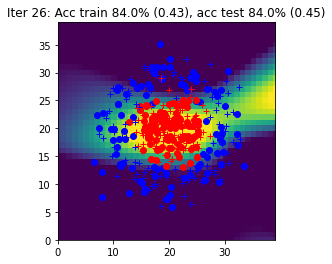

Iter 27: Acc train 84.5% (0.42), acc test 83.5% (0.44)


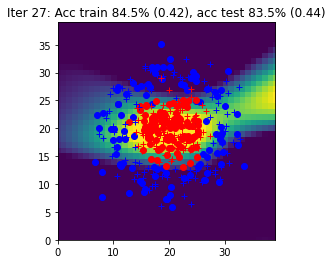

Iter 28: Acc train 84.5% (0.42), acc test 83.5% (0.44)


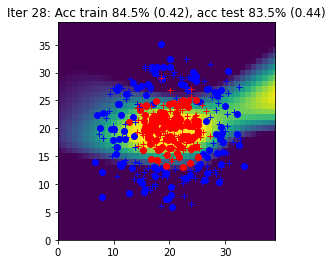

Iter 29: Acc train 84.5% (0.41), acc test 85.0% (0.43)


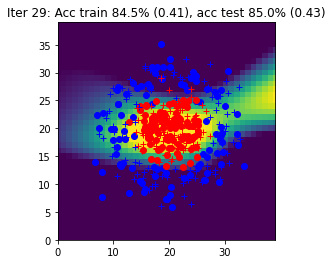

Iter 30: Acc train 84.5% (0.41), acc test 85.5% (0.43)


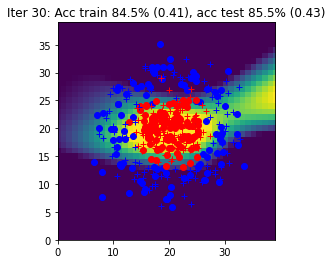

Iter 31: Acc train 83.5% (0.41), acc test 85.5% (0.42)


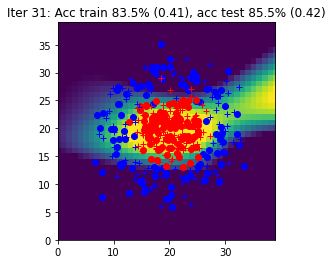

Iter 32: Acc train 85.0% (0.40), acc test 85.5% (0.42)


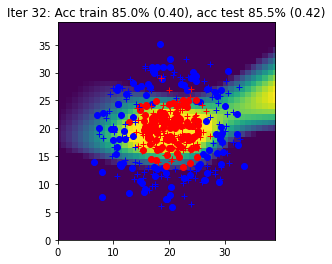

Iter 33: Acc train 85.0% (0.40), acc test 86.0% (0.41)


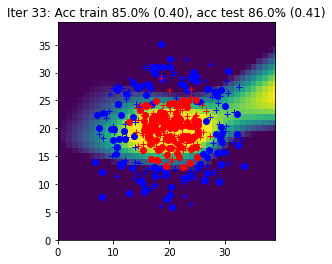

Iter 34: Acc train 85.5% (0.39), acc test 86.0% (0.41)


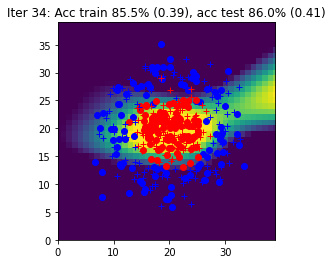

Iter 35: Acc train 84.5% (0.39), acc test 86.5% (0.40)


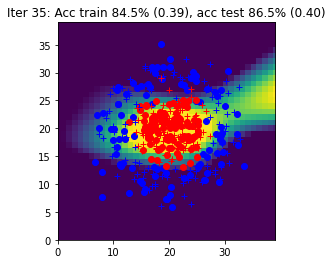

Iter 36: Acc train 86.0% (0.38), acc test 86.5% (0.40)


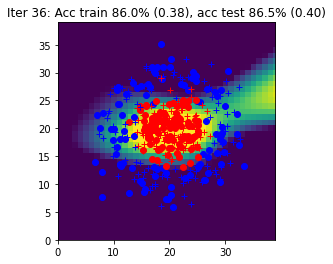

Iter 37: Acc train 85.5% (0.38), acc test 87.5% (0.39)


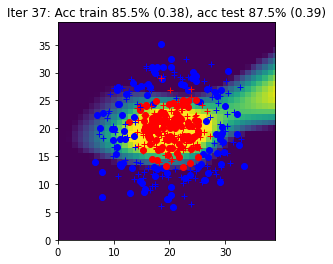

Iter 38: Acc train 86.0% (0.37), acc test 87.0% (0.39)


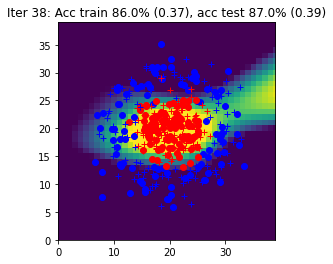

Iter 39: Acc train 86.0% (0.37), acc test 87.0% (0.39)


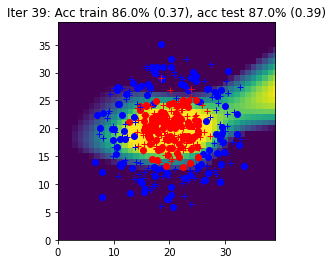

Iter 40: Acc train 87.0% (0.36), acc test 88.0% (0.38)


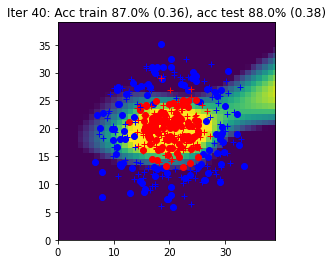

Iter 41: Acc train 87.0% (0.36), acc test 88.5% (0.38)


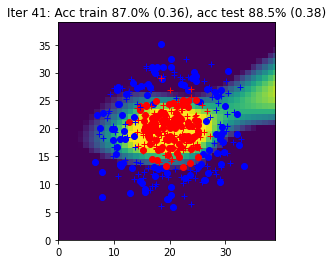

Iter 42: Acc train 87.5% (0.36), acc test 89.0% (0.37)


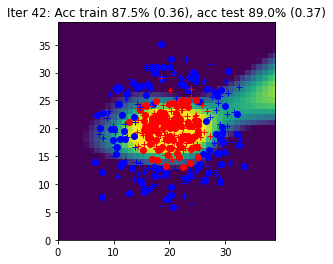

Iter 43: Acc train 87.5% (0.35), acc test 90.0% (0.37)


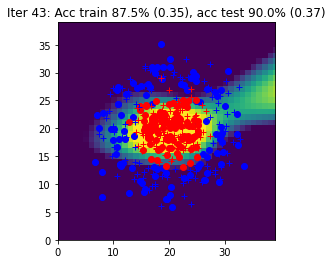

Iter 44: Acc train 87.5% (0.35), acc test 90.0% (0.36)


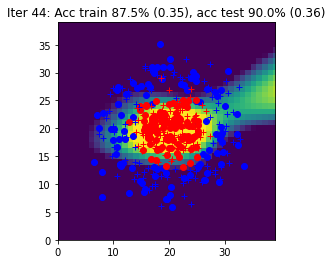

Iter 45: Acc train 88.5% (0.34), acc test 89.5% (0.36)


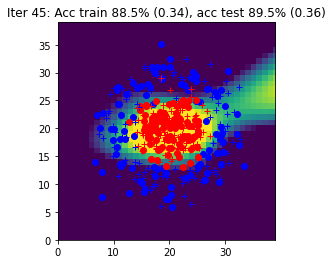

Iter 46: Acc train 89.0% (0.34), acc test 90.0% (0.36)


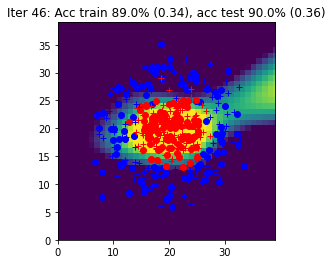

Iter 47: Acc train 89.5% (0.34), acc test 90.5% (0.35)


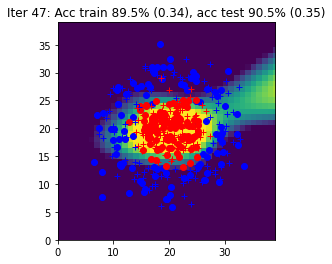

Iter 48: Acc train 89.0% (0.33), acc test 91.0% (0.35)


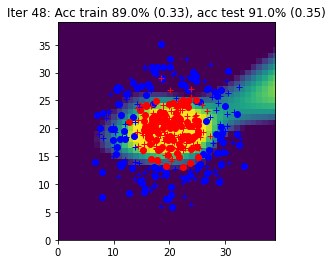

Iter 49: Acc train 89.0% (0.33), acc test 91.0% (0.35)


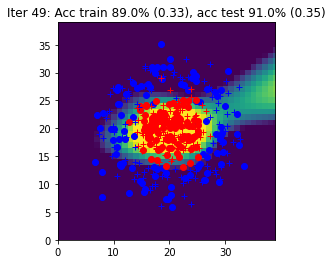

Iter 50: Acc train 90.0% (0.32), acc test 91.5% (0.34)


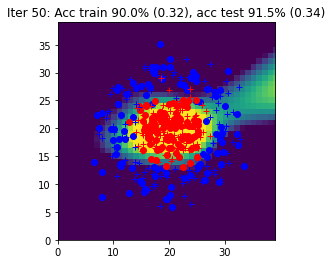

Iter 51: Acc train 90.5% (0.32), acc test 91.5% (0.34)


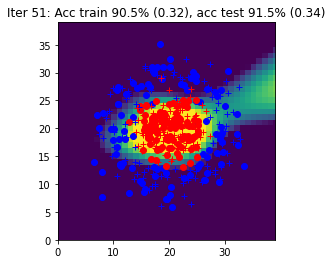

Iter 52: Acc train 91.0% (0.32), acc test 92.5% (0.33)


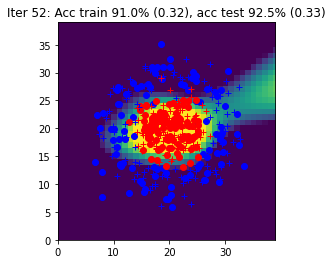

Iter 53: Acc train 92.0% (0.31), acc test 92.0% (0.33)


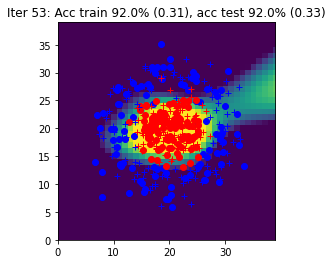

Iter 54: Acc train 91.0% (0.31), acc test 92.5% (0.33)


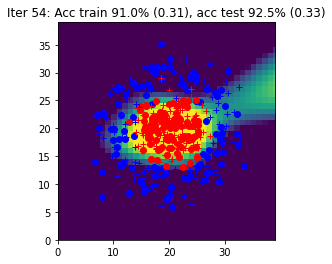

Iter 55: Acc train 92.0% (0.31), acc test 92.5% (0.32)


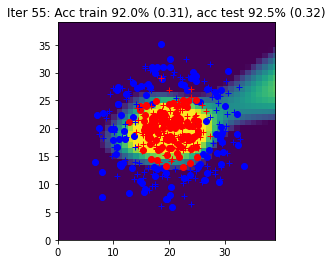

Iter 56: Acc train 92.0% (0.30), acc test 92.5% (0.32)


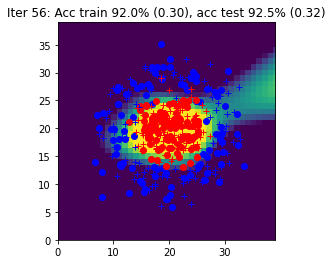

Iter 57: Acc train 92.0% (0.30), acc test 93.5% (0.32)


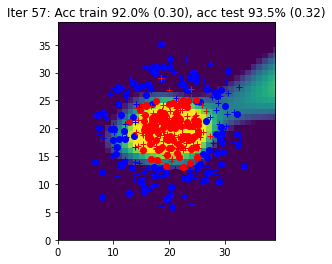

Iter 58: Acc train 92.0% (0.30), acc test 93.5% (0.31)


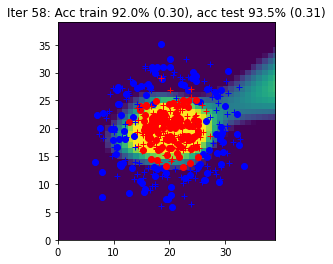

Iter 59: Acc train 93.0% (0.29), acc test 94.0% (0.31)


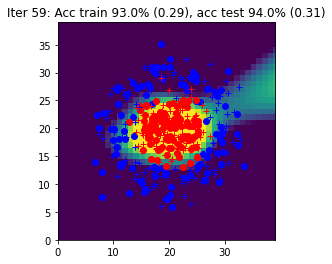

Iter 60: Acc train 92.5% (0.29), acc test 94.0% (0.31)


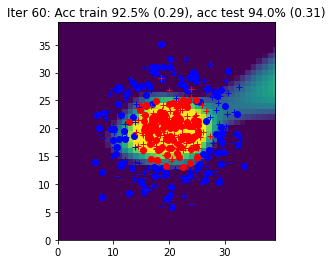

Iter 61: Acc train 93.0% (0.29), acc test 94.5% (0.30)


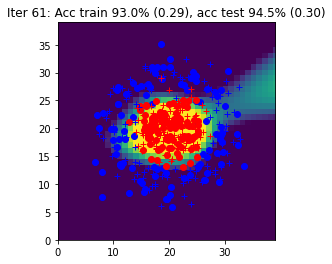

Iter 62: Acc train 93.0% (0.28), acc test 94.5% (0.30)


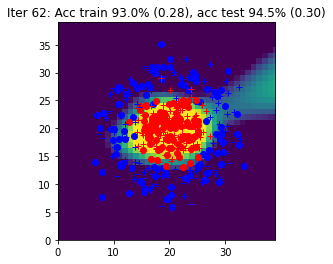

Iter 63: Acc train 93.0% (0.28), acc test 94.0% (0.30)


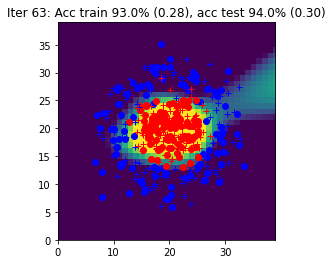

Iter 64: Acc train 93.0% (0.28), acc test 94.0% (0.29)


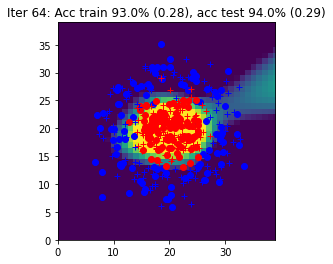

Iter 65: Acc train 94.0% (0.27), acc test 94.5% (0.29)


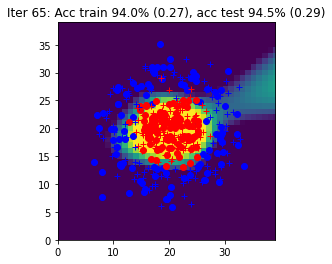

Iter 66: Acc train 94.0% (0.27), acc test 94.5% (0.29)


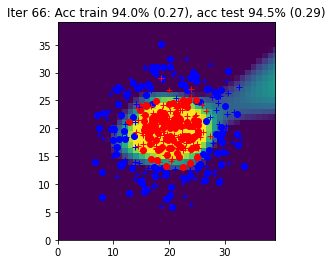

Iter 67: Acc train 93.5% (0.27), acc test 93.5% (0.28)


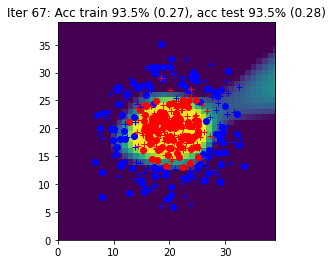

Iter 68: Acc train 93.0% (0.27), acc test 94.0% (0.28)


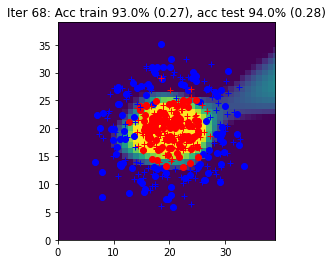

Iter 69: Acc train 93.5% (0.26), acc test 93.5% (0.28)


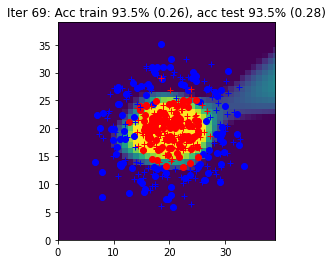

Iter 70: Acc train 93.0% (0.26), acc test 94.0% (0.28)


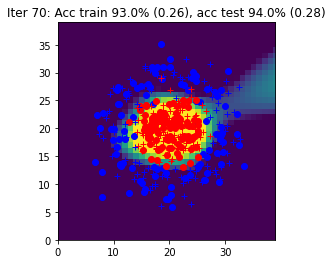

Iter 71: Acc train 93.5% (0.26), acc test 94.0% (0.27)


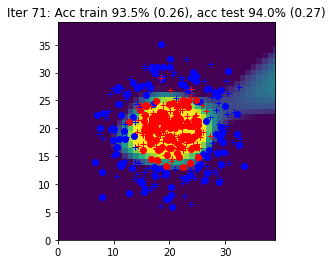

Iter 72: Acc train 93.5% (0.26), acc test 94.5% (0.27)


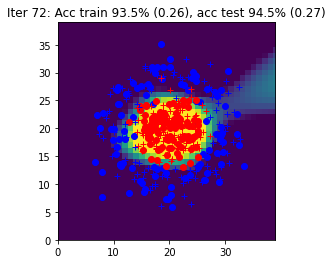

Iter 73: Acc train 94.0% (0.25), acc test 94.5% (0.27)


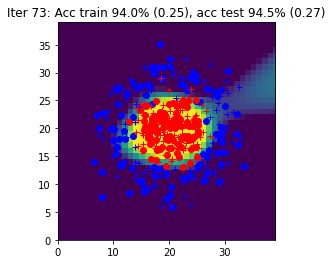

Iter 74: Acc train 93.5% (0.25), acc test 94.5% (0.26)


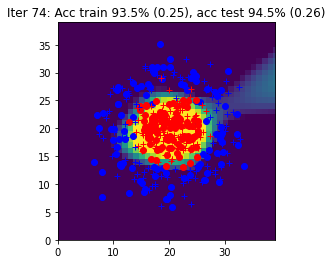

Iter 75: Acc train 93.5% (0.25), acc test 94.0% (0.26)


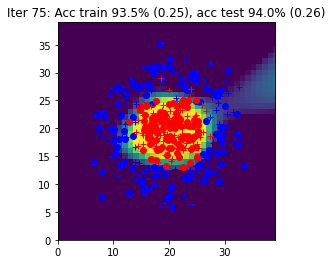

Iter 76: Acc train 94.0% (0.25), acc test 93.5% (0.26)


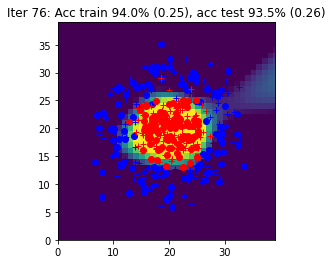

Iter 77: Acc train 94.0% (0.24), acc test 94.0% (0.26)


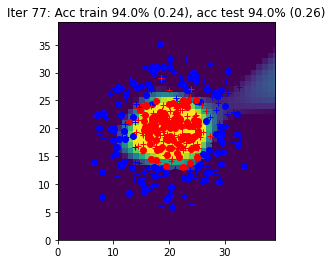

Iter 78: Acc train 94.5% (0.24), acc test 94.0% (0.26)


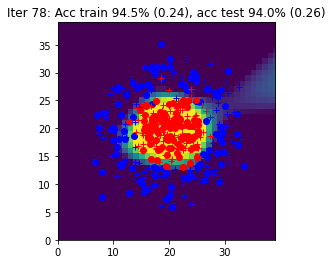

Iter 79: Acc train 94.0% (0.24), acc test 93.5% (0.25)


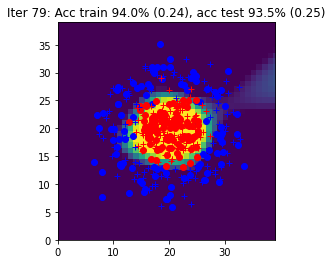

Iter 80: Acc train 94.5% (0.24), acc test 93.5% (0.25)


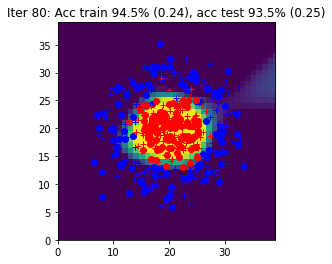

Iter 81: Acc train 94.5% (0.24), acc test 94.0% (0.25)


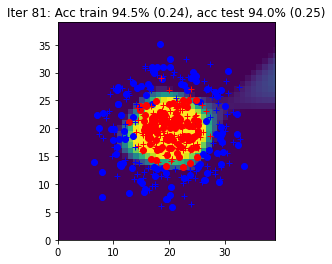

Iter 82: Acc train 94.0% (0.23), acc test 94.0% (0.25)


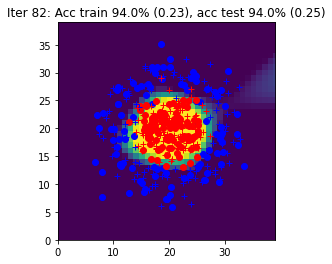

Iter 83: Acc train 94.5% (0.23), acc test 93.5% (0.25)


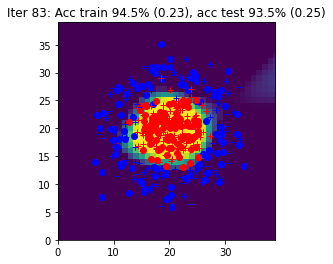

Iter 84: Acc train 94.5% (0.23), acc test 94.0% (0.24)


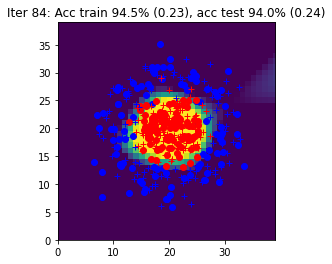

Iter 85: Acc train 94.5% (0.23), acc test 94.0% (0.24)


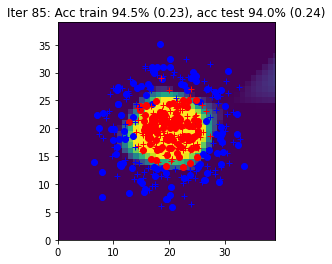

Iter 86: Acc train 95.0% (0.23), acc test 94.0% (0.24)


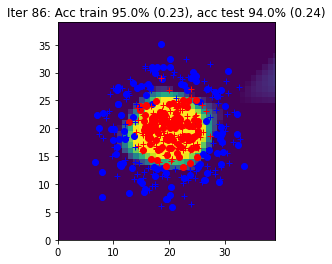

Iter 87: Acc train 95.0% (0.22), acc test 94.0% (0.24)


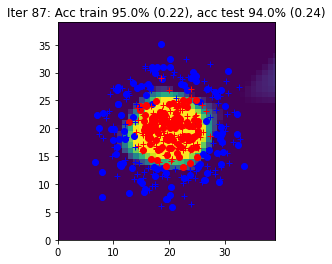

Iter 88: Acc train 95.0% (0.22), acc test 94.0% (0.24)


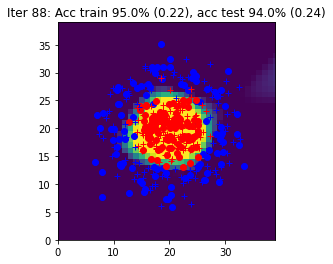

Iter 89: Acc train 95.0% (0.22), acc test 94.0% (0.23)


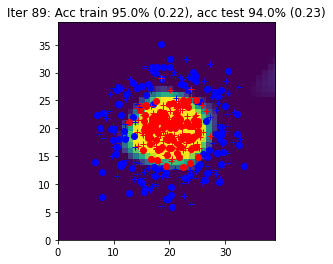

Iter 90: Acc train 95.0% (0.22), acc test 94.0% (0.23)


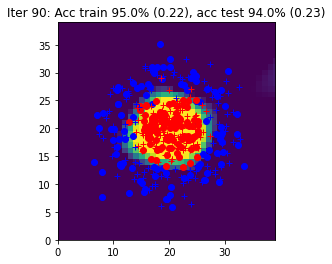

Iter 91: Acc train 94.5% (0.22), acc test 94.5% (0.23)


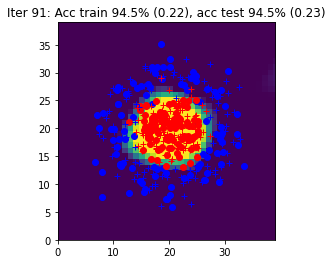

Iter 92: Acc train 95.0% (0.22), acc test 94.5% (0.23)


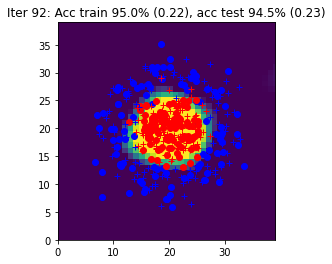

Iter 93: Acc train 95.0% (0.21), acc test 94.5% (0.23)


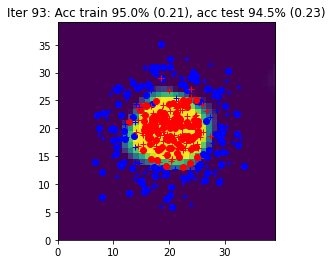

Iter 94: Acc train 95.0% (0.21), acc test 94.5% (0.23)


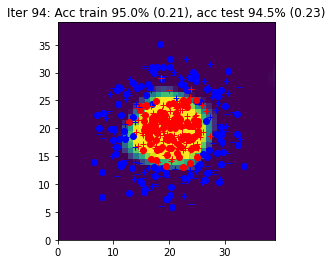

Iter 95: Acc train 95.0% (0.21), acc test 94.5% (0.23)


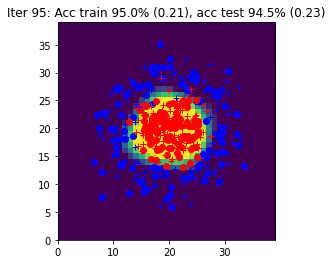

Iter 96: Acc train 95.0% (0.21), acc test 94.5% (0.22)


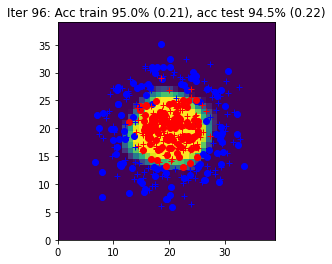

Iter 97: Acc train 95.0% (0.21), acc test 94.5% (0.22)


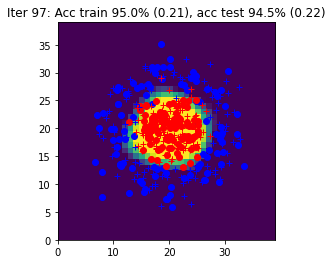

Iter 98: Acc train 95.0% (0.21), acc test 94.5% (0.22)


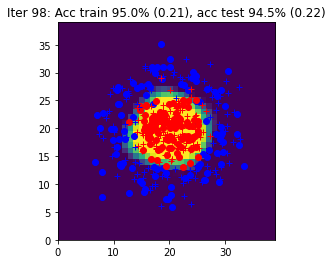

Iter 99: Acc train 95.0% (0.21), acc test 94.5% (0.22)


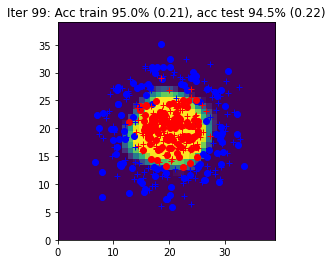

Iter 100: Acc train 95.0% (0.20), acc test 94.5% (0.22)


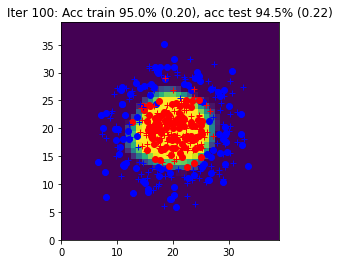

Iter 101: Acc train 95.5% (0.20), acc test 94.5% (0.22)


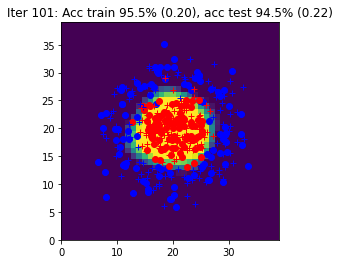

Iter 102: Acc train 95.5% (0.20), acc test 94.5% (0.22)


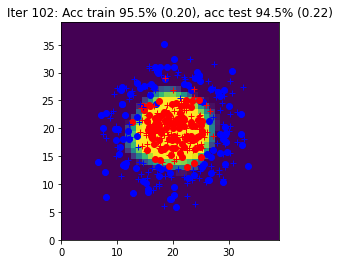

Iter 103: Acc train 95.5% (0.20), acc test 94.5% (0.21)


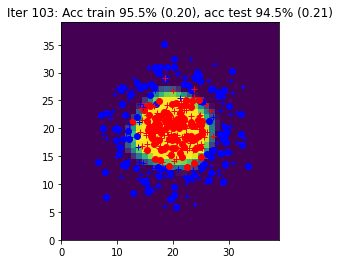

Iter 104: Acc train 95.5% (0.20), acc test 94.5% (0.21)


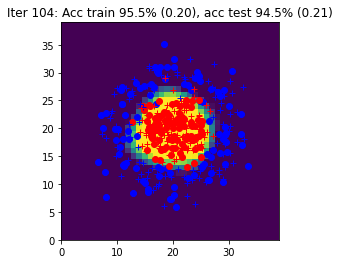

Iter 105: Acc train 95.5% (0.20), acc test 94.5% (0.21)


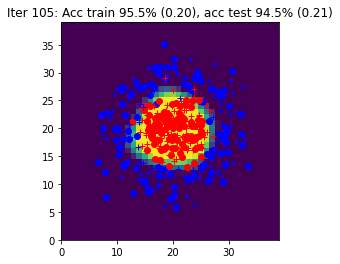

Iter 106: Acc train 95.5% (0.20), acc test 94.5% (0.21)


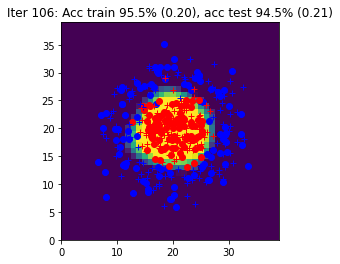

Iter 107: Acc train 96.0% (0.20), acc test 94.5% (0.21)


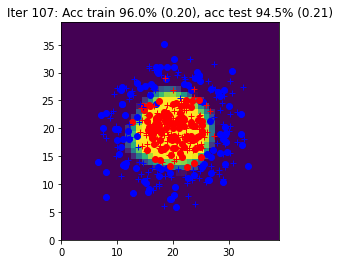

Iter 108: Acc train 96.0% (0.20), acc test 94.5% (0.21)


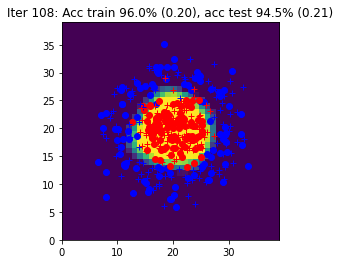

Iter 109: Acc train 96.0% (0.19), acc test 94.5% (0.21)


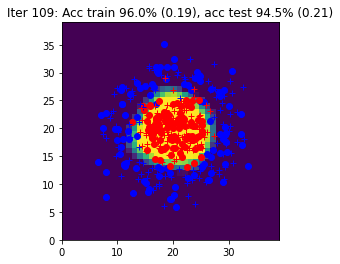

Iter 110: Acc train 95.0% (0.19), acc test 94.5% (0.21)


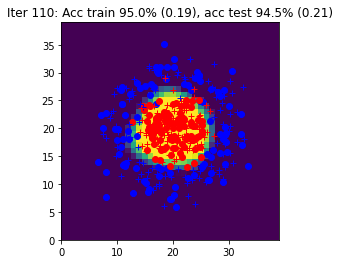

Iter 111: Acc train 95.0% (0.19), acc test 94.5% (0.21)


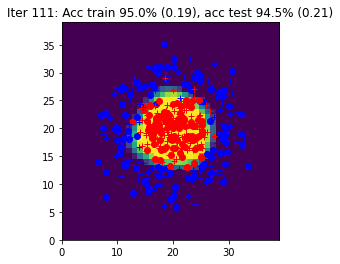

Iter 112: Acc train 96.0% (0.19), acc test 94.5% (0.21)


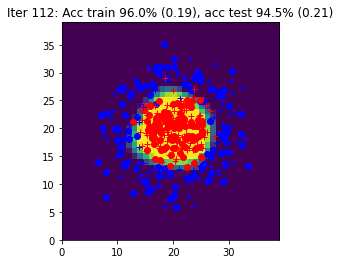

Iter 113: Acc train 96.0% (0.19), acc test 94.5% (0.20)


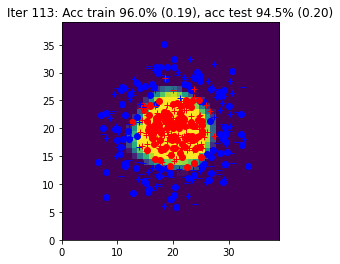

Iter 114: Acc train 96.0% (0.19), acc test 94.5% (0.20)


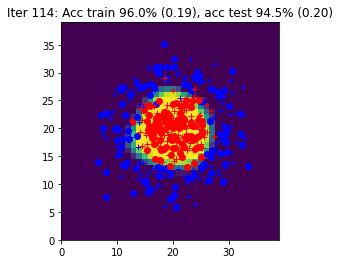

Iter 115: Acc train 96.0% (0.19), acc test 94.5% (0.20)


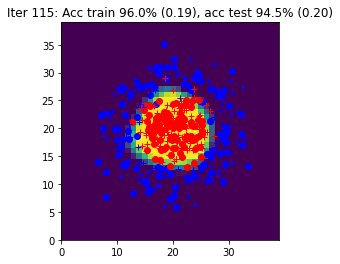

Iter 116: Acc train 96.0% (0.19), acc test 94.5% (0.20)


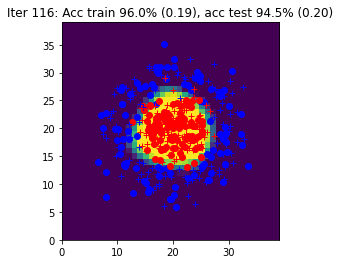

Iter 117: Acc train 95.5% (0.19), acc test 94.5% (0.20)


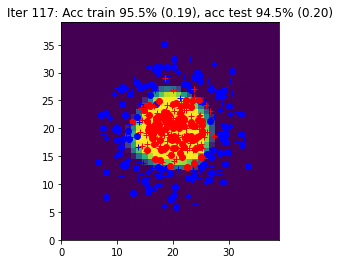

Iter 118: Acc train 95.5% (0.19), acc test 94.5% (0.20)


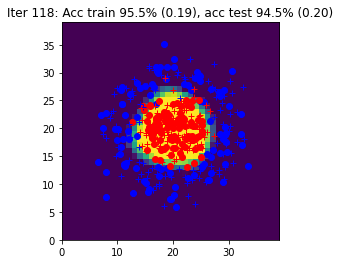

Iter 119: Acc train 95.5% (0.18), acc test 94.5% (0.20)


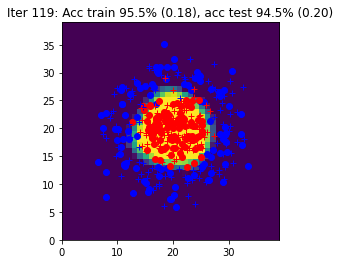

Iter 120: Acc train 95.5% (0.18), acc test 94.5% (0.20)


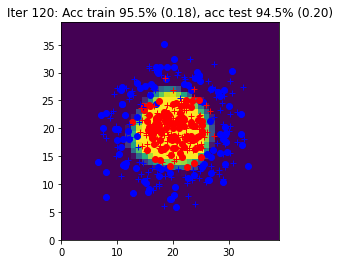

Iter 121: Acc train 95.5% (0.18), acc test 94.5% (0.20)


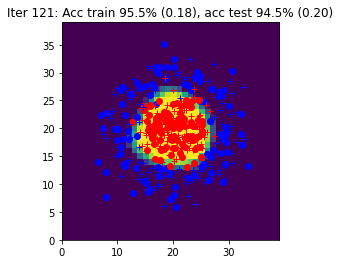

Iter 122: Acc train 95.5% (0.18), acc test 94.5% (0.20)


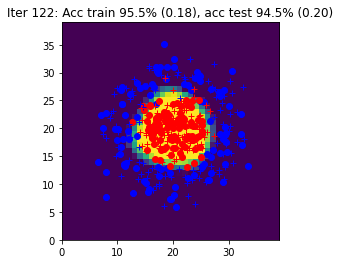

Iter 123: Acc train 95.5% (0.18), acc test 94.5% (0.20)


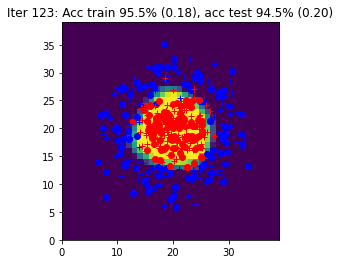

Iter 124: Acc train 95.5% (0.18), acc test 94.5% (0.20)


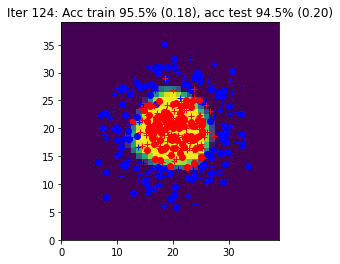

Iter 125: Acc train 96.0% (0.18), acc test 95.0% (0.19)


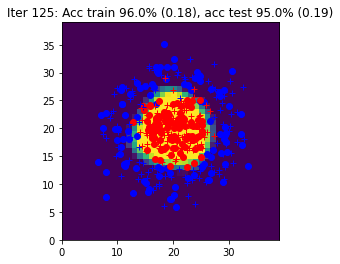

Iter 126: Acc train 96.0% (0.18), acc test 95.0% (0.19)


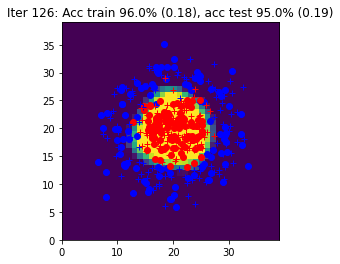

Iter 127: Acc train 96.0% (0.18), acc test 95.0% (0.19)


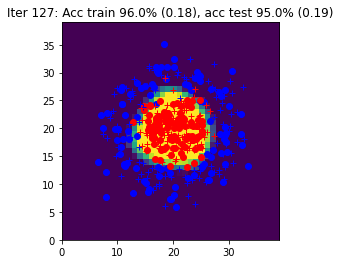

Iter 128: Acc train 95.5% (0.18), acc test 95.0% (0.19)


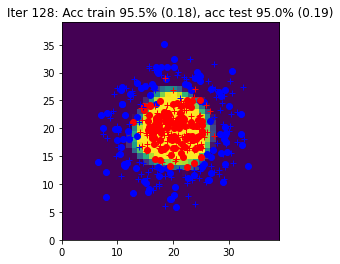

Iter 129: Acc train 95.5% (0.18), acc test 95.0% (0.19)


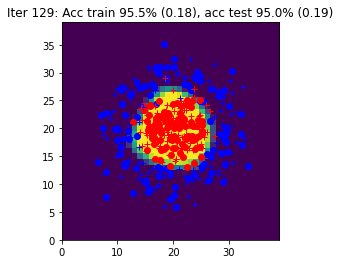

Iter 130: Acc train 95.5% (0.18), acc test 95.0% (0.19)


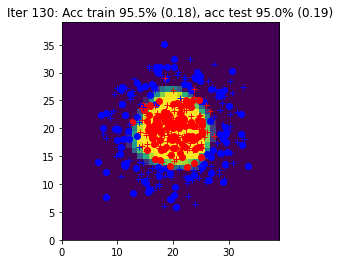

Iter 131: Acc train 95.5% (0.18), acc test 95.0% (0.19)


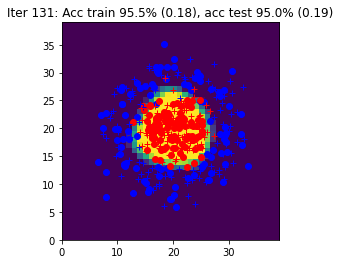

Iter 132: Acc train 95.5% (0.17), acc test 95.0% (0.19)


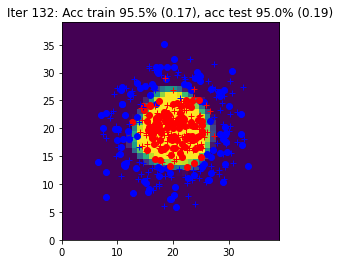

Iter 133: Acc train 95.5% (0.17), acc test 95.0% (0.19)


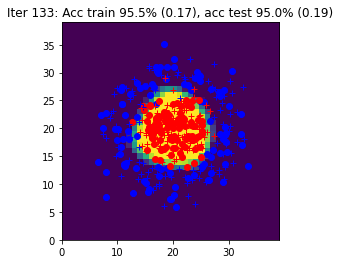

Iter 134: Acc train 95.5% (0.17), acc test 95.0% (0.19)


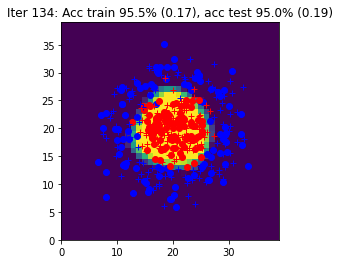

Iter 135: Acc train 95.5% (0.17), acc test 95.0% (0.19)


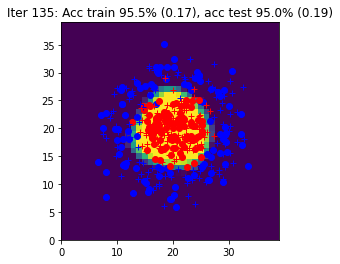

Iter 136: Acc train 95.5% (0.17), acc test 95.0% (0.19)


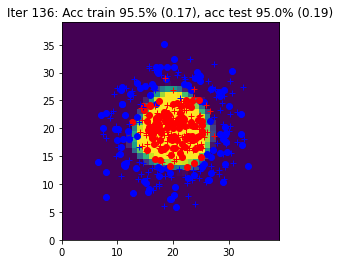

Iter 137: Acc train 96.0% (0.17), acc test 95.0% (0.19)


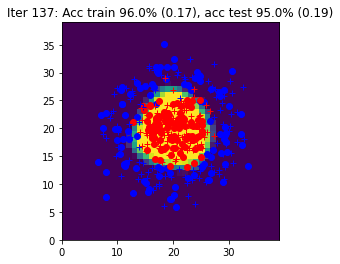

Iter 138: Acc train 96.0% (0.17), acc test 95.0% (0.19)


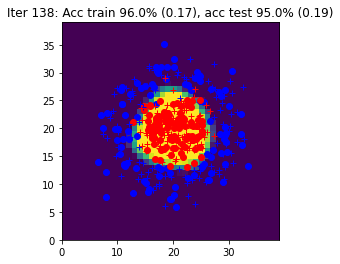

Iter 139: Acc train 96.0% (0.17), acc test 95.0% (0.19)


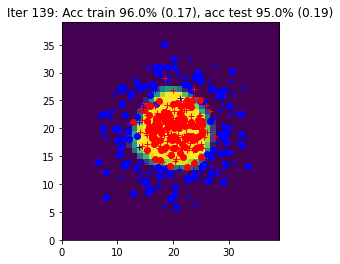

Iter 140: Acc train 96.0% (0.17), acc test 95.0% (0.19)


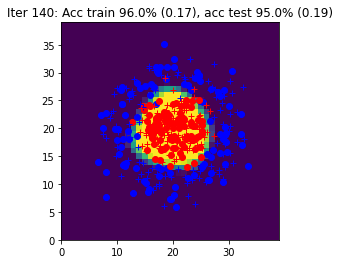

Iter 141: Acc train 96.0% (0.17), acc test 95.0% (0.18)


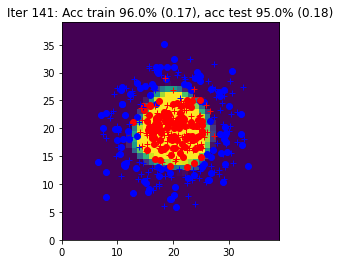

Iter 142: Acc train 95.5% (0.17), acc test 95.0% (0.18)


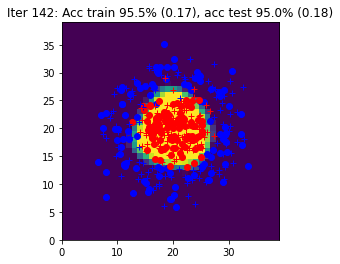

Iter 143: Acc train 96.0% (0.17), acc test 95.0% (0.18)


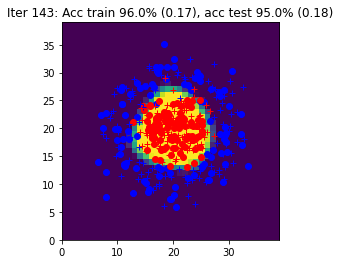

Iter 144: Acc train 96.0% (0.17), acc test 95.0% (0.18)


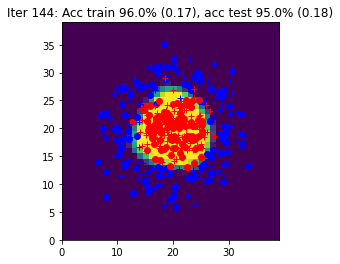

Iter 145: Acc train 96.0% (0.17), acc test 95.0% (0.18)


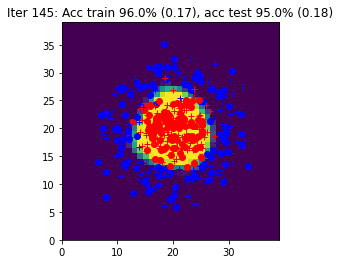

Iter 146: Acc train 96.0% (0.17), acc test 95.0% (0.18)


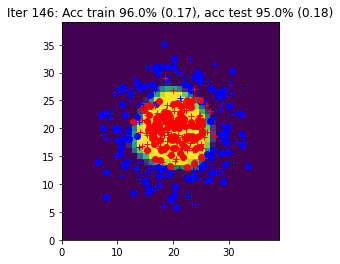

Iter 147: Acc train 96.0% (0.17), acc test 95.0% (0.18)


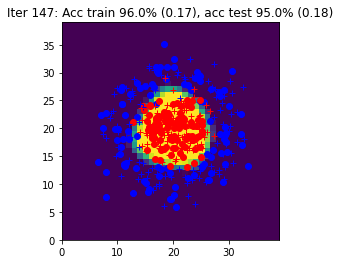

Iter 148: Acc train 96.0% (0.16), acc test 95.0% (0.18)


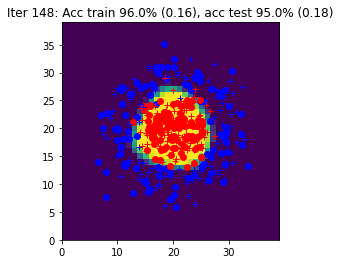

Iter 149: Acc train 96.5% (0.16), acc test 95.0% (0.18)


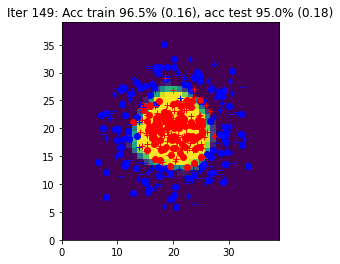

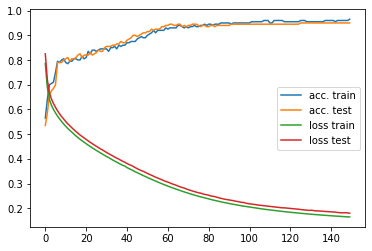

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]
   
    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        yhat,outputs=forward(params,X)
        L,_=loss_accuracy(yhat,Y)
        L.backward()
        params=sgd(params,eta)
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, sgd
        # and the backward function with autograd

    ####################
    ##      END        #
    ####################


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain*100, Ltrain, acctest*100, Ltest)
    print(title)
    # detach() is used to remove the predictions from the computational graph in autograd
    data.plot_data_with_grid(Ygrid.detach(), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 3 : Simplification of the forward pass with `torch.nn`

`init_params` and `forward` are replaced by the `init_model` function which defines the network architecture and the loss.

In [ ]:
def init_model(nx, nh, ny):

    #####################
    ## Your code here  ##
    #####################

    model = torch.nn.Sequential(
        torch.nn.Linear(nx, nh),
        torch.nn.ReLU(),
        torch.nn.Linear(nh, ny),
        torch.nn.Softmax()
    )
    loss = torch.nn.MSELoss()

    ####################
    ##      END        #
    ####################

    return model, loss

In [ ]:
def loss_accuracy(loss, Yhat, Y):

    #####################
    ## Your code here  ##
    #####################
    # call the loss function

    L = loss(Yhat,Y)
    acc = (torch.argmax(Yhat,1) == torch.argmax(Y,1)).sum().item()/Y.size(0)

    ####################
    ##      END        #
    ####################

    return L, acc

In [ ]:
def sgd(model, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators
    with torch.no_grad() :
      for param in model.parameters():
            param -= eta * param.grad
    
      model.zero_grad()

    ####################
    ##      END        #
    ####################
    return model

## Global learning procedure with autograd and `torch.nn`

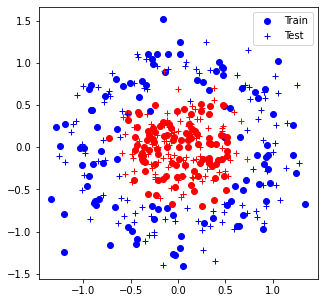

Iter 0: Acc train 31.5% (0.26), acc test 34.5% (0.26)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


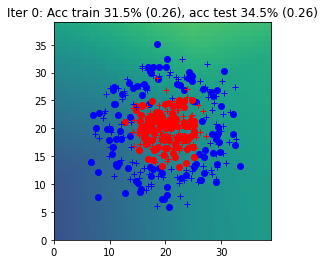

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 1: Acc train 31.5% (0.26), acc test 35.0% (0.26)


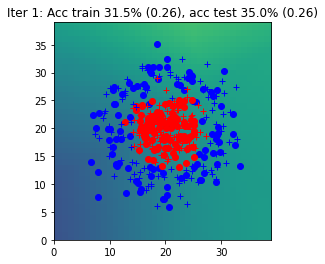

Iter 2: Acc train 34.0% (0.26), acc test 34.5% (0.26)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


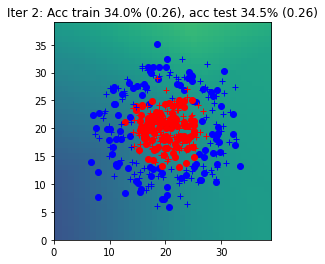

Iter 3: Acc train 37.0% (0.26), acc test 37.0% (0.26)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


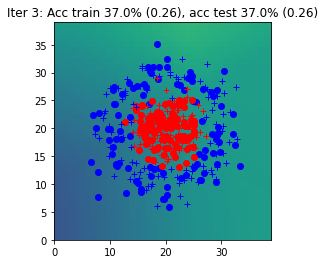

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 4: Acc train 37.0% (0.25), acc test 36.5% (0.25)


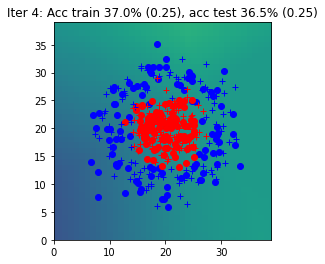

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 5: Acc train 38.0% (0.25), acc test 37.5% (0.25)


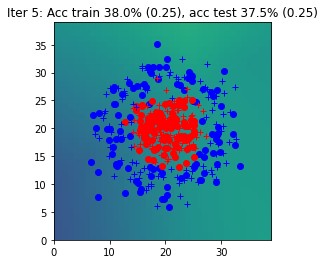

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 6: Acc train 39.5% (0.25), acc test 39.0% (0.25)


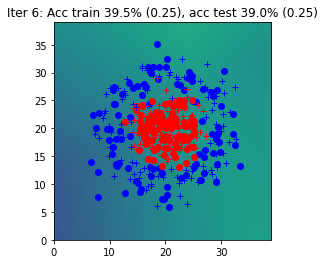

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 7: Acc train 41.0% (0.25), acc test 39.5% (0.25)


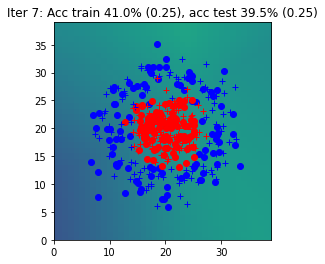

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 8: Acc train 43.0% (0.25), acc test 43.0% (0.25)


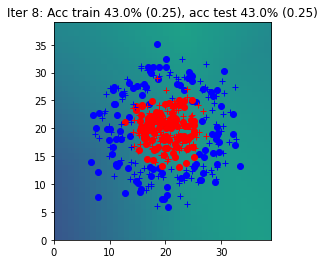

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 9: Acc train 46.5% (0.25), acc test 43.5% (0.25)


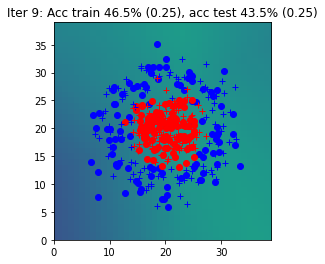

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 10: Acc train 49.0% (0.25), acc test 48.0% (0.25)


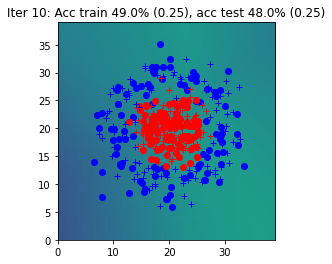

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 11: Acc train 53.0% (0.24), acc test 53.0% (0.25)


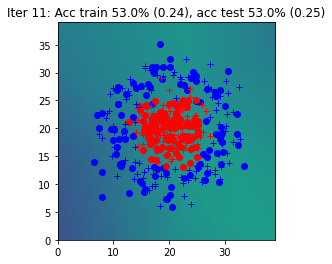

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 12: Acc train 59.5% (0.24), acc test 57.5% (0.24)


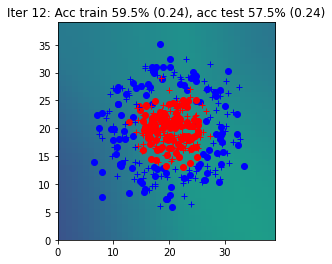

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 13: Acc train 60.5% (0.24), acc test 59.0% (0.24)


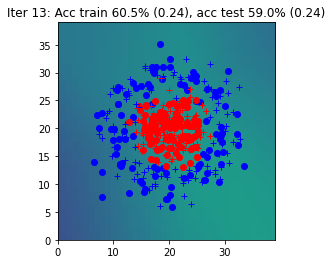

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 14: Acc train 61.5% (0.24), acc test 58.5% (0.24)


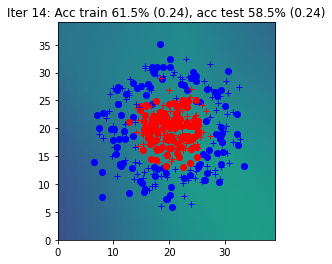

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 15: Acc train 61.0% (0.24), acc test 60.0% (0.24)


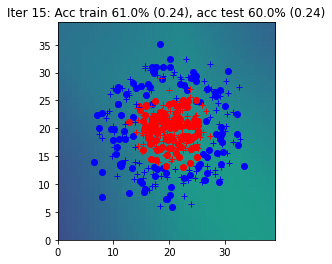

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 16: Acc train 63.0% (0.24), acc test 63.0% (0.24)


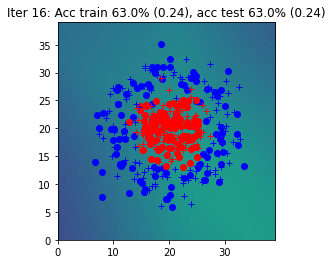

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 17: Acc train 63.0% (0.24), acc test 65.0% (0.24)


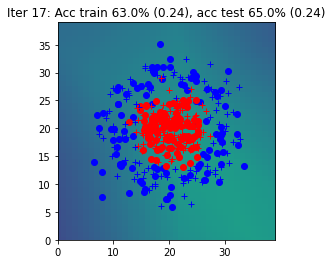

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 18: Acc train 64.0% (0.23), acc test 68.0% (0.24)


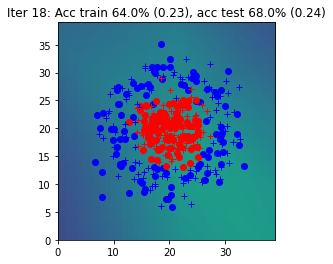

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 19: Acc train 65.0% (0.23), acc test 69.0% (0.24)


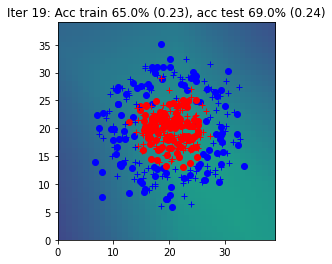

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 20: Acc train 66.0% (0.23), acc test 71.0% (0.23)


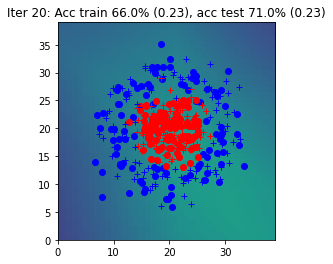

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 21: Acc train 67.5% (0.23), acc test 72.0% (0.23)


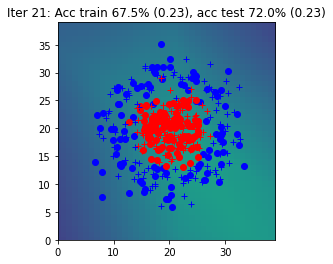

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 22: Acc train 68.5% (0.23), acc test 73.5% (0.23)


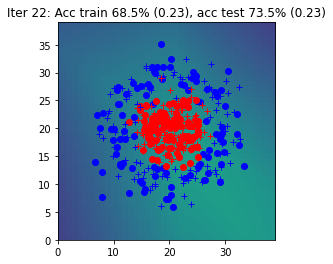

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 23: Acc train 70.5% (0.23), acc test 74.5% (0.23)


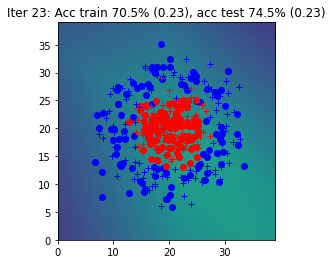

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 24: Acc train 72.0% (0.23), acc test 75.0% (0.23)


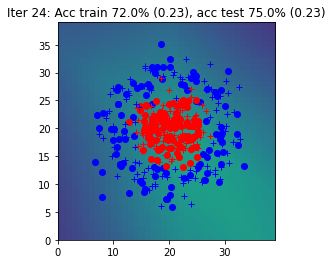

Iter 25: Acc train 73.0% (0.22), acc test 75.5% (0.23)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


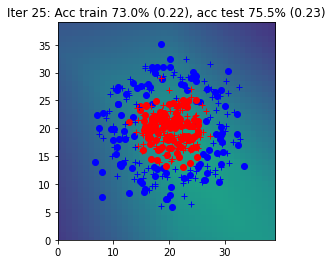

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 26: Acc train 73.5% (0.22), acc test 75.0% (0.23)


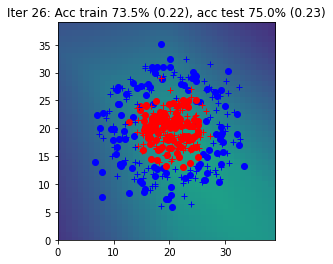

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 27: Acc train 76.0% (0.22), acc test 76.0% (0.22)


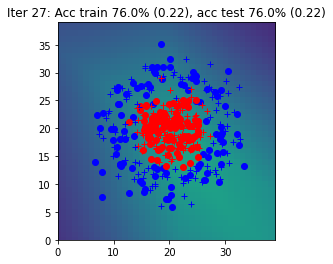

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 28: Acc train 76.5% (0.22), acc test 75.5% (0.22)


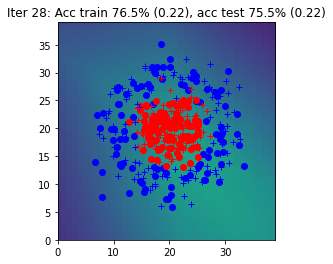

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 29: Acc train 78.0% (0.22), acc test 75.5% (0.22)


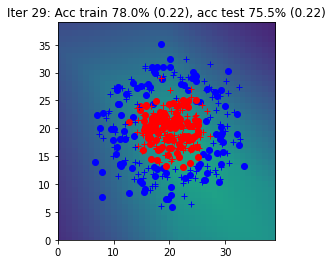

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 30: Acc train 80.0% (0.22), acc test 76.0% (0.22)


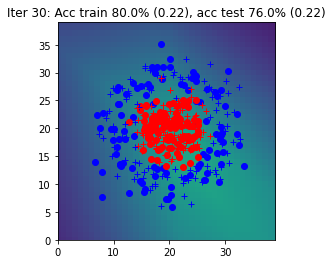

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 31: Acc train 80.0% (0.22), acc test 76.5% (0.22)


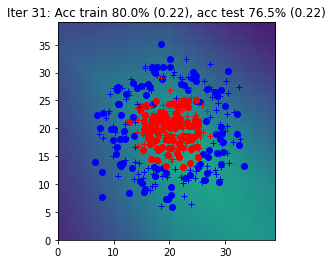

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 32: Acc train 81.0% (0.21), acc test 76.0% (0.22)


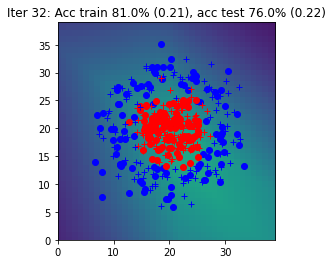

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 33: Acc train 81.5% (0.21), acc test 76.5% (0.22)


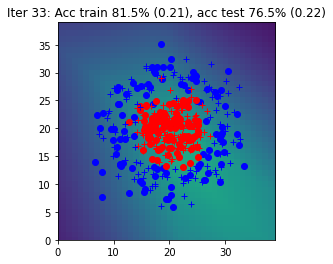

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 34: Acc train 82.0% (0.21), acc test 76.5% (0.21)


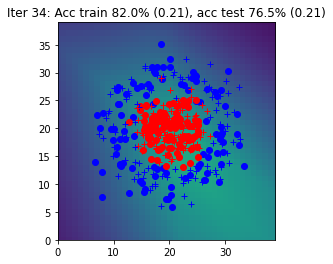

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 35: Acc train 82.5% (0.21), acc test 77.5% (0.21)


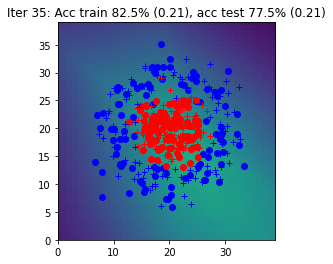

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 36: Acc train 83.0% (0.21), acc test 77.5% (0.21)


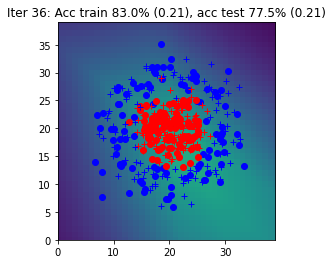

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 37: Acc train 83.0% (0.21), acc test 77.5% (0.21)


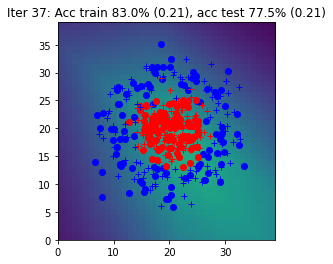

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 38: Acc train 84.0% (0.20), acc test 77.5% (0.21)


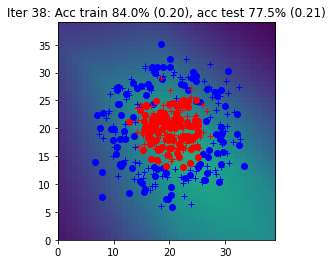

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 39: Acc train 84.5% (0.20), acc test 77.5% (0.21)


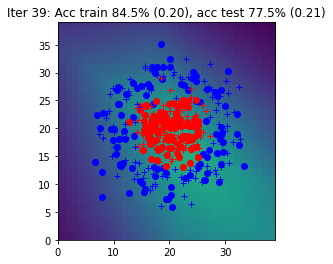

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 40: Acc train 85.0% (0.20), acc test 77.5% (0.21)


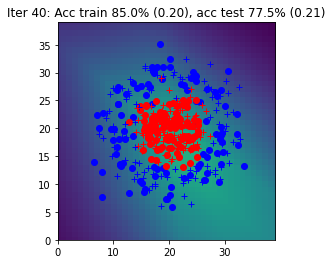

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 41: Acc train 85.5% (0.20), acc test 77.0% (0.21)


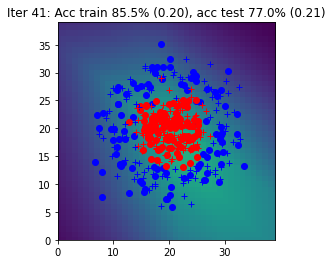

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 42: Acc train 86.0% (0.20), acc test 77.5% (0.20)


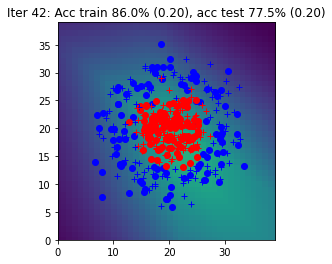

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 43: Acc train 86.0% (0.20), acc test 77.5% (0.20)


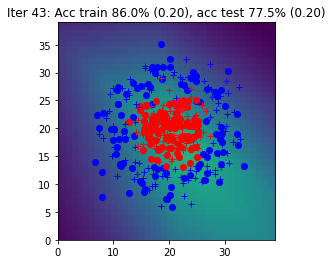

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 44: Acc train 86.0% (0.20), acc test 78.0% (0.20)


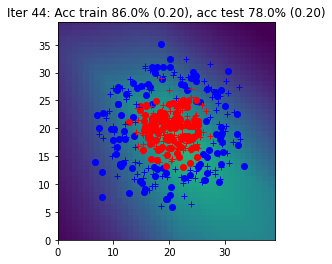

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 45: Acc train 86.5% (0.19), acc test 78.0% (0.20)


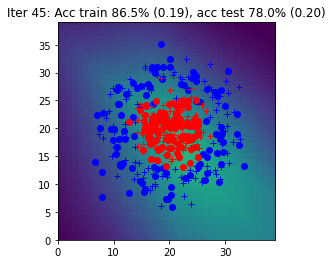

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 46: Acc train 86.5% (0.19), acc test 77.5% (0.20)


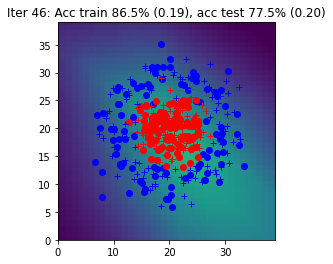

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 47: Acc train 86.5% (0.19), acc test 78.5% (0.20)


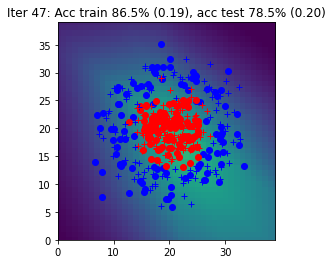

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 48: Acc train 86.5% (0.19), acc test 79.0% (0.19)


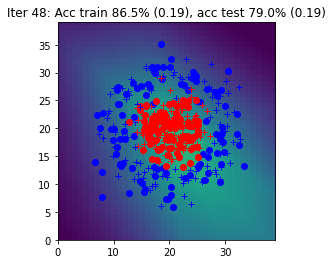

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 49: Acc train 87.0% (0.19), acc test 79.0% (0.19)


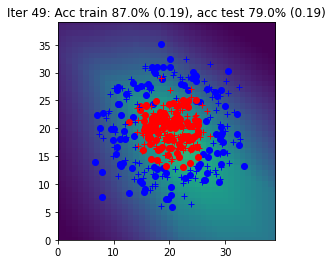

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 50: Acc train 86.5% (0.19), acc test 79.5% (0.19)


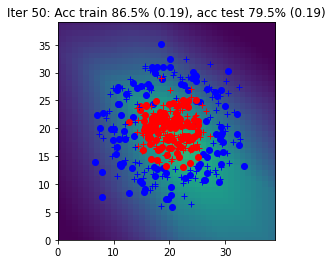

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 51: Acc train 86.5% (0.18), acc test 80.0% (0.19)


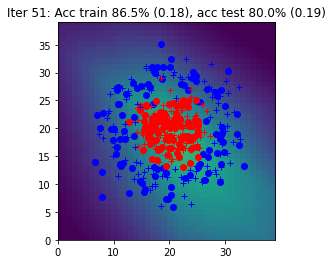

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 52: Acc train 86.5% (0.18), acc test 80.0% (0.19)


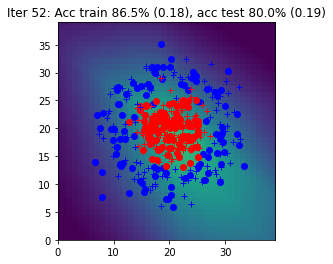

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 53: Acc train 86.5% (0.18), acc test 80.0% (0.19)


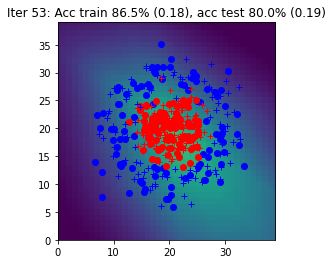

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 54: Acc train 87.0% (0.18), acc test 80.5% (0.18)


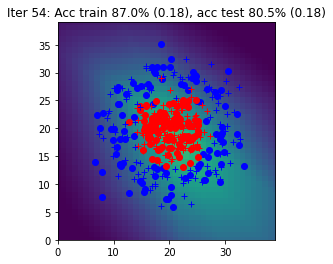

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 55: Acc train 87.0% (0.18), acc test 80.5% (0.18)


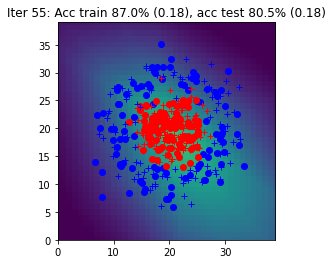

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 56: Acc train 87.0% (0.17), acc test 81.0% (0.18)


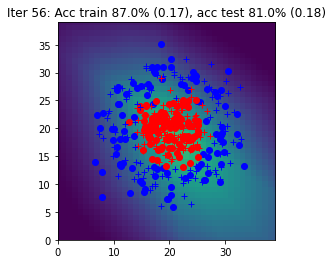

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 57: Acc train 86.5% (0.17), acc test 81.5% (0.18)


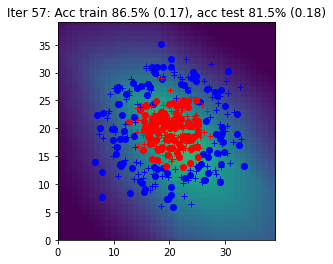

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 58: Acc train 86.5% (0.17), acc test 81.5% (0.18)


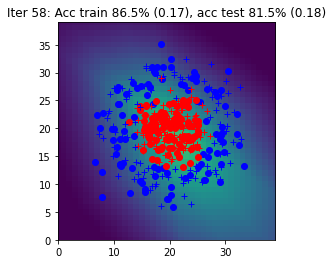

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 59: Acc train 86.5% (0.17), acc test 82.0% (0.18)


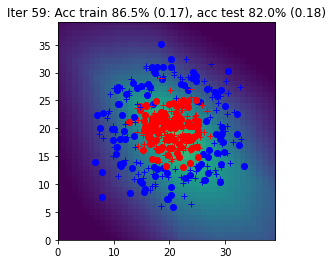

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 60: Acc train 87.0% (0.17), acc test 82.5% (0.17)


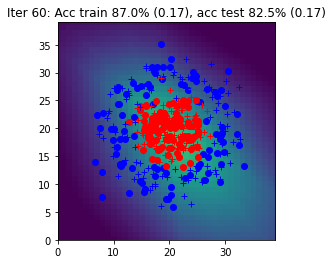

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 61: Acc train 87.5% (0.17), acc test 83.0% (0.17)


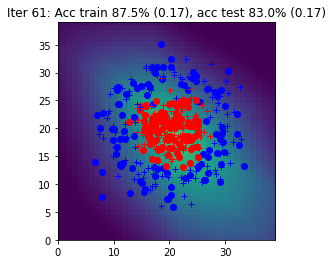

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 62: Acc train 88.0% (0.16), acc test 83.0% (0.17)


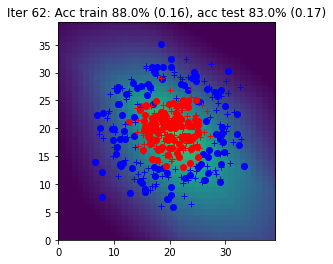

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 63: Acc train 88.0% (0.16), acc test 84.5% (0.17)


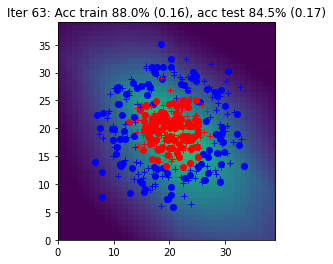

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 64: Acc train 88.5% (0.16), acc test 84.5% (0.17)


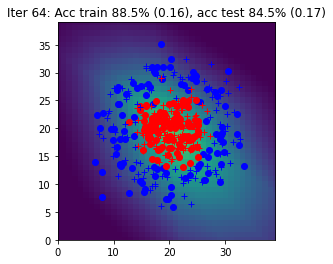

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 65: Acc train 89.0% (0.16), acc test 85.5% (0.16)


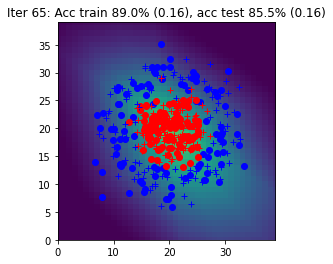

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 66: Acc train 89.0% (0.16), acc test 85.5% (0.16)


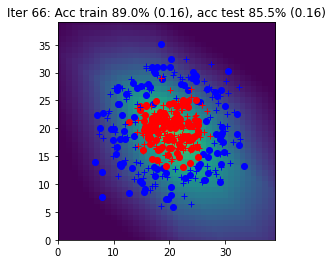

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 67: Acc train 90.0% (0.15), acc test 86.0% (0.16)


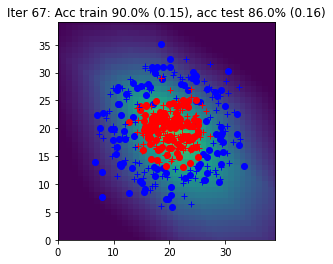

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 68: Acc train 90.5% (0.15), acc test 87.0% (0.16)


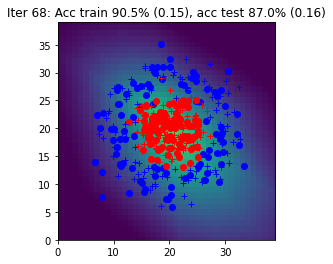

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 69: Acc train 91.0% (0.15), acc test 87.5% (0.16)


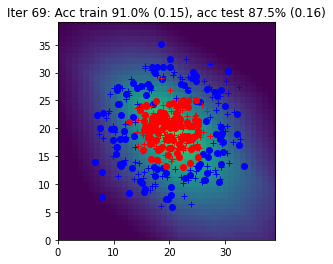

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 70: Acc train 91.0% (0.15), acc test 88.5% (0.16)


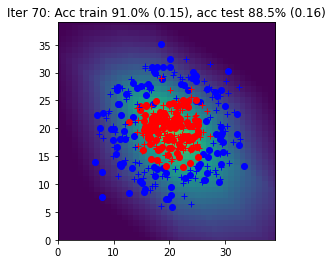

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 71: Acc train 91.5% (0.15), acc test 88.5% (0.15)


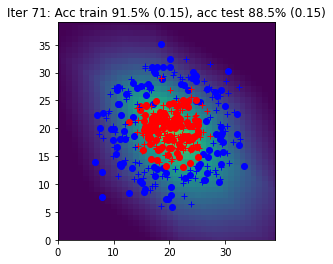

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 72: Acc train 91.5% (0.15), acc test 88.5% (0.15)


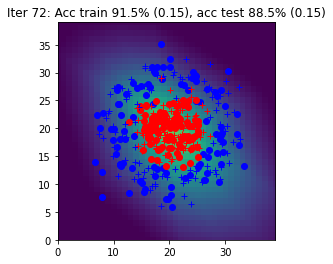

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 73: Acc train 91.5% (0.14), acc test 89.5% (0.15)


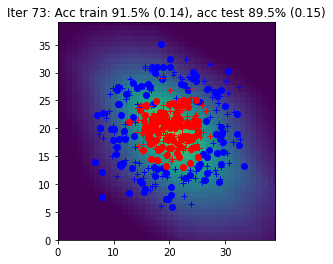

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 74: Acc train 92.0% (0.14), acc test 89.5% (0.15)


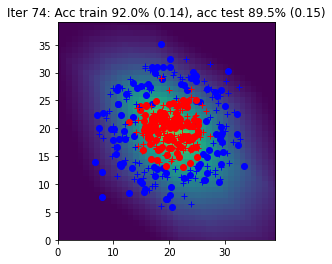

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 75: Acc train 92.0% (0.14), acc test 89.0% (0.15)


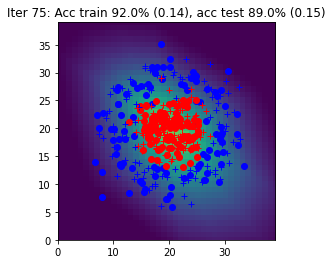

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 76: Acc train 92.0% (0.14), acc test 89.0% (0.15)


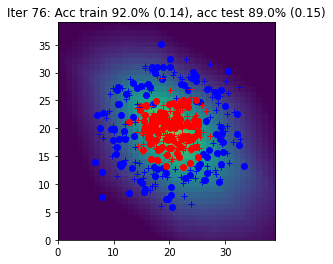

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 77: Acc train 92.0% (0.14), acc test 89.5% (0.14)


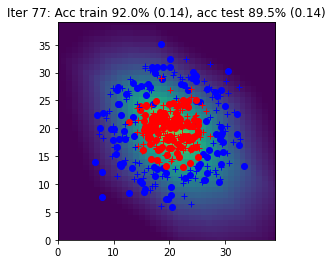

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 78: Acc train 91.5% (0.14), acc test 90.0% (0.14)


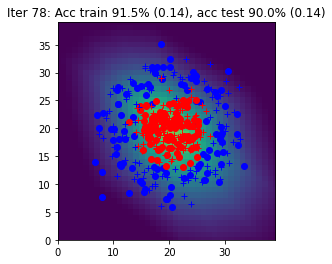

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 79: Acc train 92.0% (0.13), acc test 90.0% (0.14)


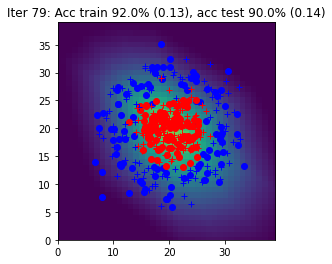

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 80: Acc train 92.0% (0.13), acc test 90.5% (0.14)


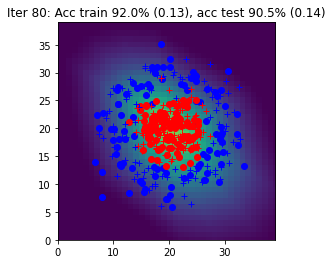

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 81: Acc train 92.0% (0.13), acc test 90.5% (0.14)


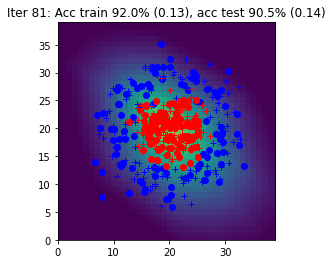

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 82: Acc train 92.0% (0.13), acc test 90.5% (0.14)


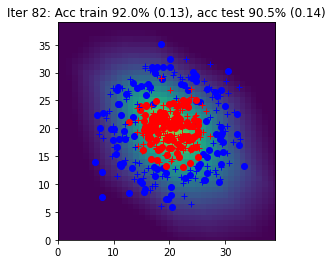

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 83: Acc train 92.0% (0.13), acc test 91.0% (0.13)


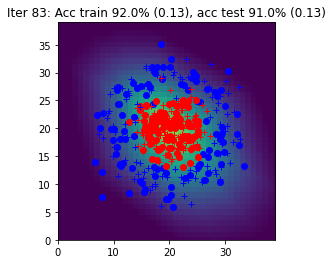

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 84: Acc train 92.0% (0.13), acc test 91.0% (0.13)


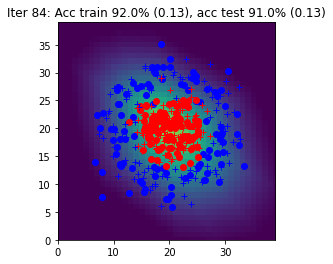

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 85: Acc train 93.0% (0.13), acc test 92.0% (0.13)


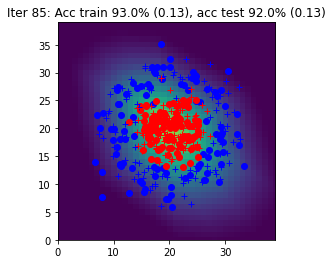

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 86: Acc train 93.5% (0.12), acc test 92.0% (0.13)


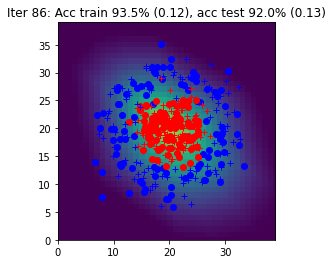

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 87: Acc train 93.5% (0.12), acc test 92.0% (0.13)


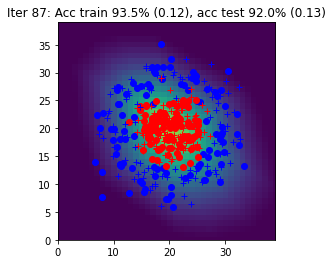

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 88: Acc train 93.5% (0.12), acc test 92.0% (0.13)


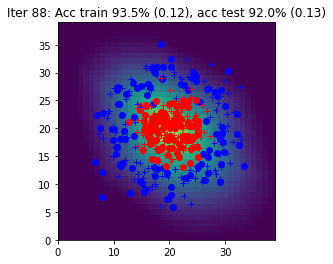

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 89: Acc train 93.5% (0.12), acc test 92.0% (0.13)


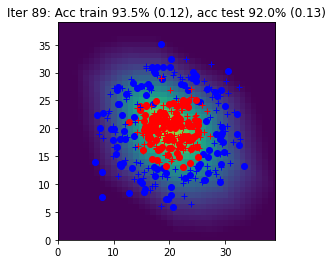

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 90: Acc train 94.5% (0.12), acc test 92.5% (0.12)


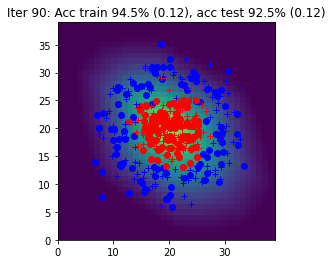

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 91: Acc train 94.5% (0.12), acc test 92.5% (0.12)


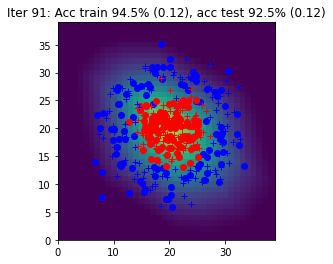

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 92: Acc train 94.5% (0.12), acc test 92.5% (0.12)


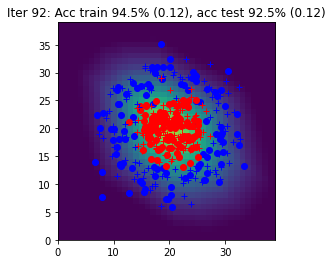

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 93: Acc train 94.5% (0.12), acc test 93.0% (0.12)


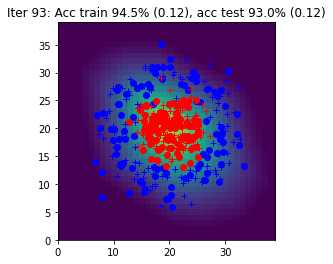

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 94: Acc train 95.0% (0.11), acc test 93.0% (0.12)


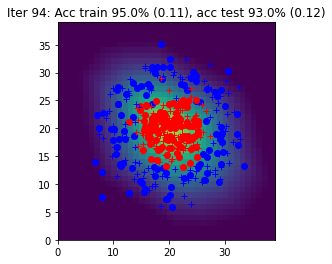

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 95: Acc train 95.0% (0.11), acc test 93.0% (0.12)


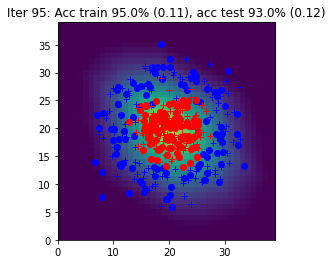

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 96: Acc train 95.0% (0.11), acc test 93.5% (0.12)


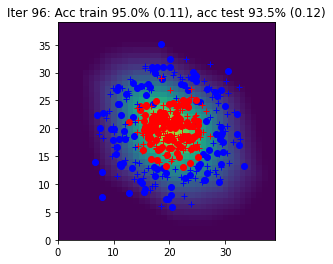

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 97: Acc train 95.0% (0.11), acc test 93.5% (0.12)


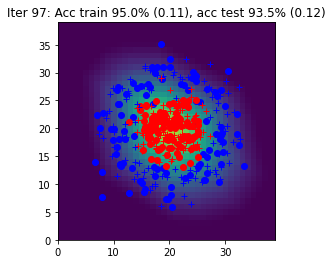

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 98: Acc train 95.0% (0.11), acc test 93.5% (0.11)


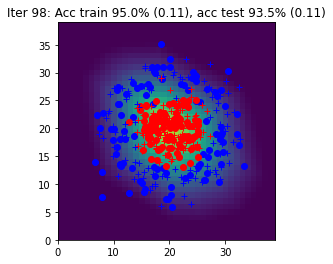

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 99: Acc train 94.5% (0.11), acc test 93.5% (0.11)


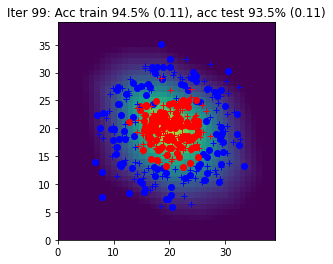

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 100: Acc train 94.5% (0.11), acc test 93.5% (0.11)


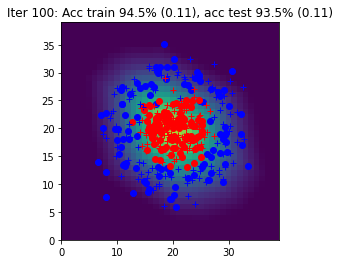

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 101: Acc train 94.5% (0.11), acc test 94.0% (0.11)


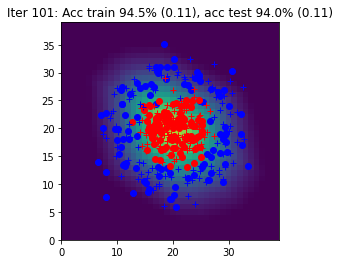

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 102: Acc train 94.5% (0.11), acc test 94.5% (0.11)


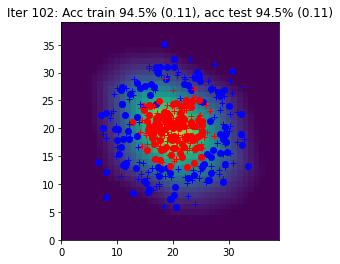

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 103: Acc train 94.5% (0.10), acc test 94.5% (0.11)


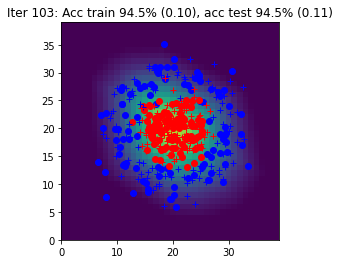

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 104: Acc train 94.5% (0.10), acc test 94.5% (0.11)


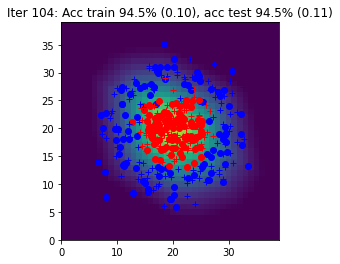

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 105: Acc train 94.5% (0.10), acc test 94.5% (0.11)


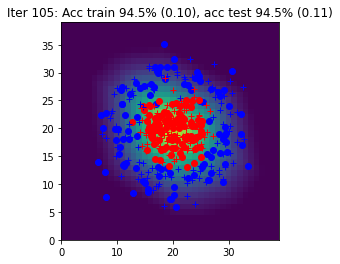

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 106: Acc train 95.0% (0.10), acc test 94.5% (0.11)


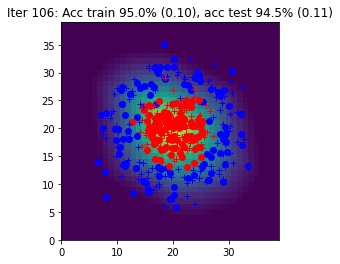

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 107: Acc train 95.0% (0.10), acc test 94.5% (0.11)


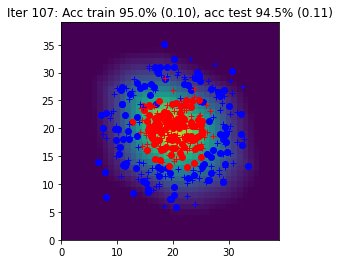

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 108: Acc train 94.5% (0.10), acc test 94.5% (0.10)


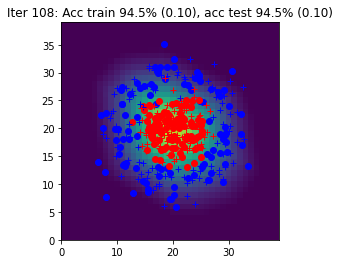

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 109: Acc train 94.5% (0.10), acc test 94.5% (0.10)


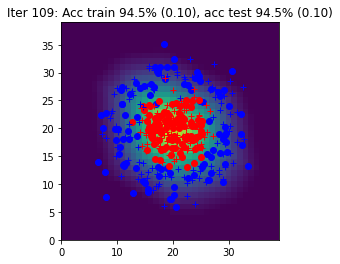

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 110: Acc train 95.0% (0.10), acc test 94.5% (0.10)


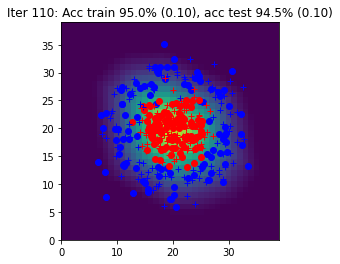

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 111: Acc train 95.0% (0.10), acc test 94.5% (0.10)


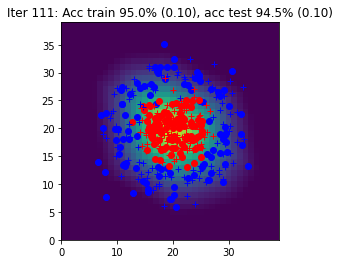

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 112: Acc train 95.0% (0.10), acc test 94.5% (0.10)


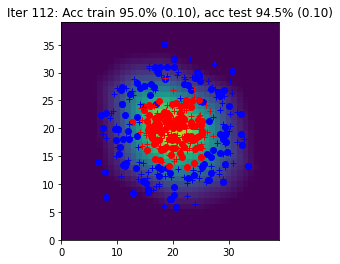

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 113: Acc train 95.0% (0.10), acc test 94.5% (0.10)


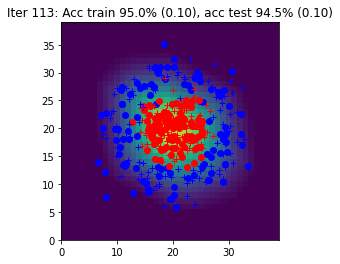

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 114: Acc train 95.0% (0.09), acc test 94.5% (0.10)


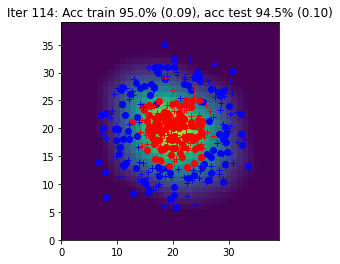

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 115: Acc train 95.0% (0.09), acc test 95.0% (0.10)


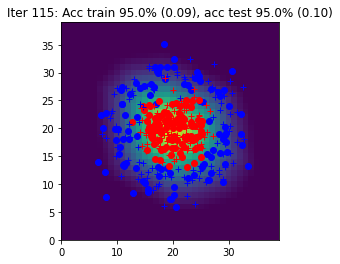

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 116: Acc train 95.0% (0.09), acc test 95.0% (0.10)


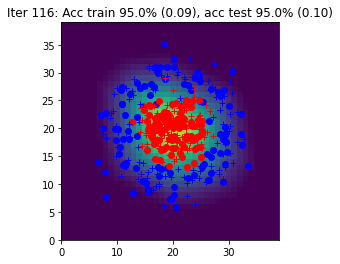

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 117: Acc train 95.0% (0.09), acc test 95.0% (0.10)


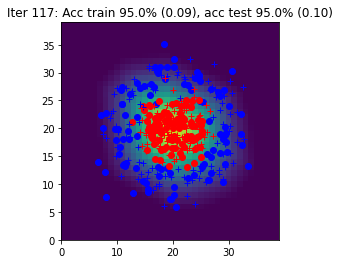

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 118: Acc train 95.0% (0.09), acc test 95.0% (0.10)


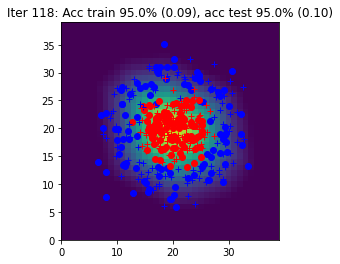

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 119: Acc train 95.0% (0.09), acc test 95.0% (0.09)


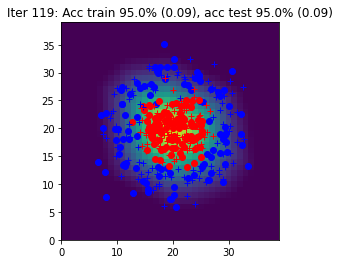

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 120: Acc train 94.5% (0.09), acc test 95.0% (0.09)


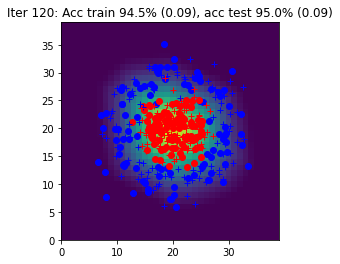

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 121: Acc train 94.5% (0.09), acc test 95.0% (0.09)


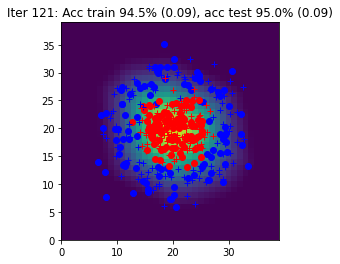

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 122: Acc train 94.5% (0.09), acc test 94.5% (0.09)


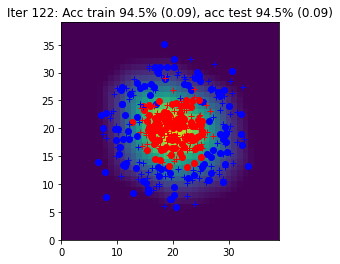

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 123: Acc train 94.5% (0.09), acc test 94.5% (0.09)


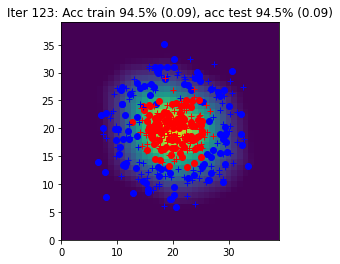

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 124: Acc train 94.5% (0.09), acc test 94.5% (0.09)


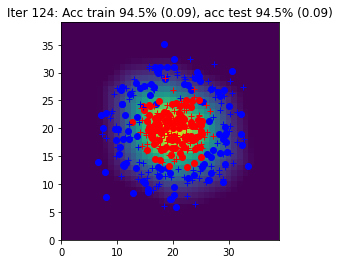

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 125: Acc train 94.5% (0.09), acc test 94.5% (0.09)


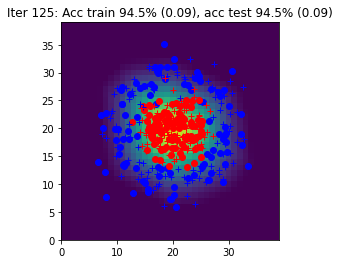

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 126: Acc train 95.0% (0.09), acc test 94.5% (0.09)


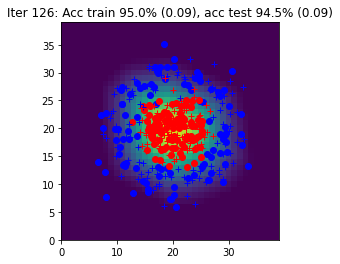

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 127: Acc train 95.0% (0.09), acc test 94.5% (0.09)


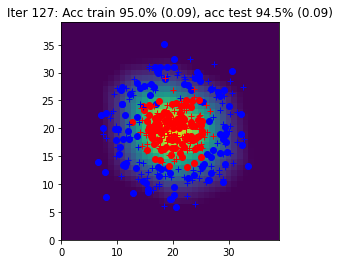

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 128: Acc train 95.0% (0.08), acc test 94.5% (0.09)


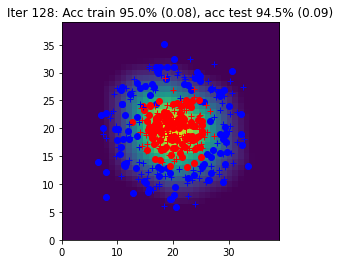

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 129: Acc train 95.0% (0.08), acc test 94.5% (0.09)


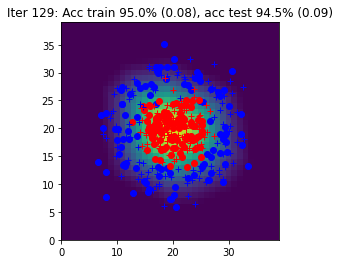

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 130: Acc train 95.0% (0.08), acc test 94.5% (0.09)


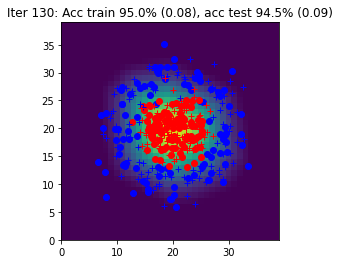

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 131: Acc train 95.0% (0.08), acc test 94.5% (0.09)


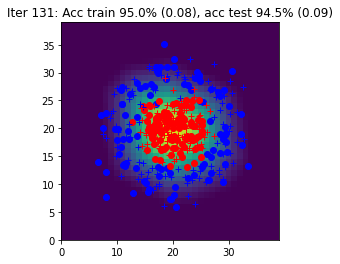

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 132: Acc train 95.0% (0.08), acc test 94.5% (0.09)


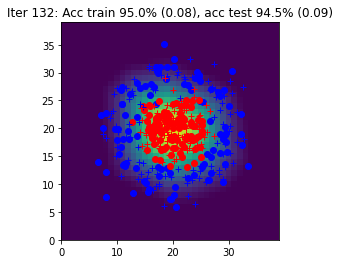

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 133: Acc train 95.0% (0.08), acc test 94.5% (0.09)


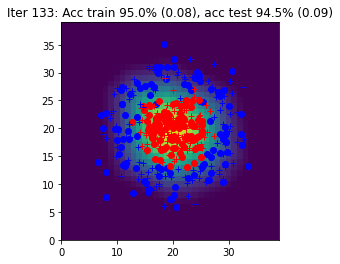

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 134: Acc train 95.0% (0.08), acc test 94.5% (0.08)


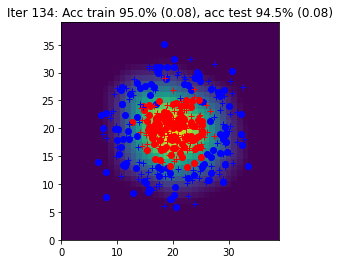

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 135: Acc train 95.0% (0.08), acc test 94.5% (0.08)


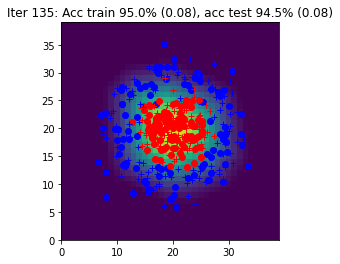

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 136: Acc train 95.5% (0.08), acc test 94.5% (0.08)


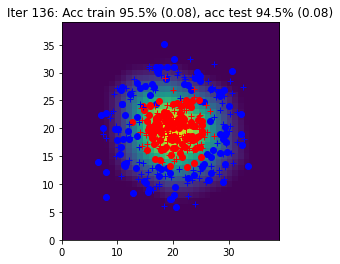

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 137: Acc train 95.5% (0.08), acc test 94.5% (0.08)


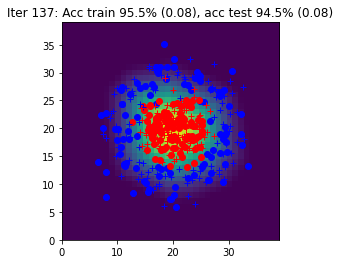

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 138: Acc train 95.5% (0.08), acc test 94.5% (0.08)


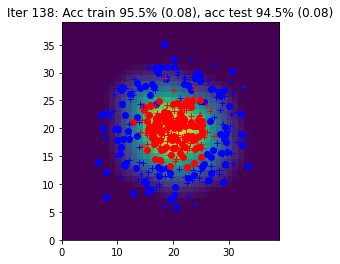

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 139: Acc train 96.0% (0.08), acc test 94.5% (0.08)


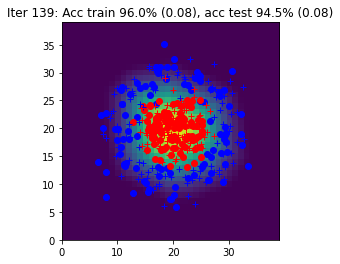

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 140: Acc train 96.0% (0.08), acc test 94.5% (0.08)


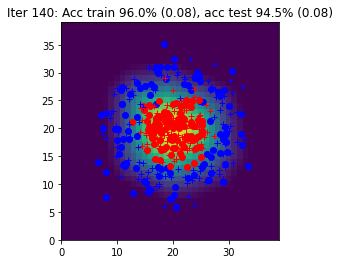

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 141: Acc train 96.0% (0.08), acc test 94.5% (0.08)


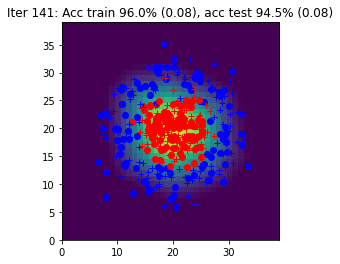

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 142: Acc train 96.0% (0.08), acc test 94.5% (0.08)


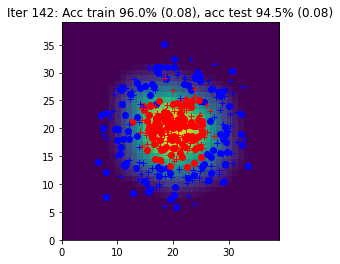

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 143: Acc train 96.0% (0.08), acc test 94.5% (0.08)


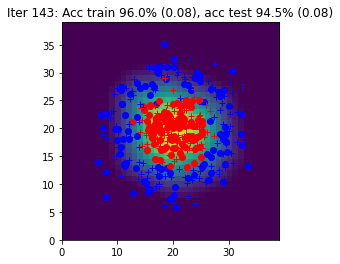

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 144: Acc train 96.0% (0.08), acc test 94.5% (0.08)


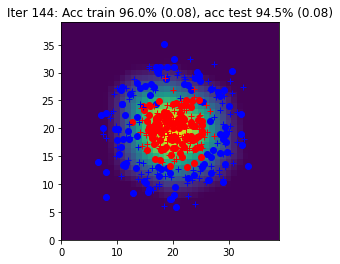

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 145: Acc train 96.0% (0.08), acc test 94.5% (0.08)


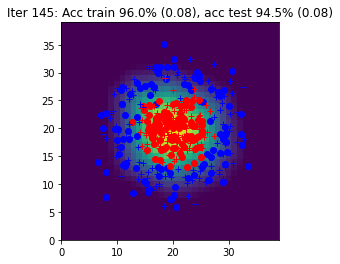

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 146: Acc train 96.0% (0.08), acc test 94.5% (0.08)


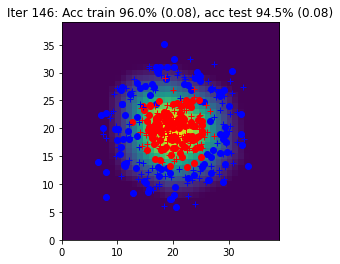

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 147: Acc train 96.0% (0.08), acc test 94.5% (0.08)


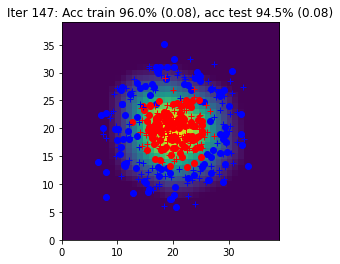

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 148: Acc train 96.0% (0.07), acc test 94.5% (0.08)


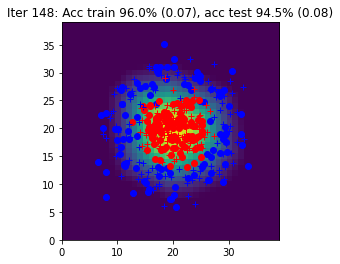

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 149: Acc train 96.0% (0.07), acc test 94.5% (0.08)


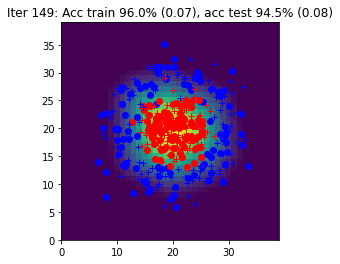

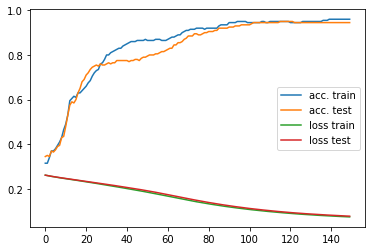

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss = init_model(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        outputs=model.forward(X)
        tloss = loss(outputs,Y)
        tloss.backward()
        model=sgd(model,eta)


        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy, sgd
        # the forward with the predict method from the model
        # and the backward function with autograd

    ####################
    ##      END        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, 100*acctrain, Ltrain, 100*acctest, Ltest)
    print(title) 
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 4 : Simplification of the SGD with `torch.optim`

In [ ]:
def init_model(nx, nh, ny, eta):

    #####################
    ## Your code here  ##
    #####################

    model = torch.nn.Sequential(
        torch.nn.Linear(nx, nh),
        torch.nn.ReLU(),
        torch.nn.Linear(nh, ny),
        torch.nn.Softmax()
    )
    loss = torch.nn.MSELoss()
    optim = torch.optim.SGD(model.parameters(), lr=eta)

    ####################
    ##      END        #
    ####################

    return model, loss, optim

The `sgd` function is replaced by calling the `optim.zero_grad()` before the backward and `optim.step()` after. 

## Algorithme global d'apprentissage (avec autograd, les couches `torch.nn` et `torch.optim`)

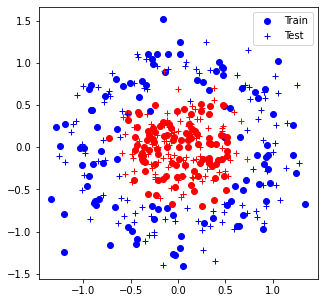

Iter 0: Acc train 49.0% (0.24), acc test 46.5% (0.24)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


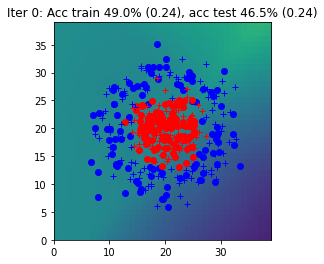

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 1: Acc train 48.5% (0.24), acc test 46.5% (0.24)


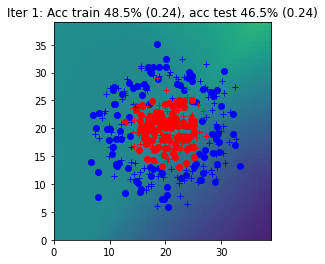

Iter 2: Acc train 47.0% (0.24), acc test 46.5% (0.24)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


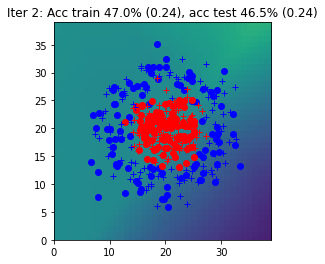

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 3: Acc train 46.0% (0.24), acc test 46.5% (0.24)


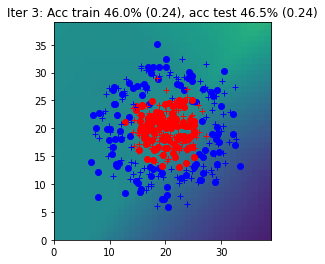

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 4: Acc train 46.5% (0.24), acc test 48.5% (0.24)


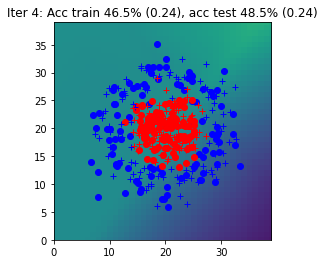

Iter 5: Acc train 57.5% (0.24), acc test 59.5% (0.23)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


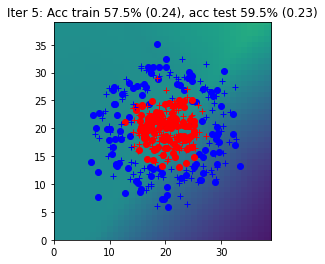

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 6: Acc train 66.5% (0.24), acc test 69.5% (0.23)


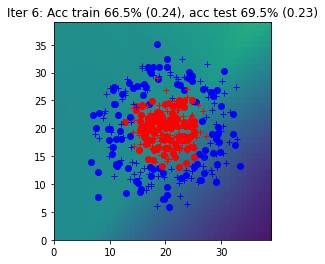

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 7: Acc train 72.5% (0.23), acc test 72.0% (0.23)


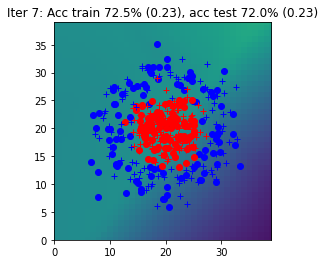

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 8: Acc train 72.0% (0.23), acc test 74.0% (0.23)


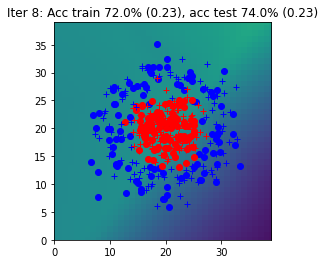

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 9: Acc train 70.0% (0.23), acc test 72.0% (0.23)


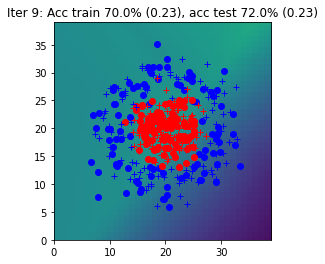

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 10: Acc train 71.0% (0.23), acc test 72.0% (0.23)


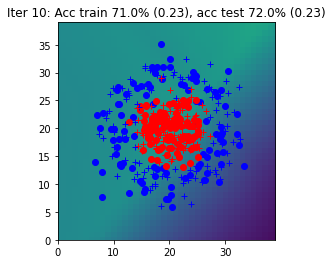

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 11: Acc train 70.5% (0.23), acc test 72.5% (0.23)


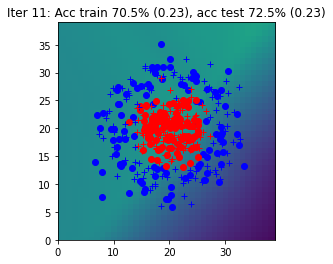

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 12: Acc train 70.5% (0.23), acc test 71.5% (0.23)


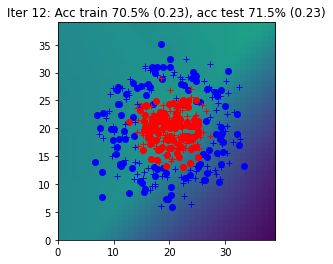

Iter 13: Acc train 71.5% (0.23), acc test 71.5% (0.22)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


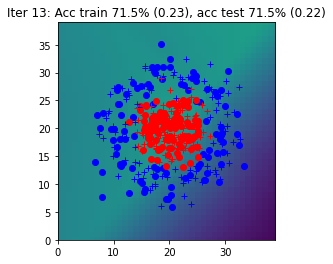

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 14: Acc train 71.5% (0.23), acc test 71.5% (0.22)


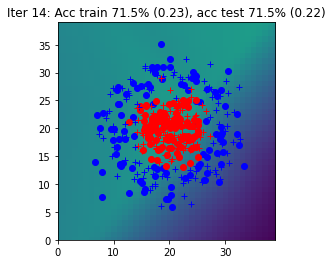

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 15: Acc train 72.0% (0.22), acc test 72.5% (0.22)


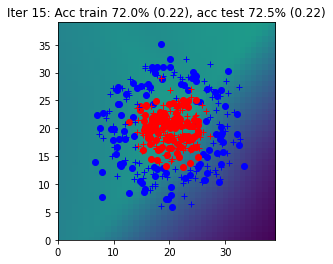

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 16: Acc train 72.5% (0.22), acc test 72.5% (0.22)


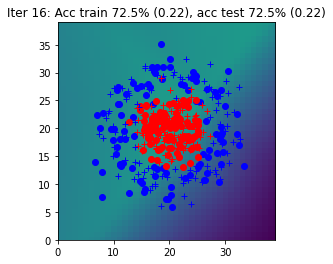

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 17: Acc train 73.0% (0.22), acc test 73.0% (0.22)


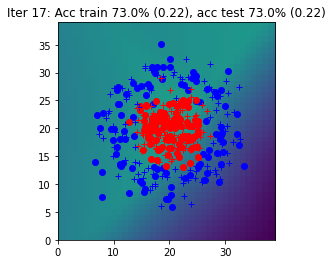

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 18: Acc train 73.5% (0.22), acc test 73.0% (0.22)


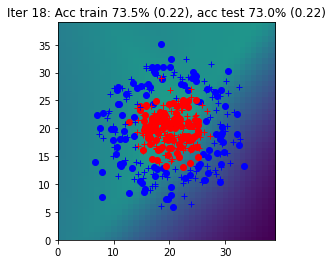

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 19: Acc train 75.5% (0.22), acc test 74.0% (0.22)


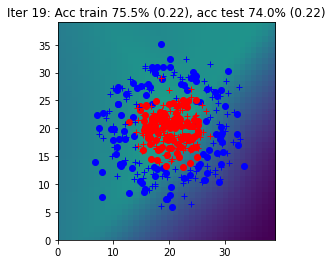

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 20: Acc train 75.5% (0.22), acc test 75.0% (0.22)


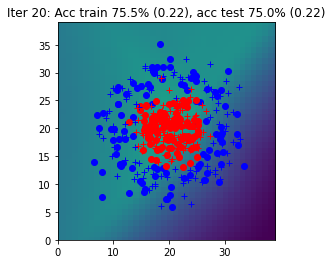

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 21: Acc train 75.5% (0.22), acc test 75.5% (0.21)


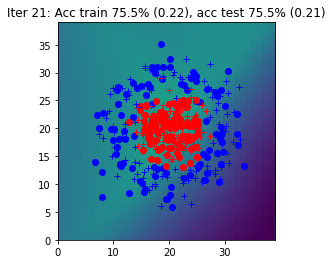

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 22: Acc train 75.0% (0.22), acc test 76.0% (0.21)


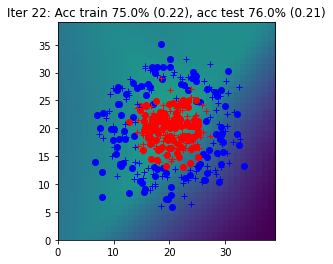

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 23: Acc train 75.0% (0.21), acc test 77.5% (0.21)


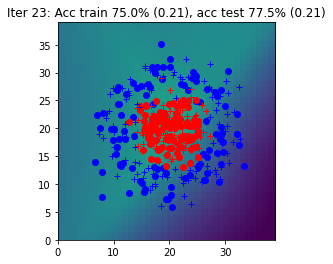

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 24: Acc train 74.5% (0.21), acc test 78.5% (0.21)


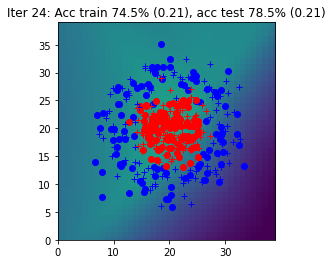

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 25: Acc train 76.0% (0.21), acc test 79.0% (0.21)


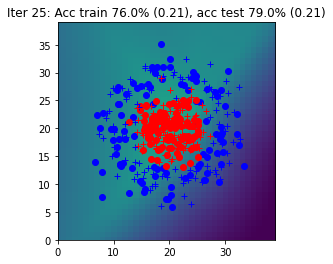

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 26: Acc train 77.5% (0.21), acc test 79.0% (0.21)


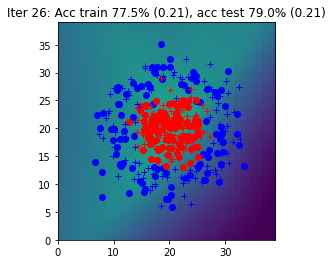

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 27: Acc train 78.0% (0.21), acc test 79.5% (0.21)


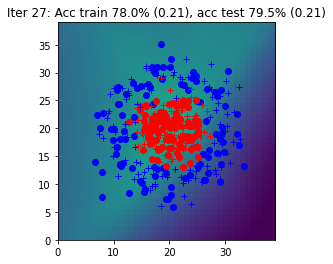

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 28: Acc train 79.5% (0.21), acc test 80.0% (0.20)


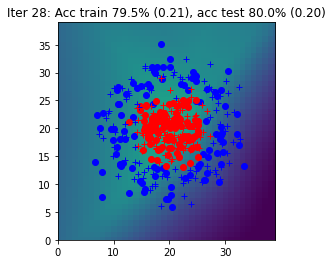

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 29: Acc train 80.5% (0.21), acc test 80.0% (0.20)


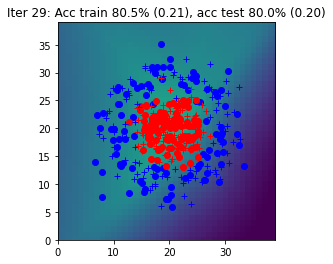

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 30: Acc train 82.0% (0.21), acc test 81.0% (0.20)


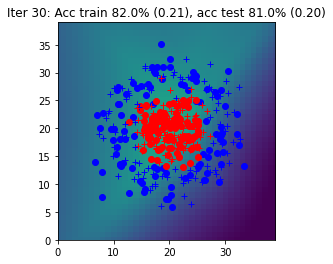

Iter 31: Acc train 83.0% (0.20), acc test 82.0% (0.20)


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


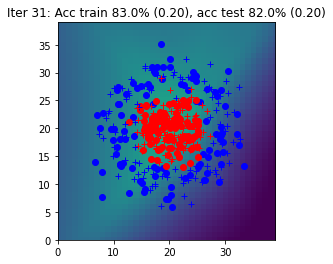

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 32: Acc train 83.5% (0.20), acc test 82.5% (0.20)


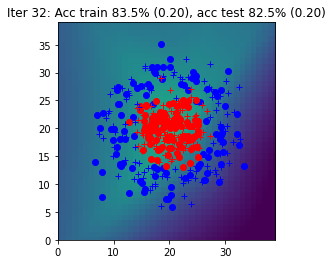

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 33: Acc train 83.5% (0.20), acc test 84.0% (0.20)


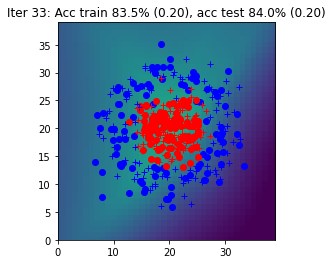

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 34: Acc train 84.5% (0.20), acc test 85.0% (0.20)


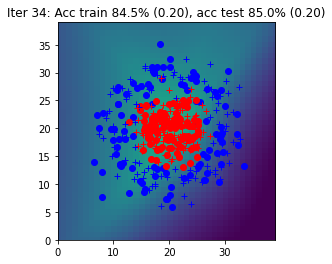

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 35: Acc train 85.0% (0.20), acc test 87.0% (0.20)


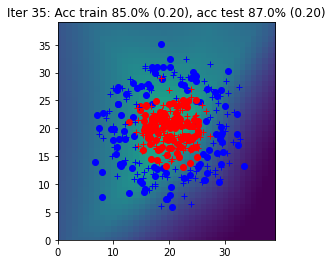

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 36: Acc train 86.0% (0.20), acc test 88.5% (0.19)


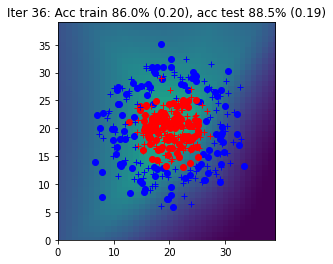

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 37: Acc train 86.5% (0.19), acc test 88.0% (0.19)


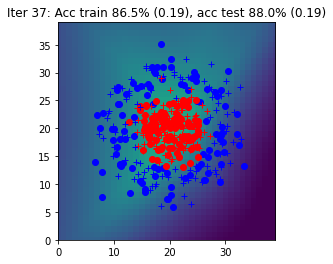

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 38: Acc train 86.5% (0.19), acc test 88.0% (0.19)


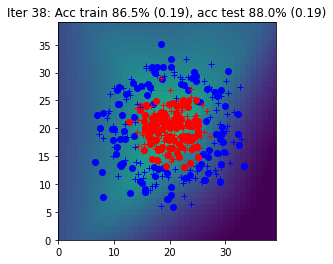

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 39: Acc train 87.5% (0.19), acc test 88.0% (0.19)


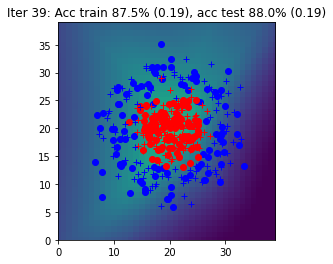

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 40: Acc train 87.0% (0.19), acc test 88.0% (0.19)


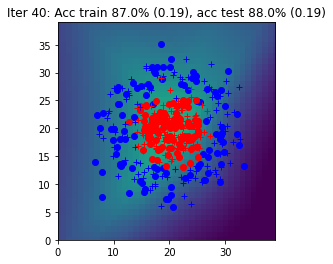

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 41: Acc train 87.5% (0.19), acc test 88.0% (0.19)


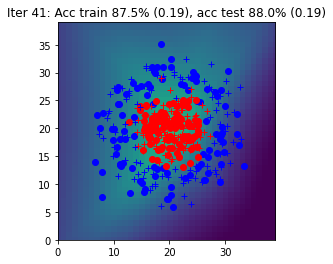

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 42: Acc train 88.5% (0.19), acc test 88.0% (0.18)


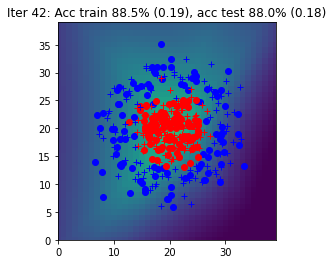

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 43: Acc train 89.0% (0.19), acc test 89.0% (0.18)


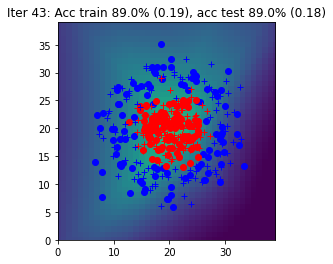

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 44: Acc train 90.0% (0.18), acc test 89.0% (0.18)


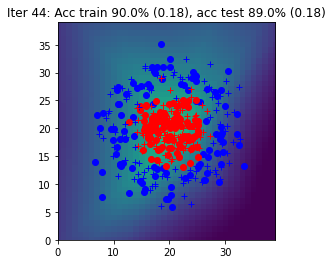

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 45: Acc train 90.5% (0.18), acc test 89.0% (0.18)


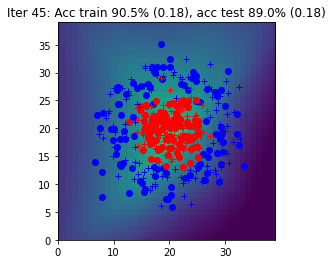

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 46: Acc train 90.5% (0.18), acc test 88.5% (0.18)


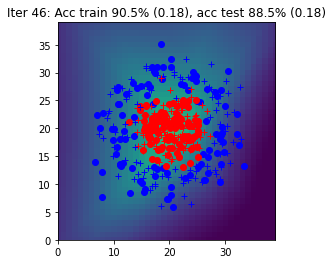

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 47: Acc train 90.5% (0.18), acc test 89.0% (0.18)


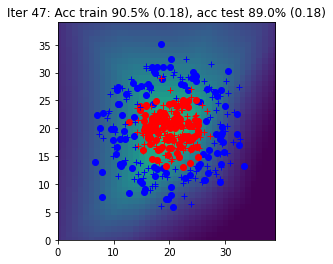

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 48: Acc train 91.0% (0.18), acc test 89.0% (0.17)


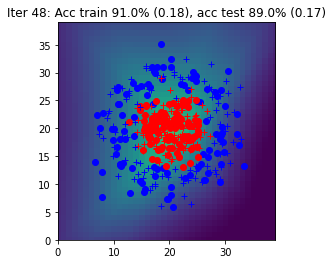

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 49: Acc train 91.0% (0.17), acc test 89.0% (0.17)


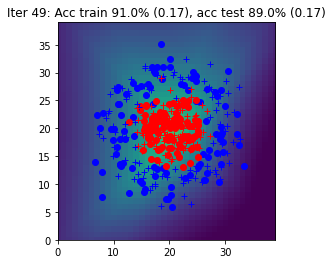

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 50: Acc train 91.5% (0.17), acc test 91.0% (0.17)


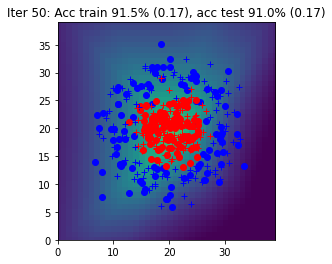

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 51: Acc train 92.0% (0.17), acc test 91.5% (0.17)


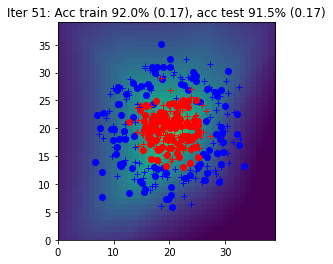

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 52: Acc train 92.0% (0.17), acc test 91.5% (0.17)


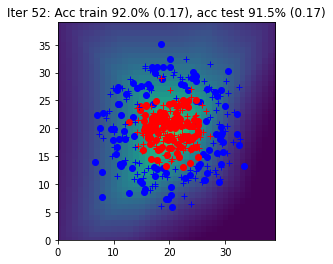

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 53: Acc train 92.5% (0.17), acc test 91.5% (0.17)


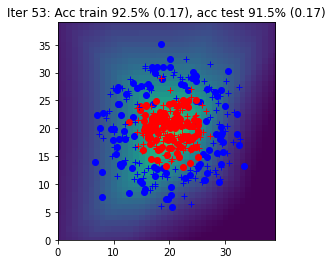

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 54: Acc train 93.0% (0.17), acc test 91.5% (0.16)


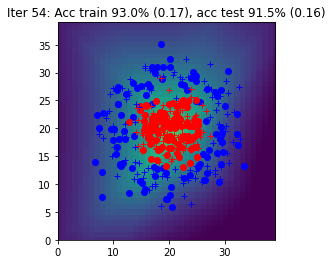

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 55: Acc train 93.0% (0.16), acc test 91.5% (0.16)


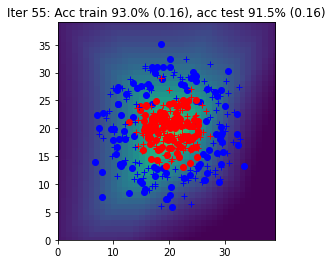

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 56: Acc train 93.0% (0.16), acc test 91.5% (0.16)


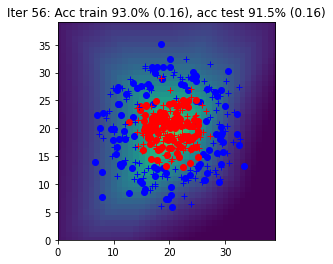

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 57: Acc train 93.0% (0.16), acc test 91.5% (0.16)


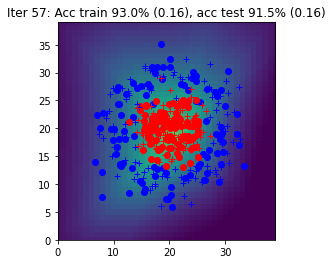

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 58: Acc train 93.0% (0.16), acc test 91.5% (0.16)


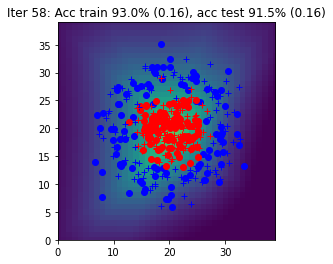

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 59: Acc train 93.0% (0.16), acc test 91.5% (0.16)


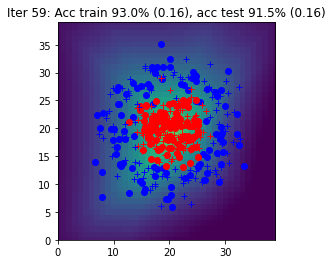

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 60: Acc train 93.5% (0.15), acc test 92.0% (0.15)


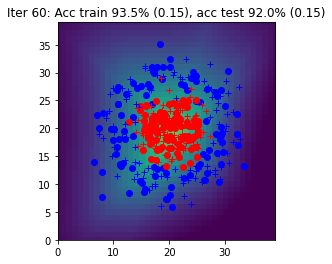

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 61: Acc train 94.0% (0.15), acc test 92.0% (0.15)


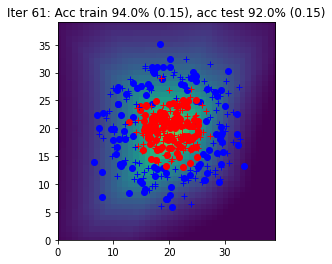

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 62: Acc train 94.0% (0.15), acc test 92.0% (0.15)


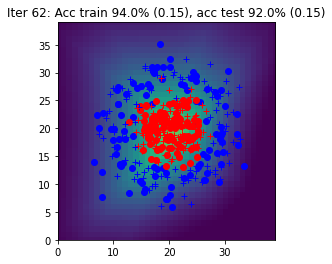

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 63: Acc train 94.5% (0.15), acc test 92.0% (0.15)


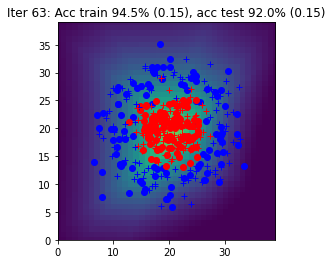

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 64: Acc train 94.5% (0.15), acc test 92.0% (0.15)


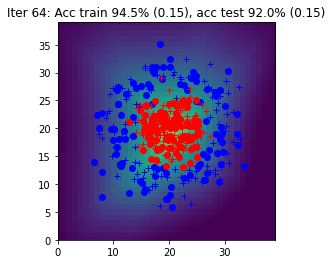

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 65: Acc train 94.5% (0.15), acc test 91.5% (0.15)


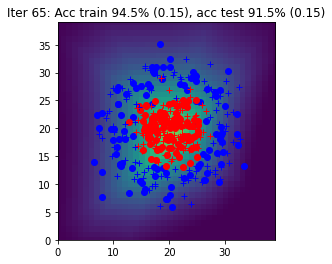

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 66: Acc train 95.0% (0.14), acc test 92.0% (0.14)


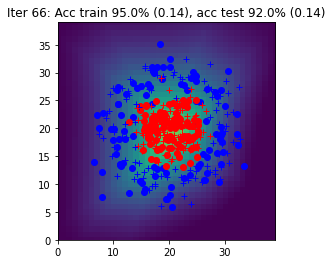

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 67: Acc train 95.0% (0.14), acc test 92.0% (0.14)


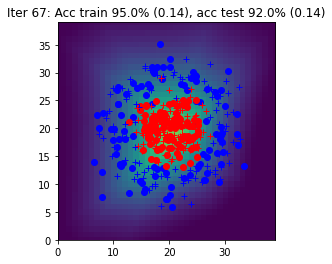

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 68: Acc train 95.0% (0.14), acc test 93.0% (0.14)


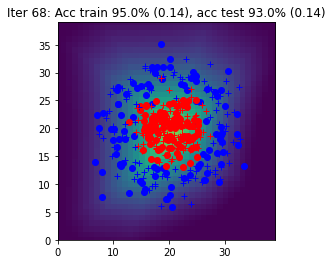

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 69: Acc train 94.5% (0.14), acc test 92.5% (0.14)


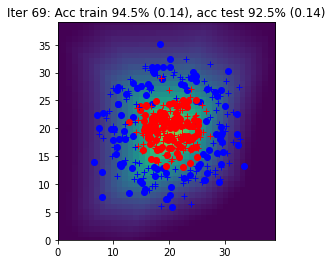

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 70: Acc train 94.5% (0.14), acc test 92.5% (0.14)


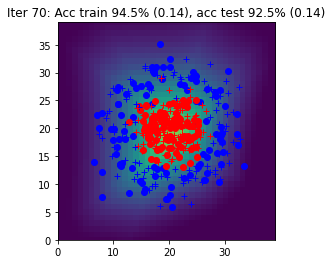

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 71: Acc train 94.5% (0.14), acc test 92.5% (0.14)


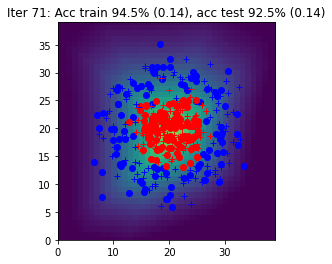

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 72: Acc train 94.5% (0.13), acc test 92.5% (0.14)


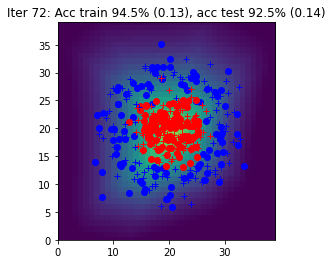

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 73: Acc train 95.0% (0.13), acc test 93.0% (0.13)


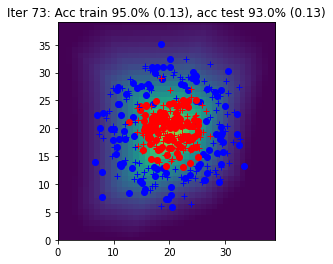

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 74: Acc train 95.0% (0.13), acc test 93.0% (0.13)


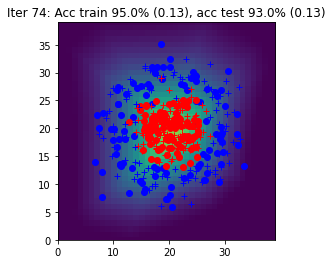

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 75: Acc train 95.0% (0.13), acc test 93.0% (0.13)


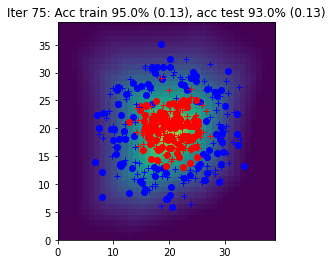

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 76: Acc train 95.0% (0.13), acc test 93.0% (0.13)


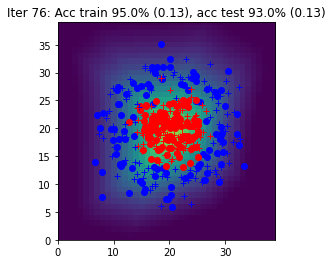

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 77: Acc train 95.0% (0.13), acc test 93.0% (0.13)


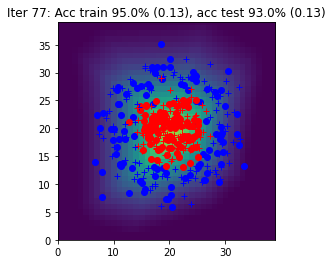

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 78: Acc train 95.0% (0.12), acc test 93.0% (0.13)


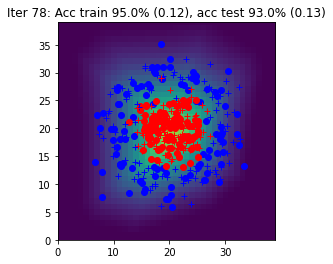

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 79: Acc train 95.0% (0.12), acc test 93.0% (0.13)


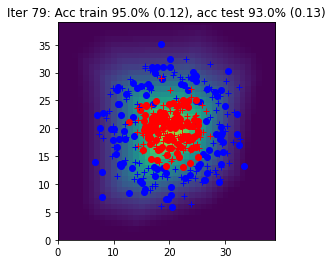

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 80: Acc train 95.0% (0.12), acc test 93.0% (0.12)


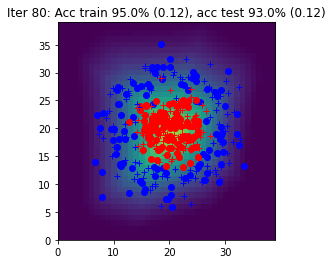

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 81: Acc train 95.0% (0.12), acc test 93.5% (0.12)


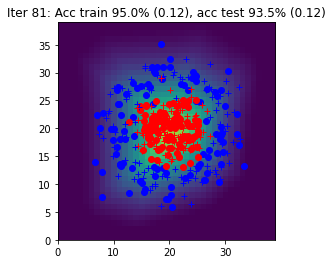

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 82: Acc train 95.0% (0.12), acc test 93.5% (0.12)


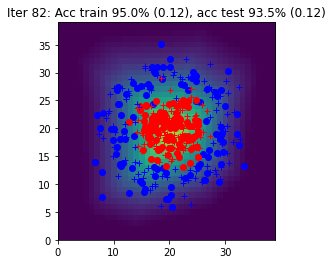

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 83: Acc train 95.0% (0.12), acc test 94.0% (0.12)


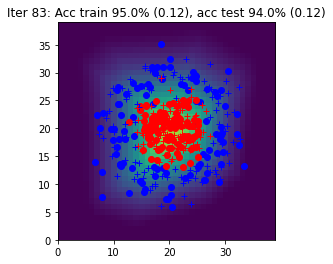

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 84: Acc train 95.0% (0.12), acc test 93.5% (0.12)


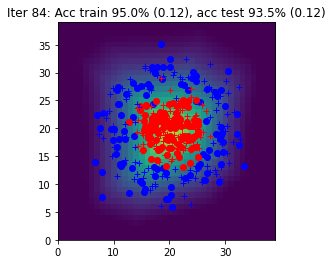

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 85: Acc train 95.0% (0.11), acc test 94.0% (0.12)


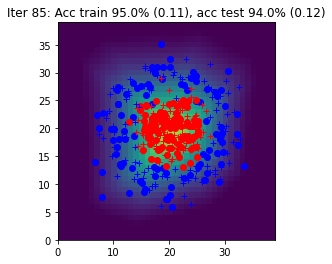

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 86: Acc train 95.0% (0.11), acc test 94.0% (0.12)


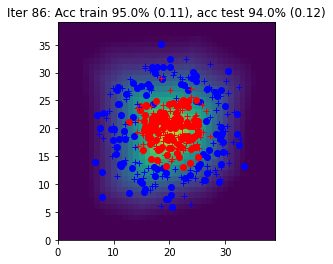

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 87: Acc train 95.0% (0.11), acc test 94.0% (0.12)


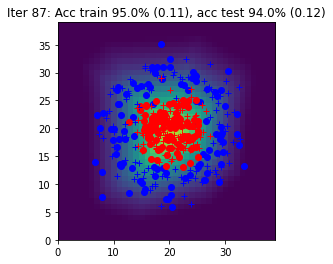

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 88: Acc train 95.0% (0.11), acc test 94.0% (0.11)


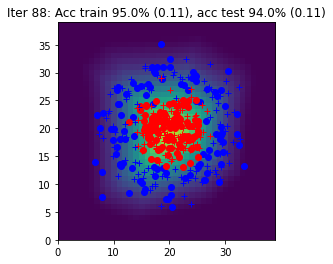

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 89: Acc train 95.0% (0.11), acc test 94.0% (0.11)


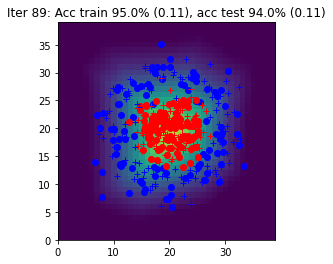

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 90: Acc train 95.0% (0.11), acc test 94.0% (0.11)


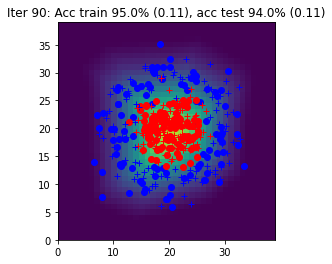

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 91: Acc train 95.0% (0.11), acc test 94.0% (0.11)


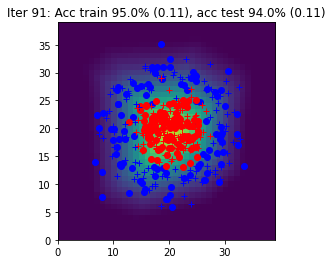

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 92: Acc train 95.0% (0.11), acc test 94.0% (0.11)


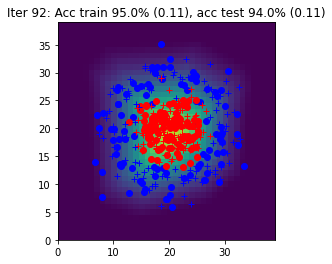

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 93: Acc train 95.0% (0.10), acc test 94.0% (0.11)


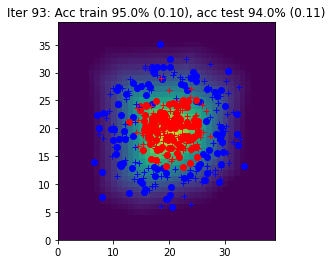

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 94: Acc train 95.0% (0.10), acc test 94.0% (0.11)


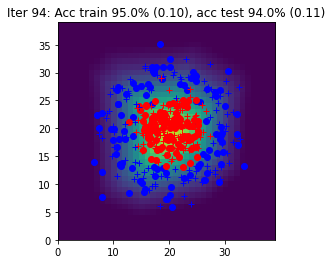

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 95: Acc train 95.0% (0.10), acc test 94.0% (0.11)


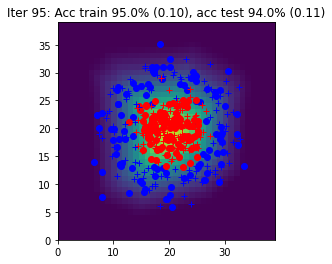

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 96: Acc train 95.0% (0.10), acc test 94.0% (0.11)


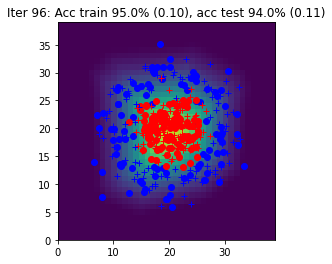

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 97: Acc train 95.0% (0.10), acc test 94.0% (0.10)


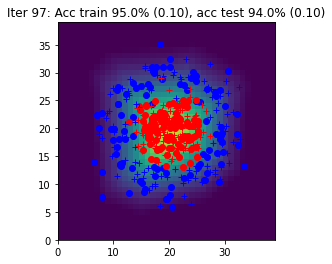

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 98: Acc train 95.0% (0.10), acc test 94.0% (0.10)


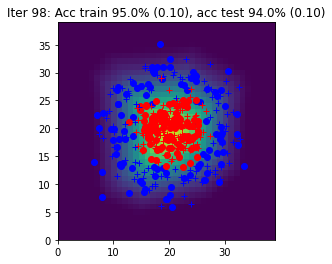

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 99: Acc train 95.0% (0.10), acc test 94.0% (0.10)


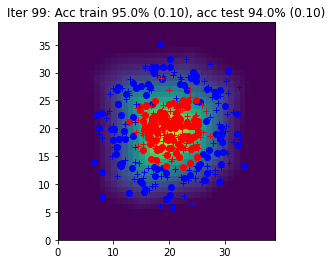

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 100: Acc train 95.0% (0.10), acc test 94.0% (0.10)


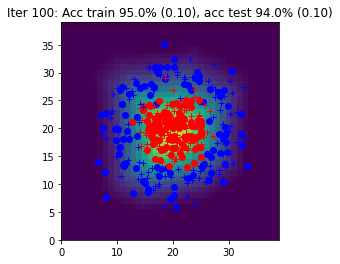

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 101: Acc train 95.0% (0.10), acc test 94.0% (0.10)


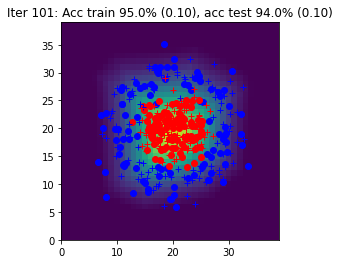

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 102: Acc train 95.0% (0.10), acc test 94.0% (0.10)


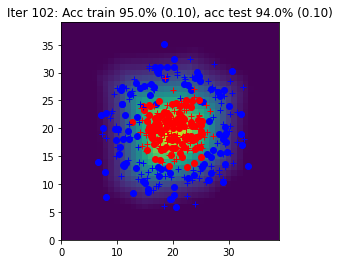

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 103: Acc train 95.5% (0.09), acc test 93.5% (0.10)


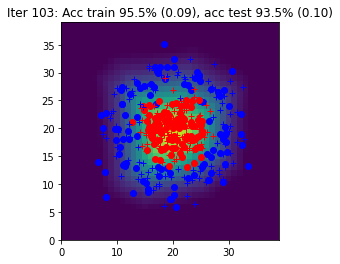

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 104: Acc train 95.0% (0.09), acc test 93.5% (0.10)


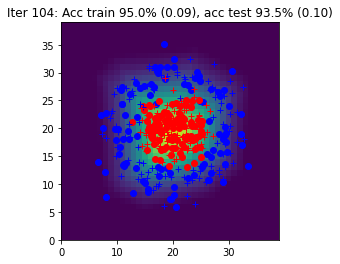

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 105: Acc train 95.0% (0.09), acc test 94.0% (0.10)


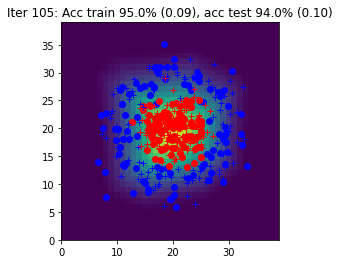

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 106: Acc train 95.0% (0.09), acc test 94.0% (0.10)


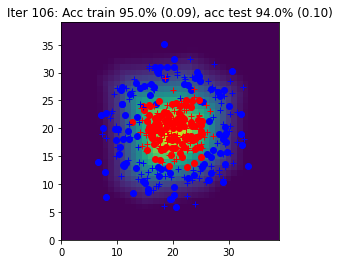

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 107: Acc train 95.0% (0.09), acc test 94.0% (0.10)


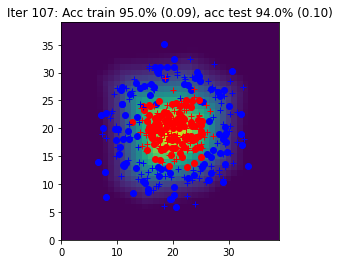

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 108: Acc train 95.5% (0.09), acc test 94.0% (0.09)


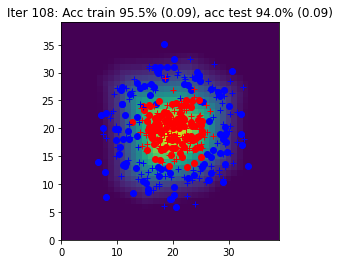

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 109: Acc train 95.5% (0.09), acc test 94.0% (0.09)


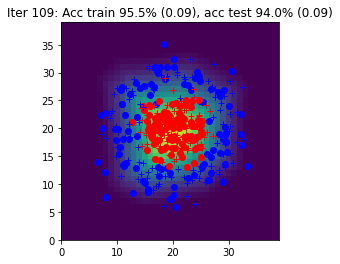

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 110: Acc train 95.5% (0.09), acc test 94.0% (0.09)


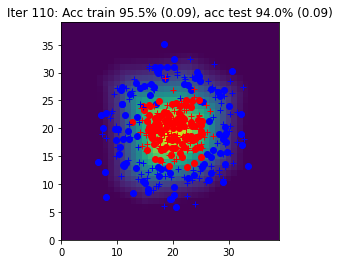

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 111: Acc train 95.5% (0.09), acc test 94.0% (0.09)


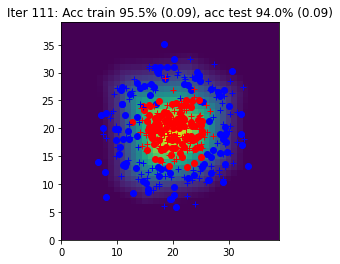

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 112: Acc train 95.5% (0.09), acc test 94.0% (0.09)


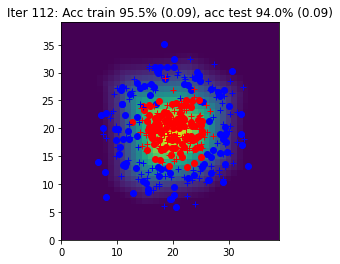

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 113: Acc train 95.5% (0.09), acc test 94.5% (0.09)


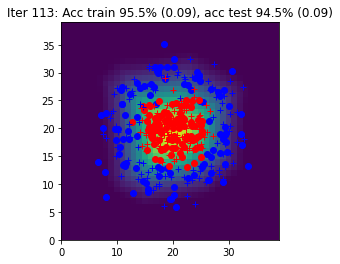

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 114: Acc train 95.5% (0.09), acc test 94.0% (0.09)


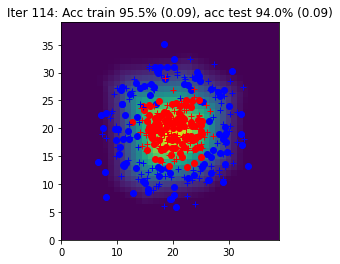

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 115: Acc train 95.5% (0.08), acc test 94.5% (0.09)


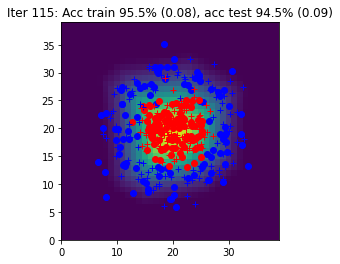

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 116: Acc train 95.5% (0.08), acc test 94.5% (0.09)


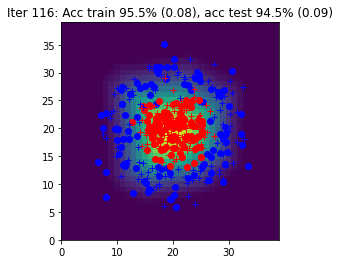

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 117: Acc train 95.5% (0.08), acc test 94.5% (0.09)


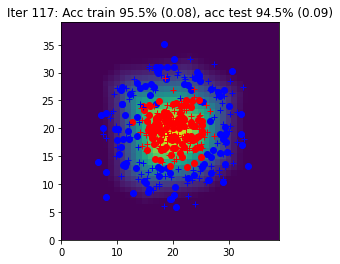

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 118: Acc train 95.5% (0.08), acc test 94.5% (0.09)


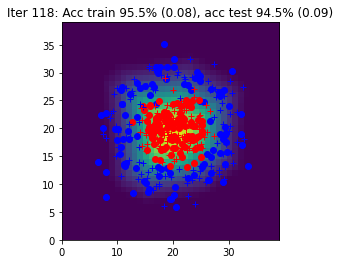

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 119: Acc train 95.5% (0.08), acc test 94.5% (0.09)


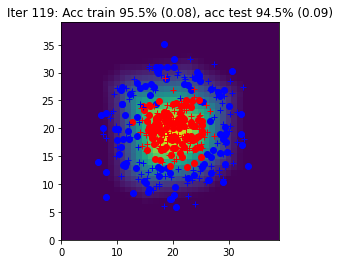

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 120: Acc train 95.5% (0.08), acc test 94.5% (0.09)


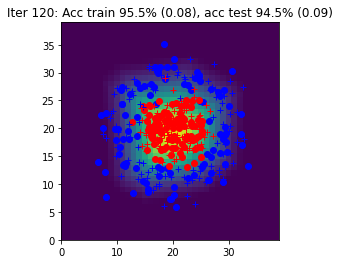

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 121: Acc train 95.5% (0.08), acc test 94.5% (0.09)


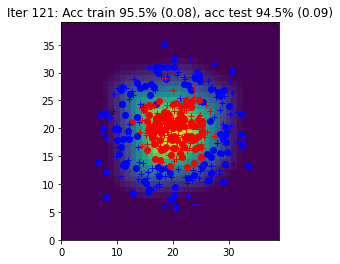

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 122: Acc train 95.5% (0.08), acc test 94.5% (0.09)


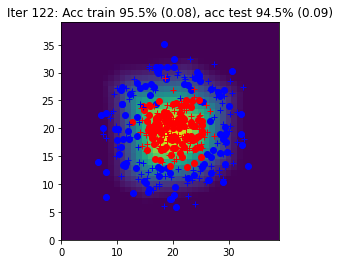

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 123: Acc train 95.5% (0.08), acc test 94.5% (0.08)


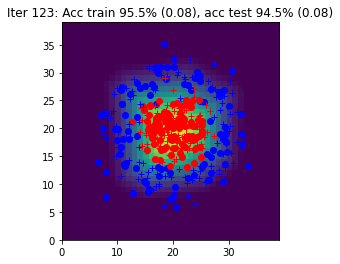

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 124: Acc train 95.5% (0.08), acc test 94.5% (0.08)


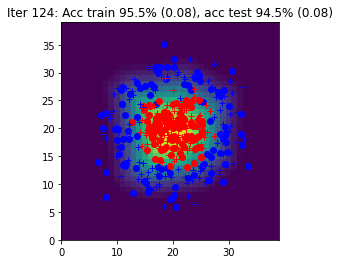

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 125: Acc train 95.5% (0.08), acc test 94.5% (0.08)


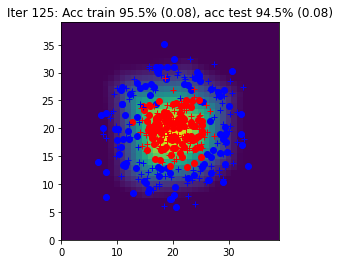

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 126: Acc train 95.5% (0.08), acc test 94.5% (0.08)


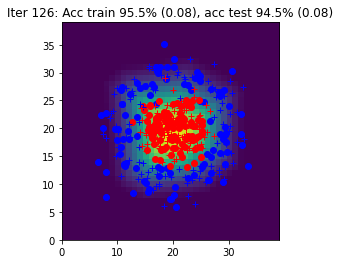

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 127: Acc train 95.5% (0.08), acc test 94.5% (0.08)


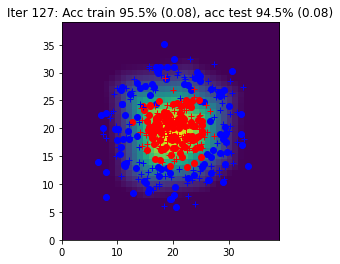

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 128: Acc train 95.5% (0.08), acc test 94.5% (0.08)


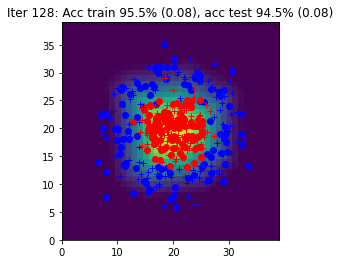

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 129: Acc train 95.5% (0.08), acc test 94.5% (0.08)


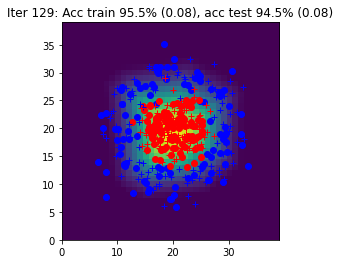

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 130: Acc train 95.5% (0.08), acc test 94.5% (0.08)


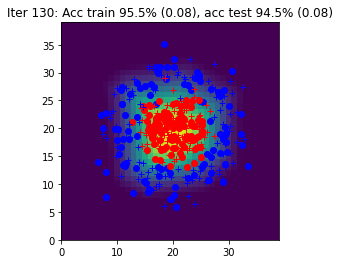

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 131: Acc train 95.5% (0.08), acc test 94.5% (0.08)


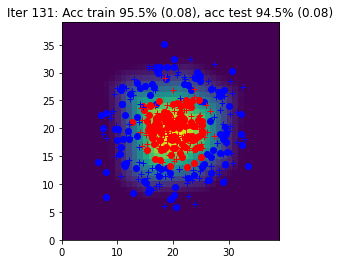

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 132: Acc train 95.5% (0.07), acc test 94.5% (0.08)


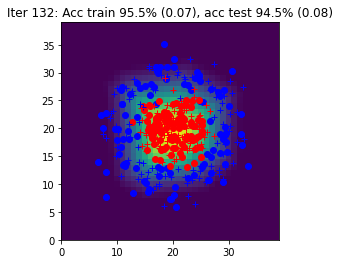

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 133: Acc train 95.5% (0.07), acc test 94.5% (0.08)


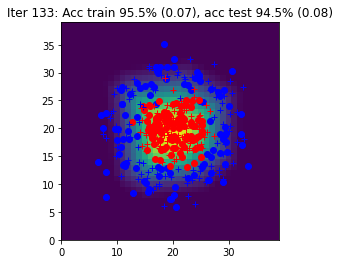

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 134: Acc train 95.5% (0.07), acc test 94.5% (0.08)


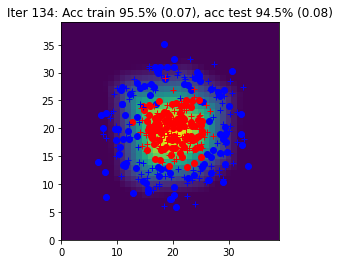

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 135: Acc train 95.5% (0.07), acc test 94.5% (0.08)


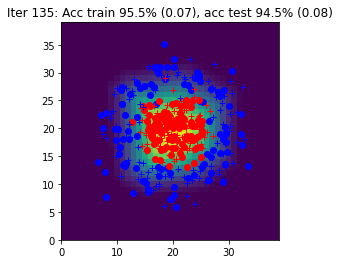

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 136: Acc train 95.5% (0.07), acc test 94.5% (0.08)


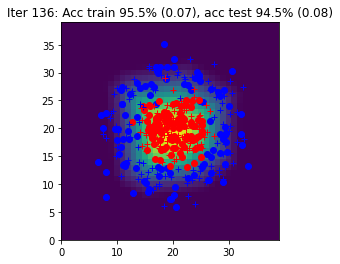

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 137: Acc train 95.5% (0.07), acc test 94.5% (0.08)


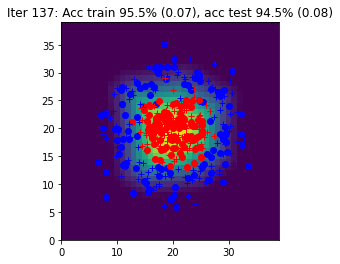

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 138: Acc train 95.5% (0.07), acc test 94.5% (0.08)


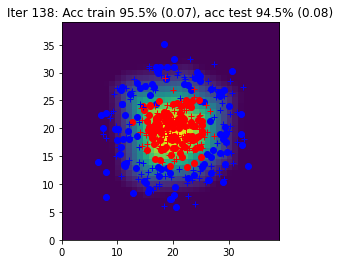

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 139: Acc train 95.5% (0.07), acc test 94.5% (0.08)


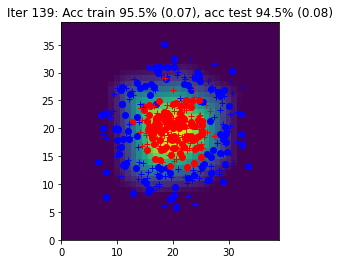

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 140: Acc train 95.5% (0.07), acc test 94.5% (0.08)


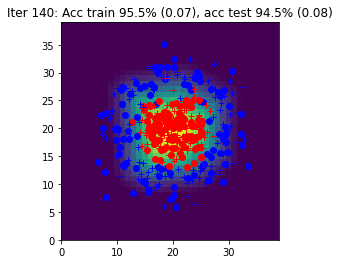

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 141: Acc train 95.5% (0.07), acc test 94.5% (0.08)


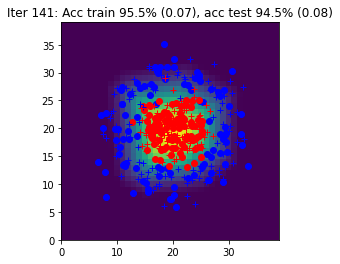

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 142: Acc train 95.5% (0.07), acc test 94.5% (0.08)


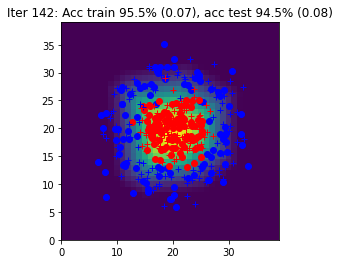

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 143: Acc train 95.5% (0.07), acc test 94.5% (0.08)


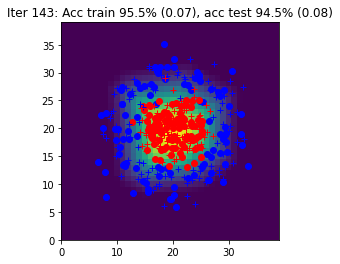

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 144: Acc train 95.5% (0.07), acc test 94.5% (0.07)


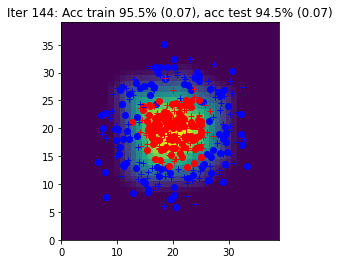

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 145: Acc train 95.5% (0.07), acc test 94.5% (0.07)


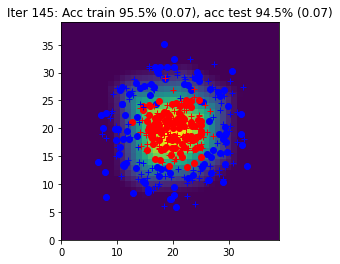

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 146: Acc train 95.5% (0.07), acc test 94.5% (0.07)


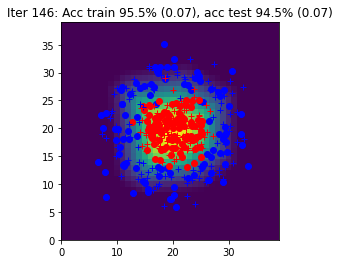

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 147: Acc train 95.5% (0.07), acc test 94.5% (0.07)


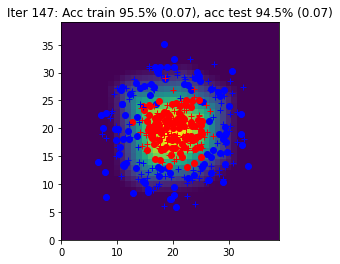

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 148: Acc train 95.5% (0.07), acc test 94.5% (0.07)


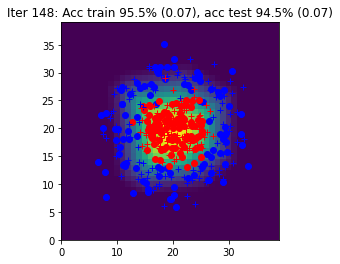

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:139: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Iter 149: Acc train 95.5% (0.07), acc test 94.5% (0.07)


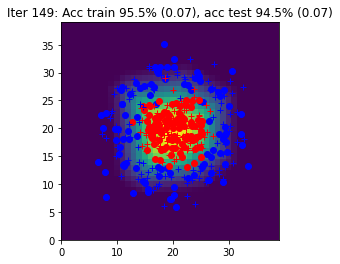

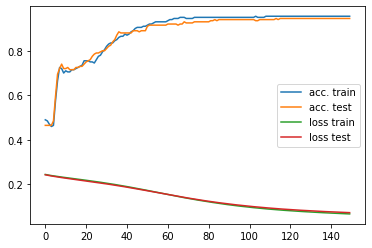

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code  here ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        optim.zero_grad() 
        outputs = model(X)
       # print(outputs)
        #print(Y)
        tloss = loss(outputs,Y)
        tloss.backward()
        optim.step() 
  
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy
        # the forward with the predict method from the model
        # the backward function with autograd
        # and then an optimization step

    ####################
    ##      FIN        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, 100*acctrain, Ltrain, 100*acctest, Ltest)
    print(title) 
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 5 : MNIST

Apply the code from previous part code to the MNIST dataset.

In [ ]:
def init_model(nx, nh, ny, eta):

    #####################
    ## Your code here  ##
    #####################

    model = torch.nn.Sequential(
        torch.nn.Linear(nx, nh),
        torch.nn.ReLU(),
        torch.nn.Linear(nh, ny),
    )
    loss = torch.nn.CrossEntropyLoss()
    optim = torch.optim.SGD(model.parameters(), lr=eta)

    ####################
    ##      END        #
    ####################

    return model, loss, optim

In [ ]:
# init
data = MNISTData()
N = data.Xtrain.shape[0]
Nbatch = 100
nx = data.Xtrain.shape[1]
nh = 100
ny = data.Ytrain.shape[1]
eta = 0.03


model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code  here ##
    #####################
    # batches

    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
        optim.zero_grad() 
        outputs = model(X)
        tloss = loss(outputs,torch.argmax(Y,1))
        tloss.backward()
        optim.step() 
  
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy
        # the forward with the predict method from the model
        # the backward function with autograd
        # and then an optimization step

    ####################
    ##      FIN        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain = loss(Yhat_train,torch.argmax(data.Ytrain,1))
    Ltest = loss(Yhat_test,torch.argmax(data.Ytest,1))
    acctrain = (torch.argmax(Yhat_train,1) == torch.argmax(data.Ytrain,1)).sum().item()/data.Ytrain.size(0)
    acctest = (torch.argmax(Yhat_test,1) == torch.argmax(data.Ytest,1)).sum().item()/data.Ytest.size(0)
    
    #Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, 100*acctrain, Ltrain, 100*acctest, Ltest)
    print(title) 
    #data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()



Iter 0: Acc train 11.2% (2.30), acc test 11.3% (2.30)
Iter 1: Acc train 11.2% (2.30), acc test 11.3% (2.30)
Iter 2: Acc train 11.2% (2.30), acc test 11.3% (2.30)


KeyboardInterrupt: ignored

# Part 6: Bonus: SVM


Train a SVM model on the Circles dataset.

Ideas : 
- First try a linear SVM (sklearn.svm.LinearSVC dans scikit-learn). Does it work well ? Why ?
- Then try more complex kernels (sklearn.svm.SVC). Which one is the best ? why ?
- Does the parameter C of regularization have an impact? Why ?

In [ ]:
# data
data = CirclesData()
Xtrain = data.Xtrain.numpy()
Ytrain = data.Ytrain[:, 0].numpy()

Xgrid = data.Xgrid.numpy()

Xtest = data.Xtest.numpy()
Ytest = data.Ytest[:, 0].numpy()

def plot_svm_predictions(data, predictions):
      plt.figure(2)
      plt.clf()
      plt.imshow(np.reshape(predictions, (40,40)))
      plt.plot(data._Xtrain[data._Ytrain[:,0] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,0] == 1,1]*10+20, 'bo', label="Train")
      plt.plot(data._Xtrain[data._Ytrain[:,1] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,1] == 1,1]*10+20, 'ro')
      plt.plot(data._Xtest[data._Ytest[:,0] == 1,0]*10+20, data._Xtest[data._Ytest[:,0] == 1,1]*10+20, 'b+', label="Test")
      plt.plot(data._Xtest[data._Ytest[:,1] == 1,0]*10+20, data._Xtest[data._Ytest[:,1] == 1,1]*10+20, 'r+')
      plt.xlim(0,39)
      plt.ylim(0,39)
      plt.clim(0.3,0.7)
      plt.draw()
      plt.pause(1e-3)

In [ ]:
import sklearn.svm

############################
### Your code here   #######
### Train the SVM    #######
## See https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html
## and https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
############################

svm = None

###########################

In [ ]:
## Print results

Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)